# Final Proyect Data Scientist Path



## Project Scoping


### United Nations provides with data related to countries population. The data include prognosis till 2100. The scope of this project is to dig into the data in order to provide with useful tools that can give rise conclusions related to population and countries features. 


##### Data Source


Data are collected from:

 
United Nations https://population.un.org/wpp/Download/Standard/CSV/

#### Main tasks

Data adquisition 
Data transformation
Data Visualization
Supervised and Unsupervised Machine Learning


#### Importing data

In [1]:
import pandas as pd
from matplotlib import pyplot as plt 
import numpy as np
import tkinter as tk
import tkinter.messagebox

rd = pd.read_csv('WPP2019.csv')
print(rd.tail())

apd = rd[rd['Location']=='Spain']


        LocID  Location  VarID      Variant  Time  MidPeriod    PopMale  \
280927    716  Zimbabwe    207  Lower 95 PI  2080     2080.5  10576.533   
280928    716  Zimbabwe    207  Lower 95 PI  2085     2085.5  10293.349   
280929    716  Zimbabwe    207  Lower 95 PI  2090     2090.5   9920.336   
280930    716  Zimbabwe    207  Lower 95 PI  2095     2095.5   9503.711   
280931    716  Zimbabwe    207  Lower 95 PI  2100     2100.5   9090.075   

        PopFemale   PopTotal  PopDensity  
280927  11255.983  21836.893      56.448  
280928  11050.875  21355.988      55.205  
280929  10767.709  20689.956      53.483  
280930  10412.184  19892.080      51.421  
280931   9996.105  19061.177      49.273  


##### print head to get a glimpse

apd needs index to be reiniciated in order to manage better information

In [2]:
print(rd.tail())



        LocID  Location  VarID      Variant  Time  MidPeriod    PopMale  \
280927    716  Zimbabwe    207  Lower 95 PI  2080     2080.5  10576.533   
280928    716  Zimbabwe    207  Lower 95 PI  2085     2085.5  10293.349   
280929    716  Zimbabwe    207  Lower 95 PI  2090     2090.5   9920.336   
280930    716  Zimbabwe    207  Lower 95 PI  2095     2095.5   9503.711   
280931    716  Zimbabwe    207  Lower 95 PI  2100     2100.5   9090.075   

        PopFemale   PopTotal  PopDensity  
280927  11255.983  21836.893      56.448  
280928  11050.875  21355.988      55.205  
280929  10767.709  20689.956      53.483  
280930  10412.184  19892.080      51.421  
280931   9996.105  19061.177      49.273  



##### The data have duplicated information 




In [3]:
apd = apd.drop_duplicates(apd.columns[~apd.columns.isin(['Time'])],
                        keep='first')
apd = apd.reset_index() ##to reset index
pSpain = apd['PopTotal']
year = apd['Time']
year.duplicated()
apd['Duplicated']=year.duplicated()



In [4]:
dup = apd[700:884]
print(dup)

      index  LocID Location  VarID      Variant  Time  MidPeriod    PopMale  \
700  235617    724    Spain      9    No change  2083     2083.5  13943.229   
701  235618    724    Spain      9    No change  2084     2084.5  13816.463   
702  235619    724    Spain      9    No change  2085     2085.5  13690.220   
703  235620    724    Spain      9    No change  2086     2086.5  13564.237   
704  235621    724    Spain      9    No change  2087     2087.5  13438.342   
..      ...    ...      ...    ...          ...   ...        ...        ...   
879  235796    724    Spain    207  Lower 95 PI  2080     2080.5  14841.535   
880  235797    724    Spain    207  Lower 95 PI  2085     2085.5  14232.063   
881  235798    724    Spain    207  Lower 95 PI  2090     2090.5  13676.302   
882  235799    724    Spain    207  Lower 95 PI  2095     2095.5  13057.003   
883  235800    724    Spain    207  Lower 95 PI  2100     2100.5  12449.258   

     PopFemale   PopTotal  PopDensity  Duplicated  

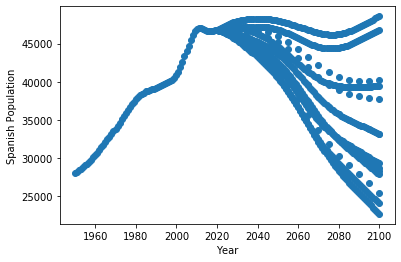

True


In [5]:


plt.scatter(year,pSpain)
plt.xlabel('Year')
plt.ylabel('Spanish Population')
plt.show()
print(apd.iloc[882,11])


## The data can be splitted in two groups:

A. Current data (population data till last date of report) 
B. Model data (Scenarios prognosis)

Next Step: Split data into two groups



In [6]:
indexNames = apd[ apd['Duplicated'] == True ].index
apd= apd.drop(indexNames)
                

                

        
        


        

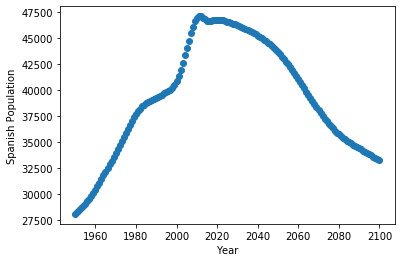

In [7]:
pSpain = apd['PopTotal']
year = apd['Time']
plt.scatter(year,pSpain)
plt.xlabel('Year')
plt.ylabel('Spanish Population')
plt.show()



### Erase duplicated data from whole data

In this case same methodology cannot be used, as we have duplicated years that cannot be erased as they correspond with different locations


In [8]:
pair = rd[['Location','Time']]
print(pair)




           Location  Time
0       Afghanistan  1950
1       Afghanistan  1951
2       Afghanistan  1952
3       Afghanistan  1953
4       Afghanistan  1954
...             ...   ...
280927     Zimbabwe  2080
280928     Zimbabwe  2085
280929     Zimbabwe  2090
280930     Zimbabwe  2095
280931     Zimbabwe  2100

[280932 rows x 2 columns]


In [9]:
rd['Duplicated']=pair.duplicated()
indexName = rd[ rd['Duplicated'] == True ].index
rd= rd.drop(indexName)
                
countries=rd['Location']
print(countries.tail())

280194    Zimbabwe
280195    Zimbabwe
280196    Zimbabwe
280197    Zimbabwe
280198    Zimbabwe
Name: Location, dtype: object


In [10]:
print(countries)
type(countries)

0         Afghanistan
1         Afghanistan
2         Afghanistan
3         Afghanistan
4         Afghanistan
             ...     
280194       Zimbabwe
280195       Zimbabwe
280196       Zimbabwe
280197       Zimbabwe
280198       Zimbabwe
Name: Location, Length: 71574, dtype: object


pandas.core.series.Series

In [11]:
ac= np.array(countries)
type(ac)
print(ac)

lc, indices =np.unique(ac, return_index=True)

#np.unique(lc)
#countries['Duplicated']=countries.duplicated()
print(lc)

['Afghanistan' 'Afghanistan' 'Afghanistan' ... 'Zimbabwe' 'Zimbabwe'
 'Zimbabwe']
['Afghanistan' 'Africa' 'African Group' 'African Union'
 'African Union: Central Africa' 'African Union: Eastern Africa'
 'African Union: Northern Africa' 'African Union: Southern Africa'
 'African Union: Western Africa'
 'African, Caribbean and Pacific (ACP) Group of States' 'Albania'
 'Algeria' 'American Samoa' 'Andean Community' 'Andorra' 'Angola'
 'Anguilla' 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Aruba' 'Asia'
 'Asia-Pacific Economic Cooperation (APEC)' 'Asia-Pacific Group'
 'Association of Southeast Asian Nations (ASEAN)' 'Australia'
 'Australia/New Zealand' 'Austria' 'Azerbaijan' 'BRIC' 'BRICS' 'Bahamas'
 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium' 'Belize'
 'Belt-Road Initiative (BRI)' 'Belt-Road Initiative: Africa'
 'Belt-Road Initiative: Asia' 'Belt-Road Initiative: Europe'
 'Belt-Road Initiative: Latin America and the Caribbean'
 'Belt-Road Initiative: Pacific' 'Benin' 'Bermuda' 

After obtaining the list of countries it was discovered that the data include supra-naciotal entities

It is interesting to have the possibility of select country/National entities in order to now the population of those.


['Afghanistan' 'Africa' 'African Group' 'African Union'
 'African Union: Central Africa' 'African Union: Eastern Africa'
 'African Union: Northern Africa' 'African Union: Southern Africa'
 'African Union: Western Africa'
 'African, Caribbean and Pacific (ACP) Group of States' 'Albania'
 'Algeria' 'American Samoa' 'Andean Community' 'Andorra' 'Angola'
 'Anguilla' 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Aruba' 'Asia'
 'Asia-Pacific Economic Cooperation (APEC)' 'Asia-Pacific Group'
 'Association of Southeast Asian Nations (ASEAN)' 'Australia'
 'Australia/New Zealand' 'Austria' 'Azerbaijan' 'BRIC' 'BRICS' 'Bahamas'
 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium' 'Belize'
 'Belt-Road Initiative (BRI)' 'Belt-Road Initiative: Africa'
 'Belt-Road Initiative: Asia' 'Belt-Road Initiative: Europe'
 'Belt-Road Initiative: Latin America and the Caribbean'
 'Belt-Road Initiative: Pacific' 'Benin' 'Bermuda' 'Bhutan'
 'Black Sea Economic Cooperation (BSEC)'
 'Bolivarian Alliance for the Am

Select a country from listSpain


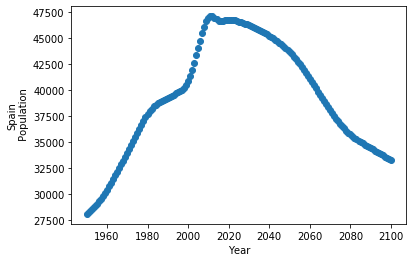

Do you want to select another Countryno


In [12]:
#this code allows user to watch population charts of every entitite listed into the United Nations list

option = 'yes'
print(lc)

while option != 'no':
    
    sc= input("Select a country from list")
    if sc in rd.values:
        scd = rd[rd['Location']==sc]
        #cd selected country data
        pscd = scd['PopTotal']
        yscd = scd['Time']
        plt.scatter(yscd,pscd)
        plt.xlabel('Year')
        plt.ylabel(sc + '\n Population')
        plt.show()
    else:
        print('Selection is not listed. Please try again')
    
    
    option = input('Do you want to select another Country')


# Growth rate and classification

The goal of this subset is to evaluate two growth rates (historic and prognosis) in every country/entitie and make a classification related to these values.

### Regression model is used in order to deduct growth rates: Historic and prognosis


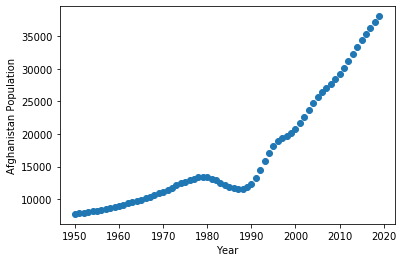

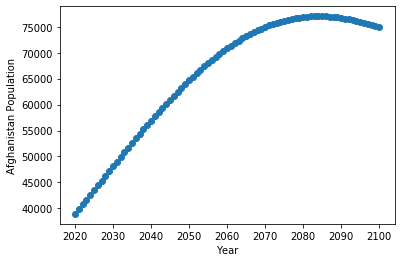

(array([[397.32851971]]), array([[474.23004593]]))


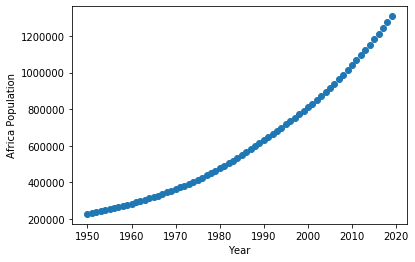

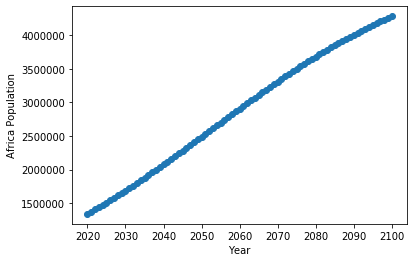

(array([[15142.4322284]]), array([[38440.98109593]]))


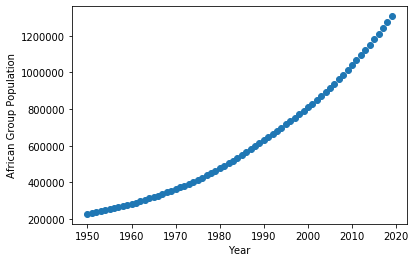

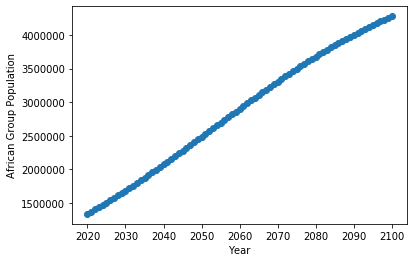

(array([[15120.61682799]]), array([[38425.31205881]]))


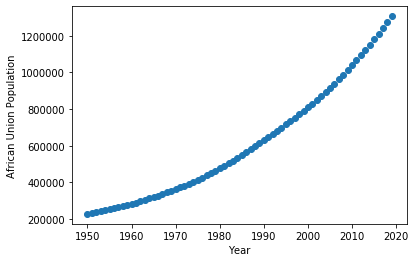

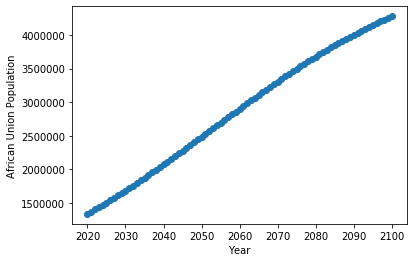

(array([[15129.17213761]]), array([[38435.03013049]]))


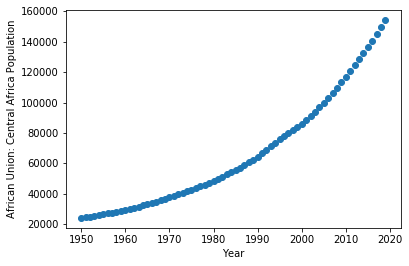

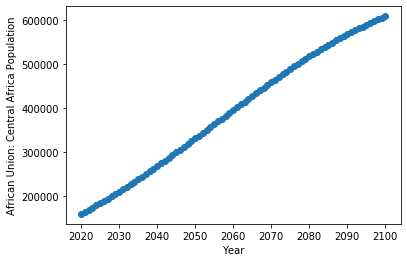

(array([[1750.2206176]]), array([[5936.25171558]]))


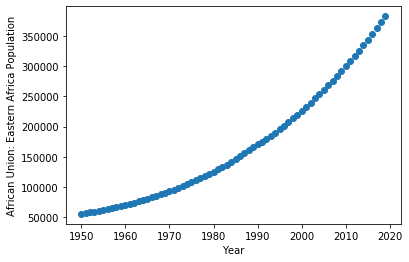

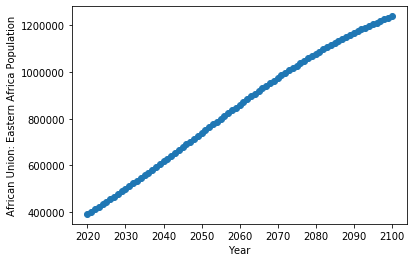

(array([[4571.40299067]]), array([[11051.98423616]]))


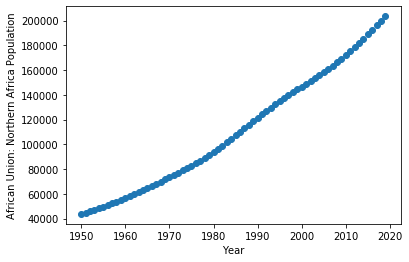

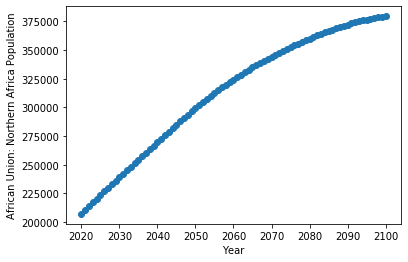

(array([[2334.01686243]]), array([[2207.57074225]]))


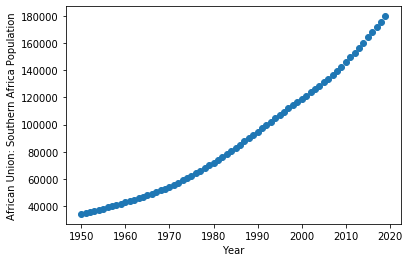

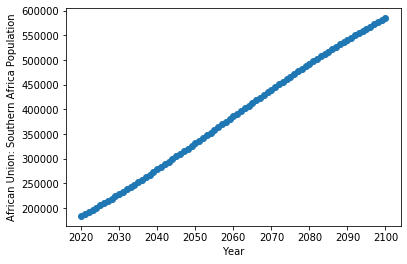

(array([[2089.29879771]]), array([[5186.41582997]]))


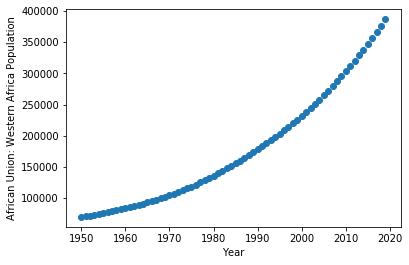

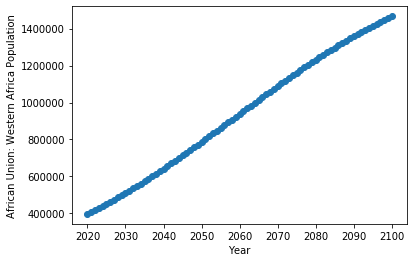

(array([[4384.2328692]]), array([[14052.80760653]]))


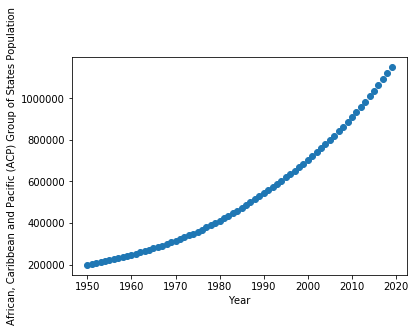

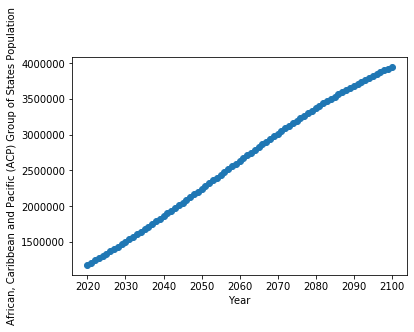

(array([[13250.0577009]]), array([[36258.69178094]]))


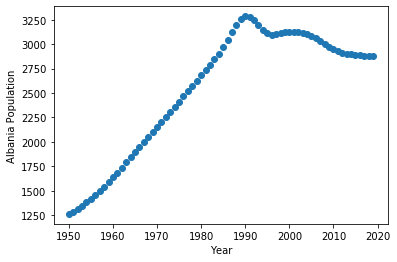

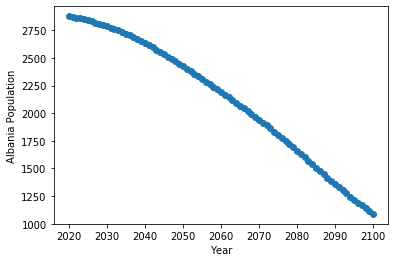

(array([[27.30426379]]), array([[-23.5025135]]))


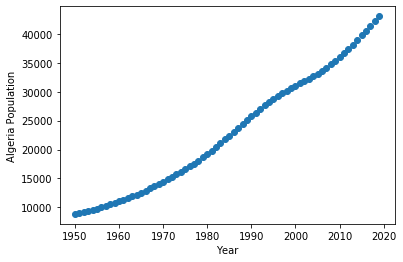

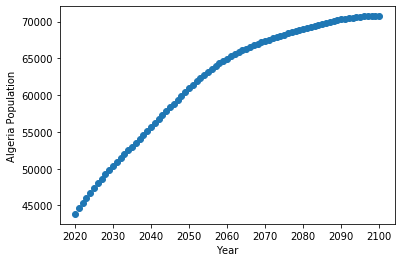

(array([[507.14479787]]), array([[332.92126459]]))


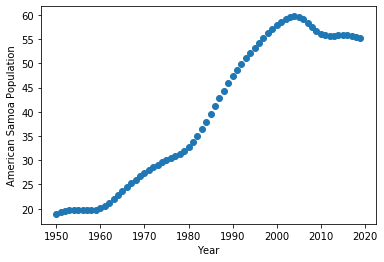

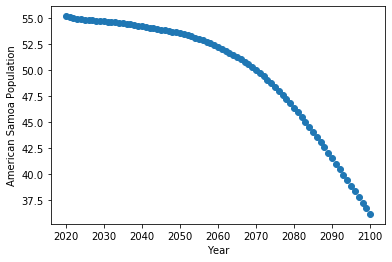

(array([[0.71637458]]), array([[-0.21930851]]))


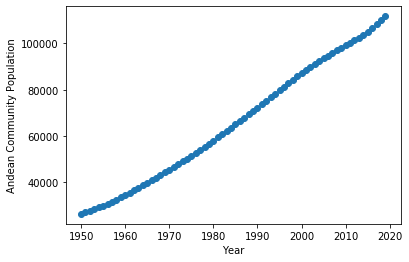

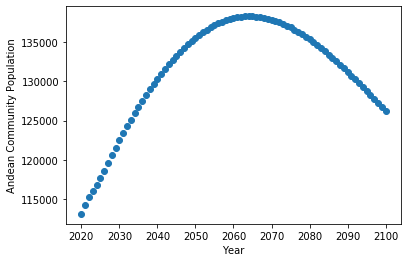

(array([[1288.54497502]]), array([[145.70160508]]))


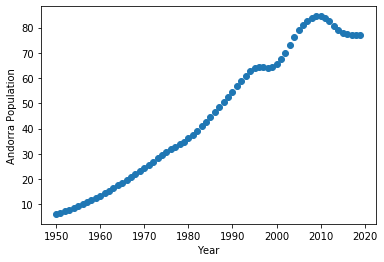

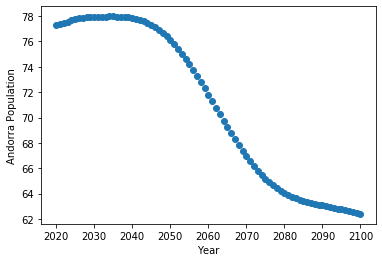

(array([[1.28062934]]), array([[-0.25547482]]))


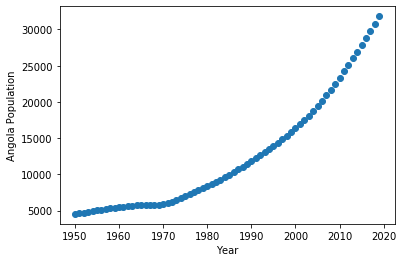

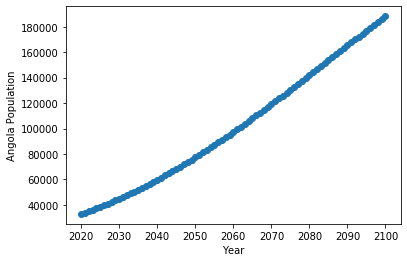

(array([[363.22083167]]), array([[2001.53593031]]))


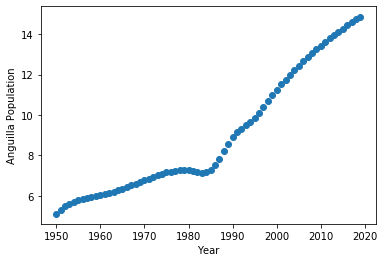

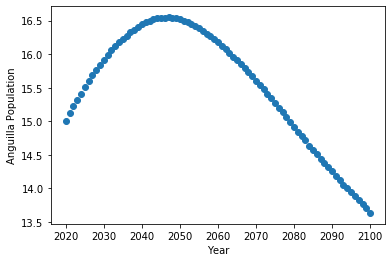

(array([[0.14361664]]), array([[-0.02714304]]))


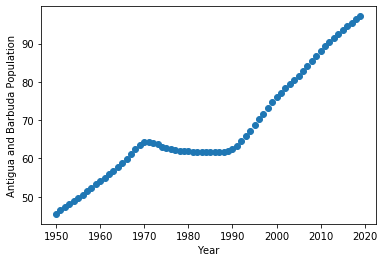

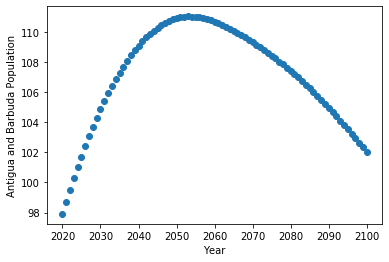

(array([[0.64807721]]), array([[0.00521089]]))


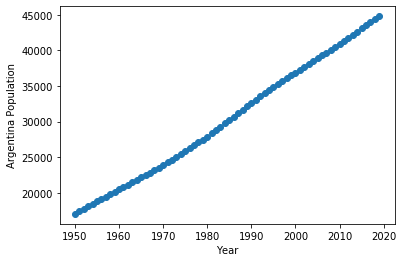

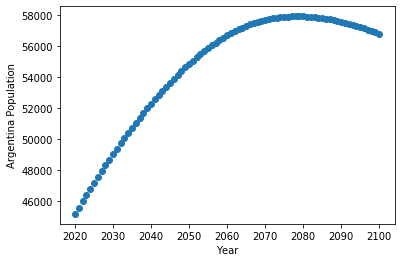

(array([[410.64027175]]), array([[142.91334616]]))


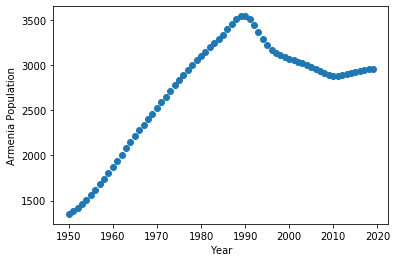

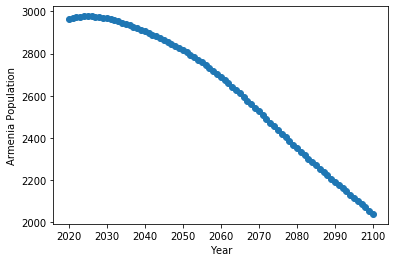

(array([[22.1446559]]), array([[-12.76362925]]))


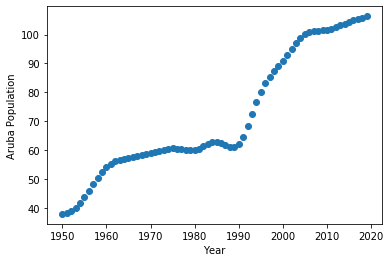

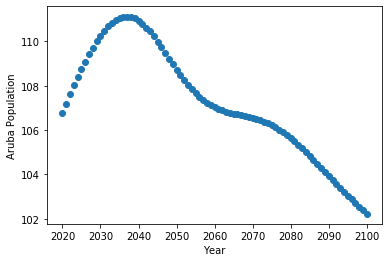

(array([[0.99839388]]), array([[-0.09543146]]))


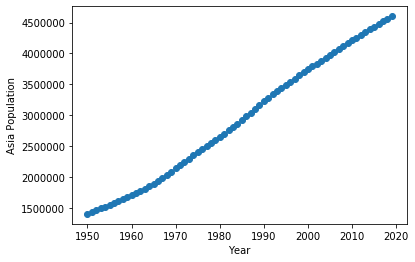

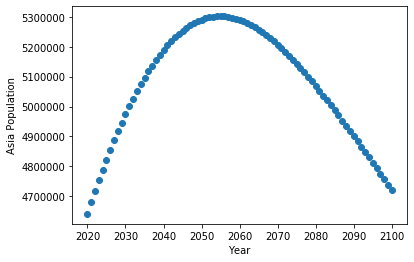

(array([[49391.52639958]]), array([[-1002.27464914]]))


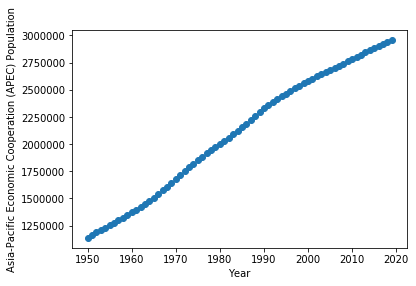

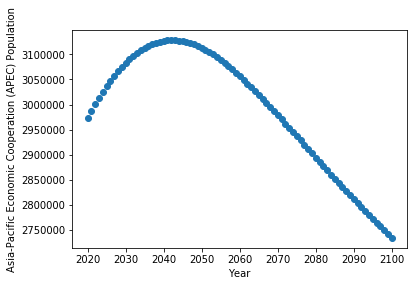

(array([[27989.14320255]]), array([[-4392.18920768]]))


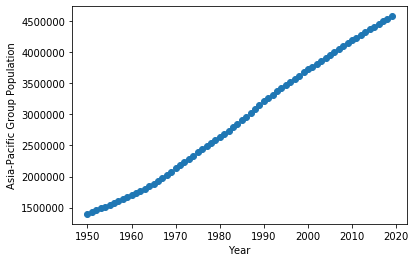

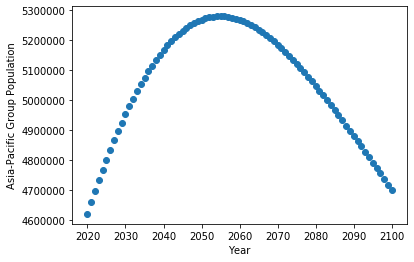

(array([[49226.34348827]]), array([[-990.5073956]]))


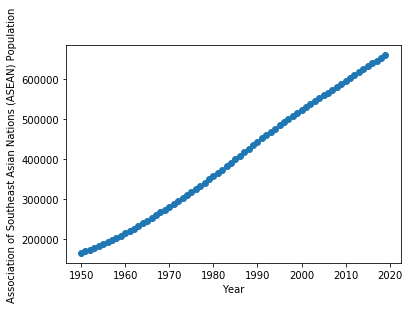

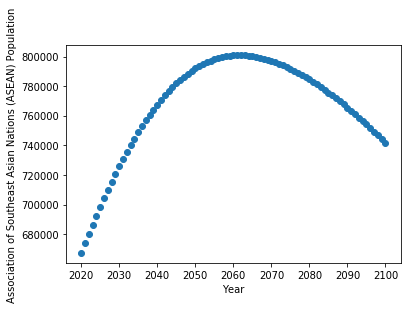

(array([[7583.85539157]]), array([[683.92842665]]))


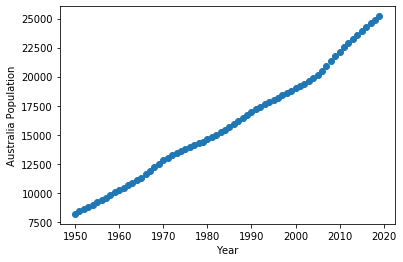

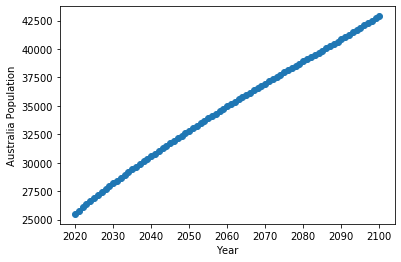

(array([[235.78531394]]), array([[212.34027873]]))


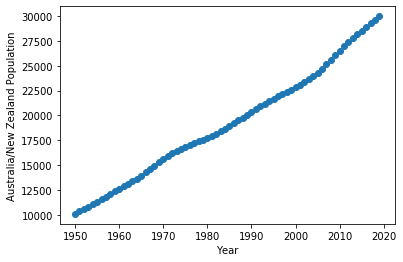

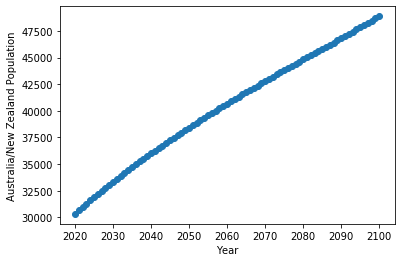

(array([[275.27971712]]), array([[225.8590362]]))


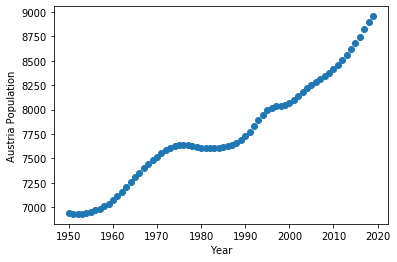

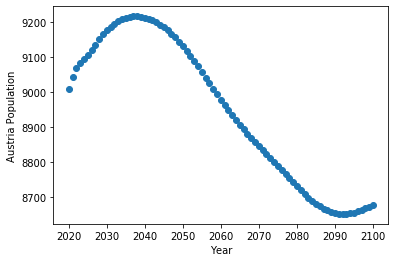

(array([[26.23574454]]), array([[-8.1832164]]))


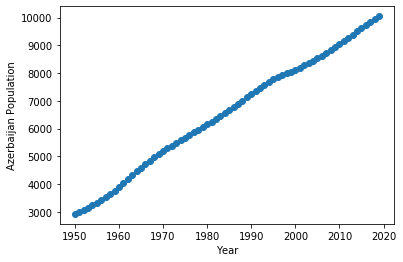

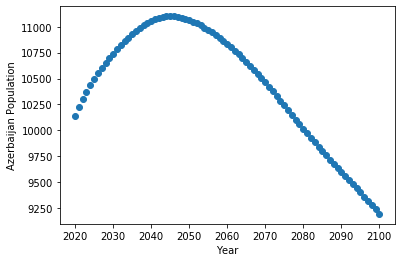

(array([[102.90518191]]), array([[-18.65039521]]))


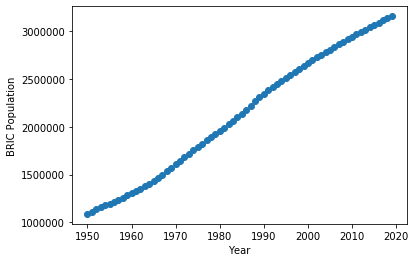

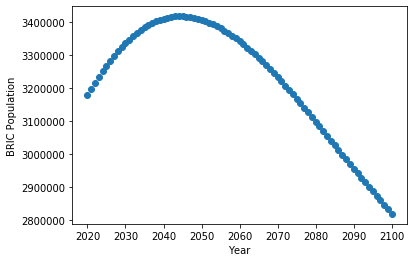

(array([[32318.14628104]]), array([[-6137.31402495]]))


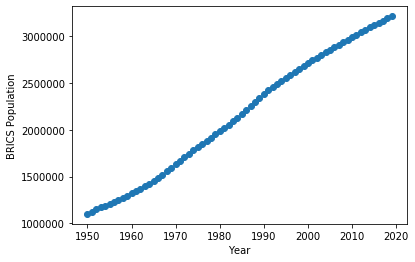

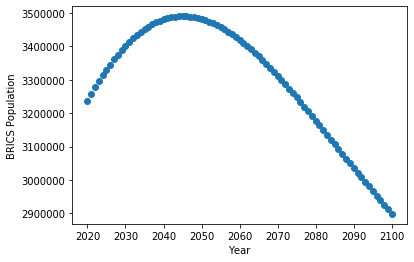

(array([[33004.26716796]]), array([[-5904.7696743]]))


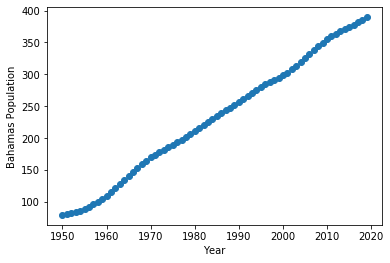

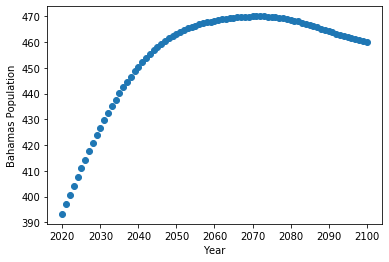

(array([[4.67916039]]), array([[0.64637748]]))


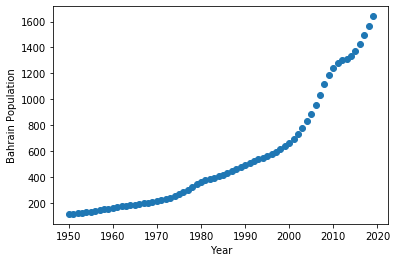

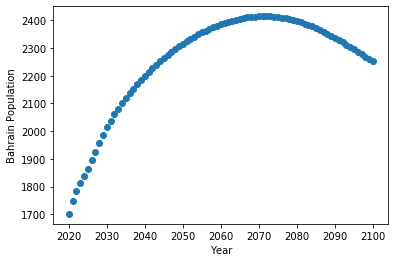

(array([[19.66907431]]), array([[5.72876055]]))


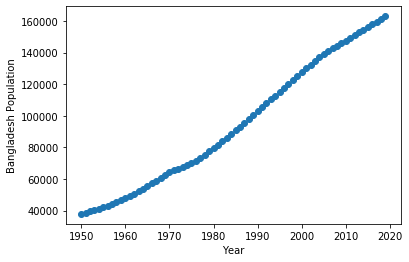

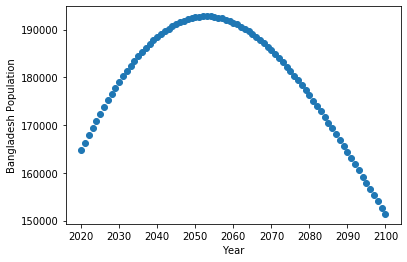

(array([[1958.85306682]]), array([[-236.15650447]]))


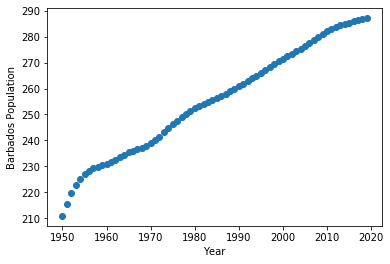

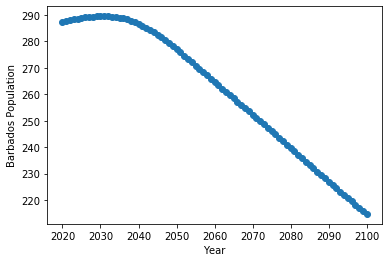

(array([[1.02253665]]), array([[-1.03265477]]))


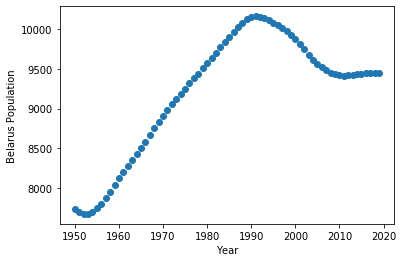

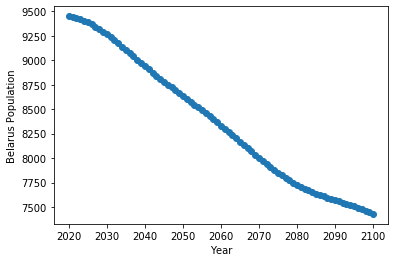

(array([[28.71517222]]), array([[-27.86049302]]))


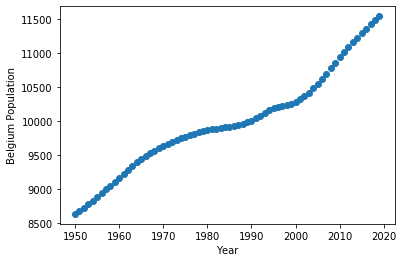

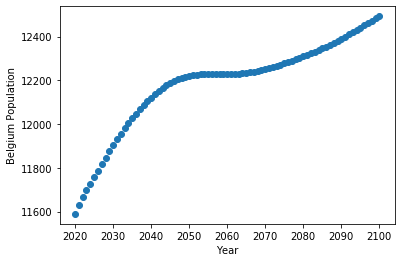

(array([[35.21682675]]), array([[8.17482489]]))


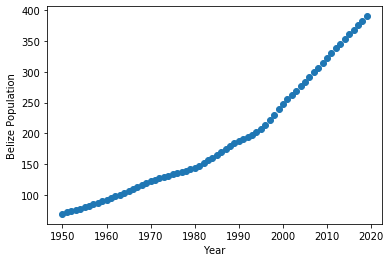

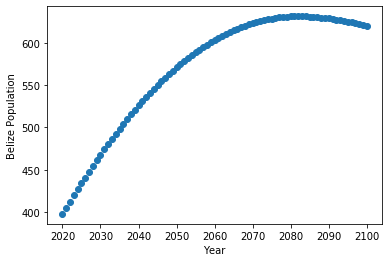

(array([[4.50600567]]), array([[2.70599248]]))


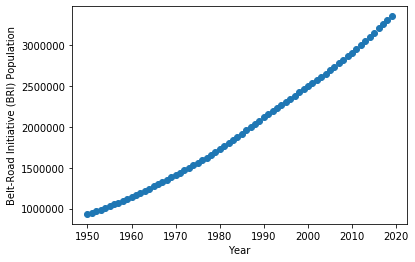

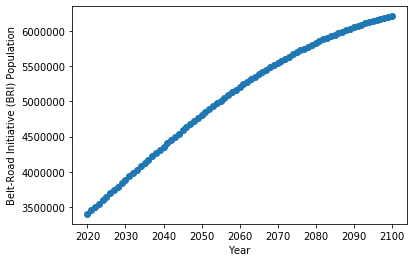

(array([[35340.21387665]]), array([[35929.15098934]]))


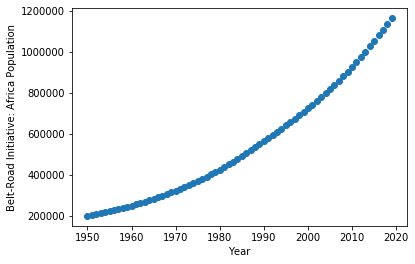

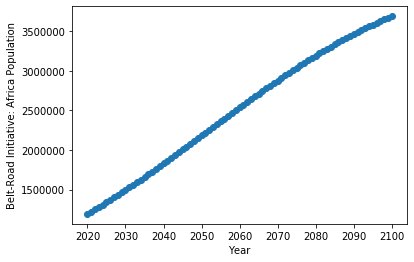

(array([[13531.12684271]]), array([[32588.39907525]]))


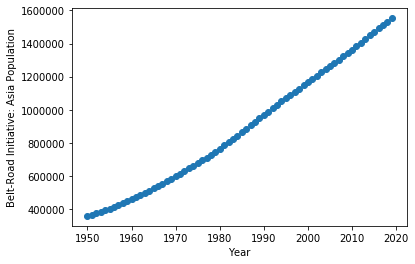

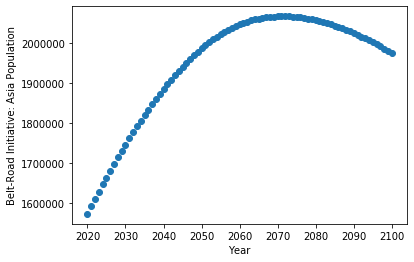

(array([[17970.35737983]]), array([[4672.69752017]]))


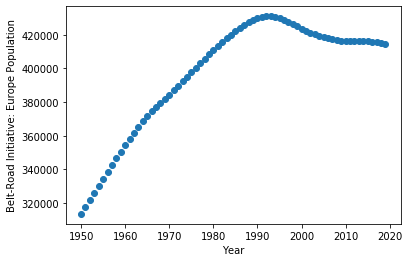

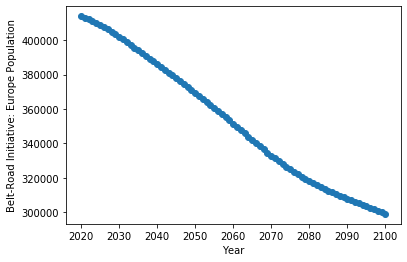

(array([[1373.63229109]]), array([[-1563.27043814]]))


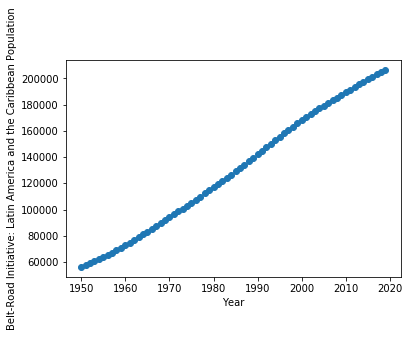

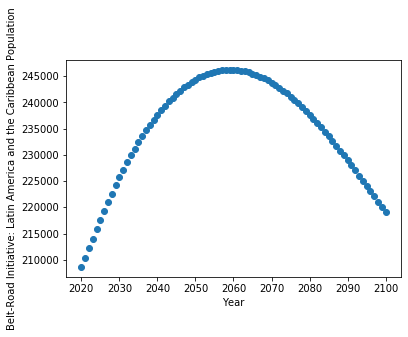

(array([[2310.09100639]]), array([[64.5379635]]))


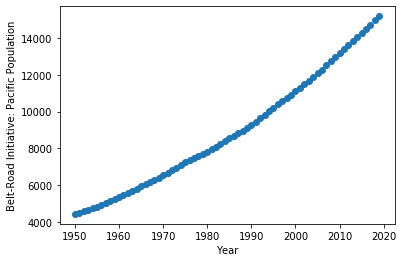

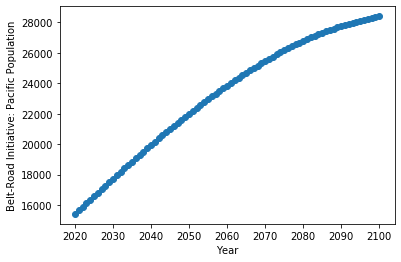

(array([[155.00635664]]), array([[166.78686856]]))


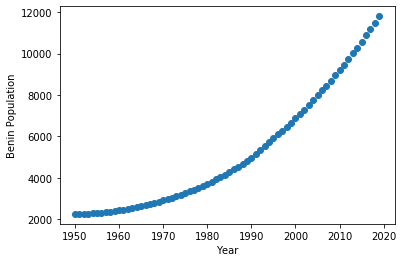

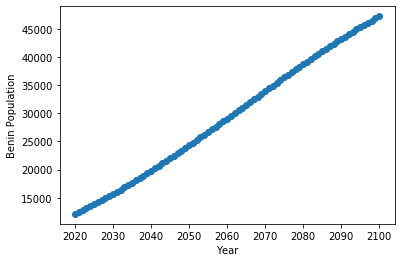

(array([[134.1582172]]), array([[456.22221942]]))


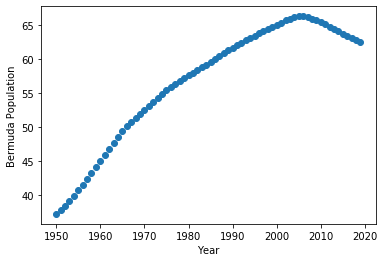

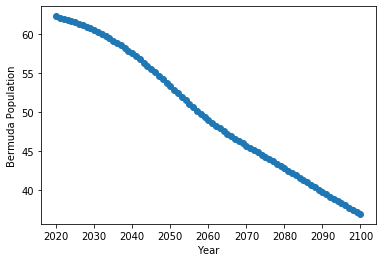

(array([[0.40175986]]), array([[-0.34242403]]))


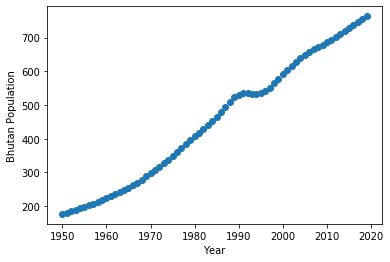

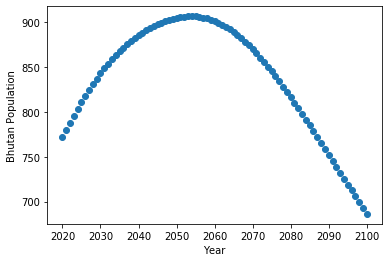

(array([[9.11383821]]), array([[-1.42629743]]))


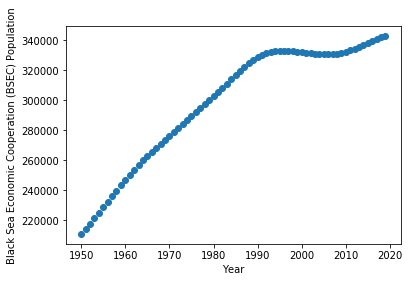

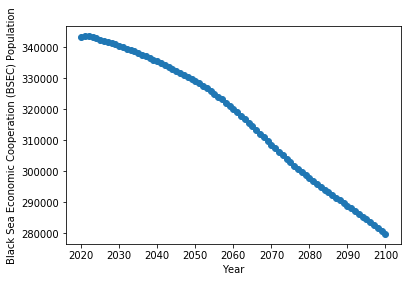

(array([[1850.23657216]]), array([[-863.26118171]]))


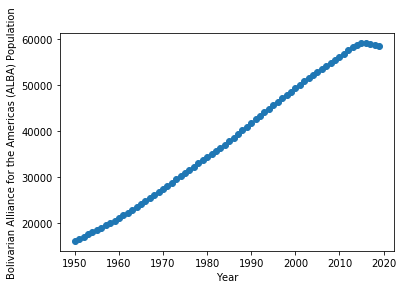

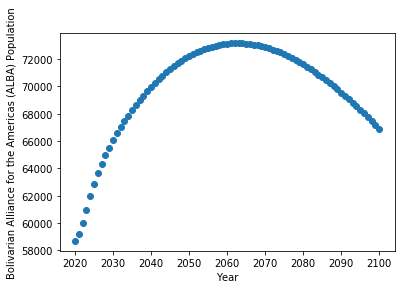

(array([[682.57109184]]), array([[68.26685537]]))


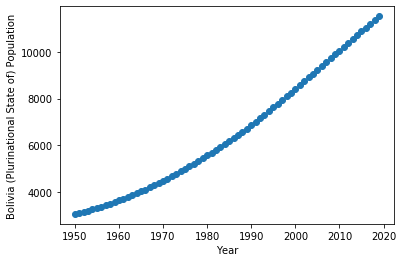

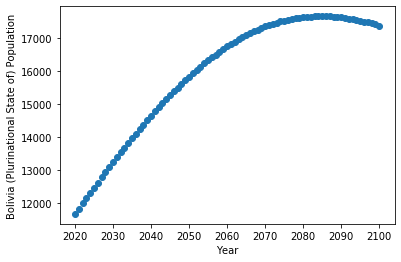

(array([[125.94265184]]), array([[73.14195926]]))


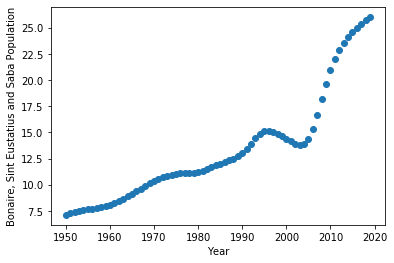

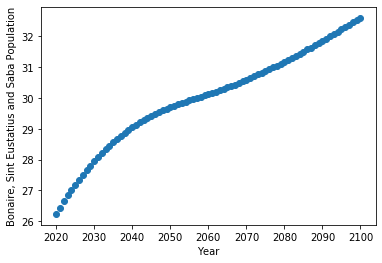

(array([[0.23479617]]), array([[0.06650226]]))


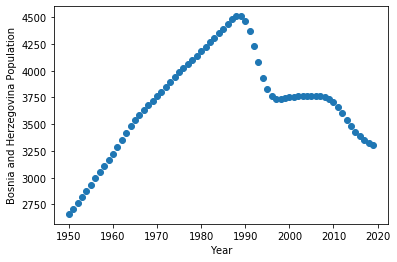

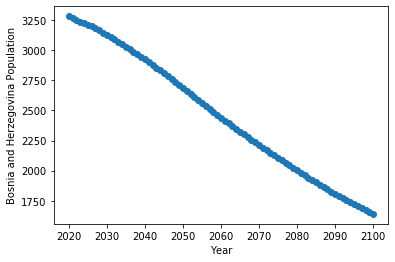

(array([[8.1255501]]), array([[-21.78489591]]))


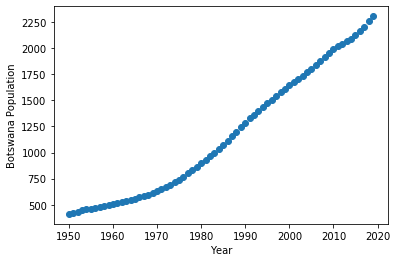

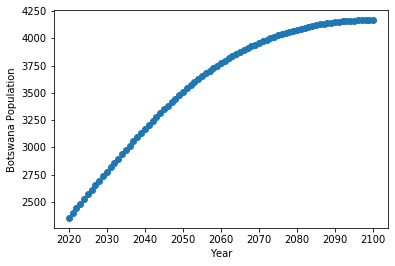

(array([[29.20181254]]), array([[22.7846981]]))


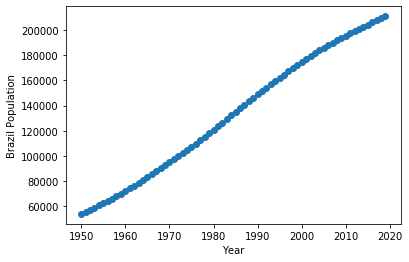

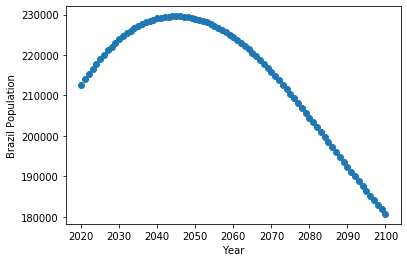

(array([[2441.59869046]]), array([[-508.81153611]]))


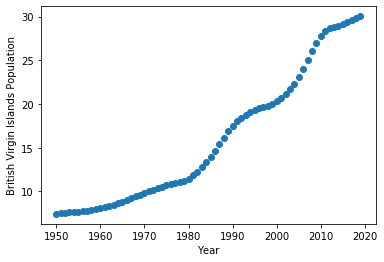

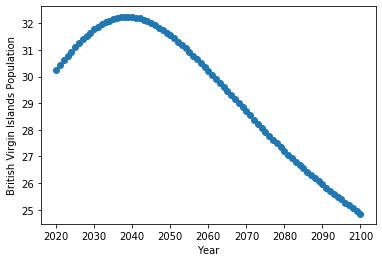

(array([[0.361013]]), array([[-0.09491321]]))


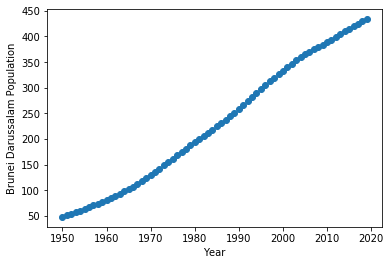

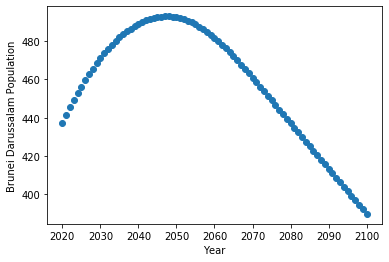

(array([[6.0675716]]), array([[-0.93604761]]))


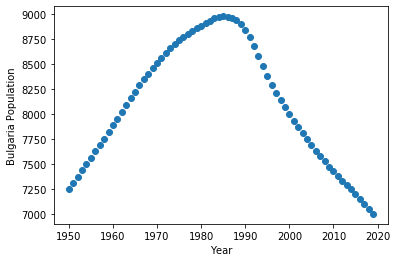

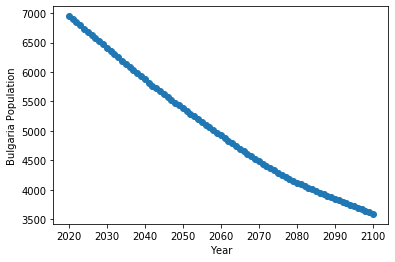

(array([[-7.47738135]]), array([[-42.84253144]]))


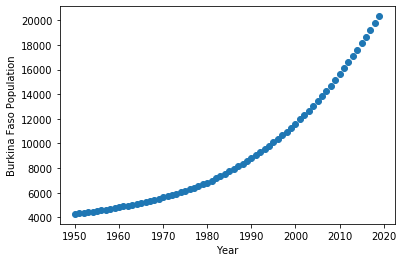

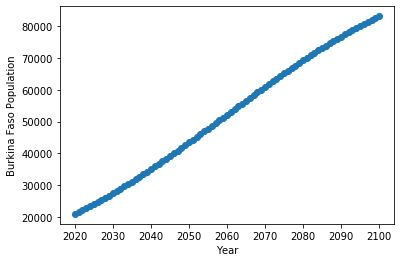

(array([[215.73867037]]), array([[817.88087306]]))


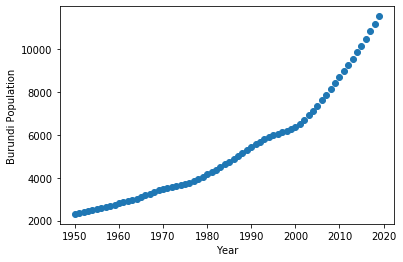

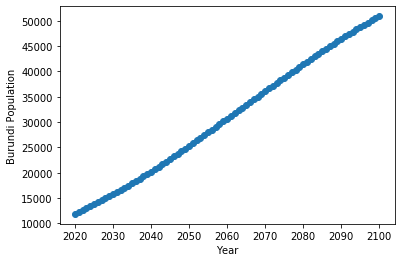

(array([[118.87076289]]), array([[508.62922486]]))


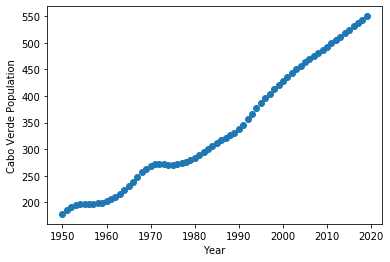

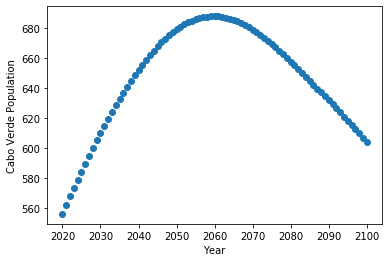

(array([[5.53217678]]), array([[0.37934837]]))


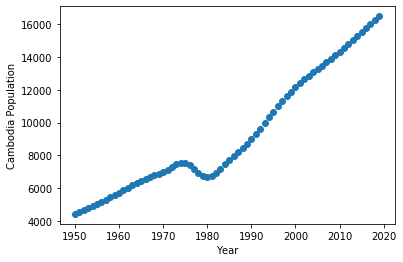

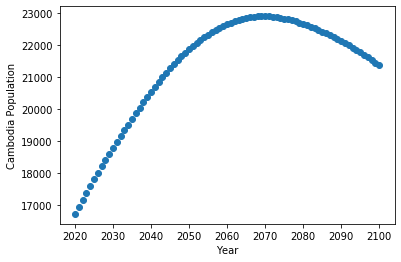

(array([[171.79073831]]), array([[55.61939079]]))


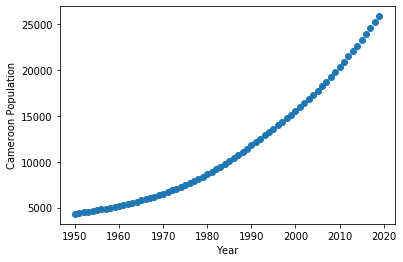

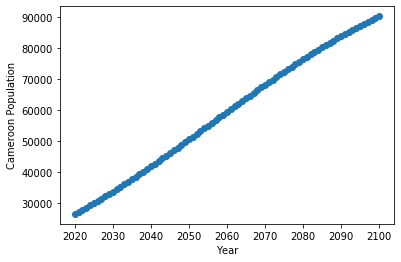

(array([[303.00303025]]), array([[829.6946175]]))


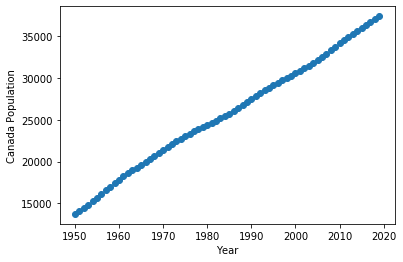

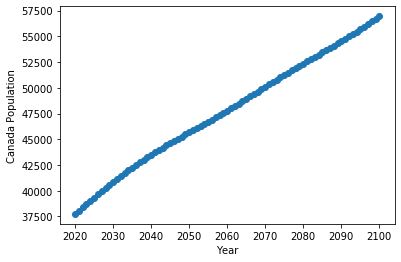

(array([[329.83595082]]), array([[230.41551186]]))


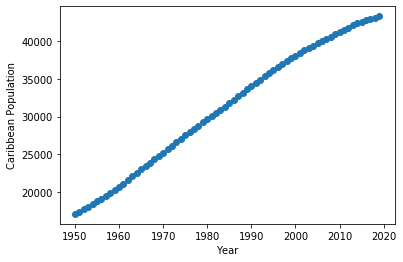

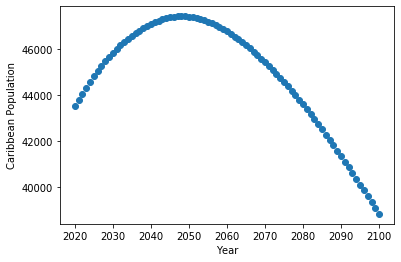

(array([[405.55688431]]), array([[-73.01897103]]))


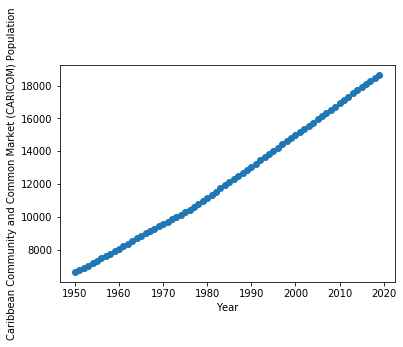

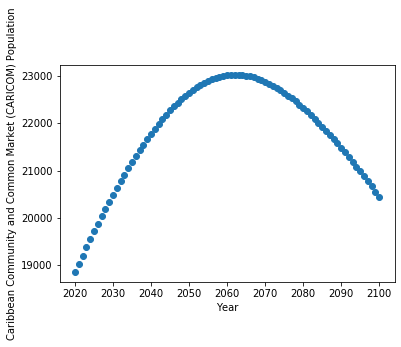

(array([[176.76142938]]), array([[16.79303358]]))


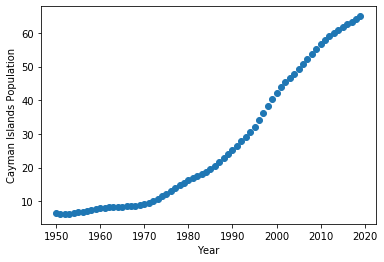

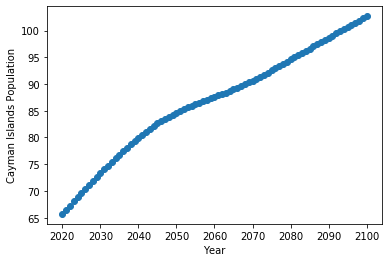

(array([[0.94024575]]), array([[0.41897523]]))


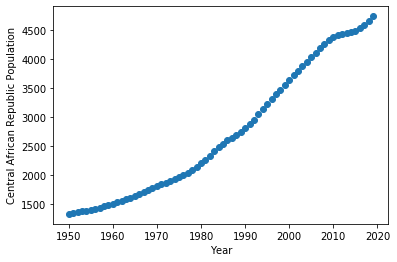

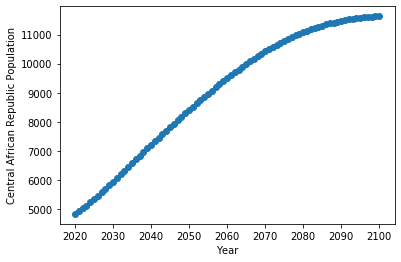

(array([[54.60125746]]), array([[91.38965093]]))


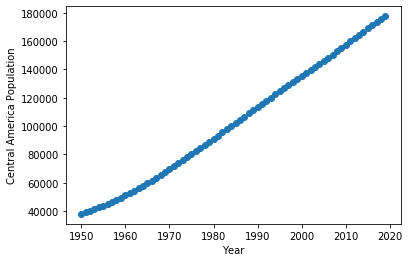

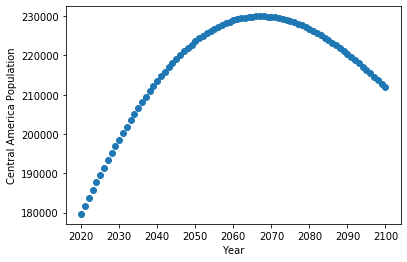

(array([[2103.40610125]]), array([[367.39190221]]))


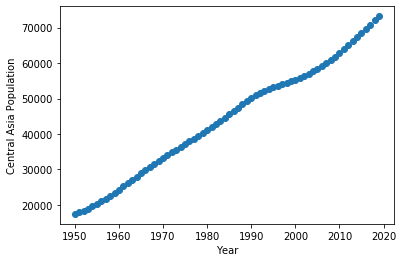

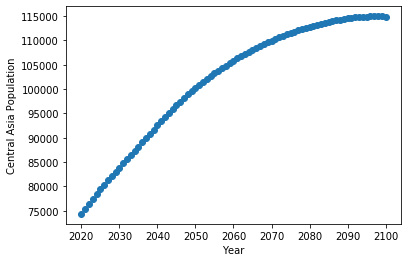

(array([[783.29558847]]), array([[507.40927486]]))


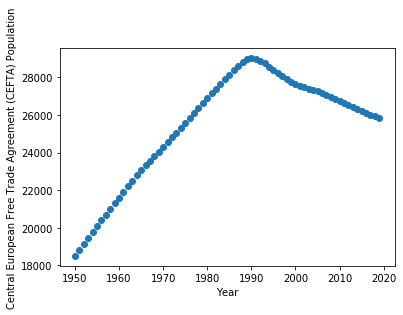

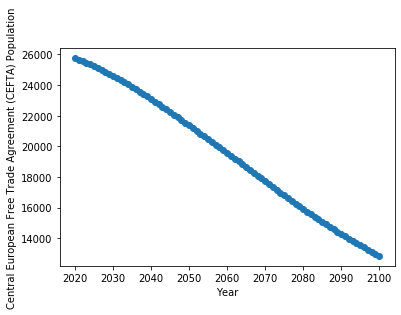

(array([[110.2312003]]), array([[-170.65044106]]))


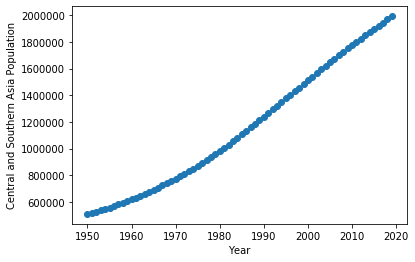

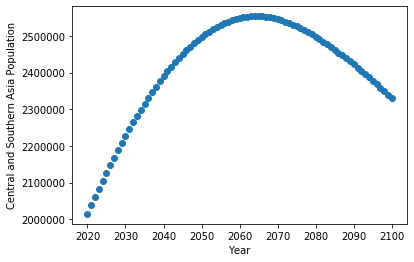

(array([[22756.57285581]]), array([[3326.75433722]]))


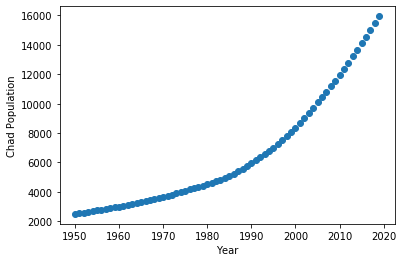

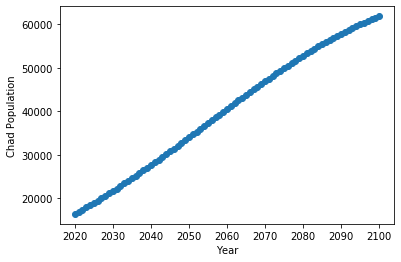

(array([[178.16650501]]), array([[598.4434593]]))


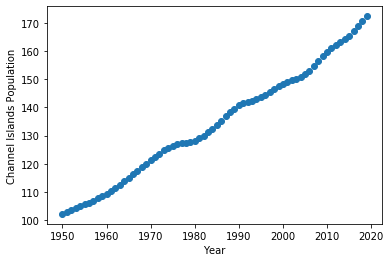

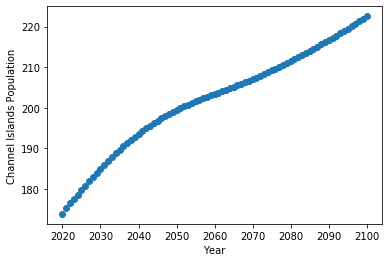

(array([[0.97855537]]), array([[0.53148401]]))


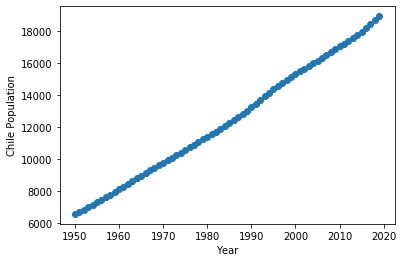

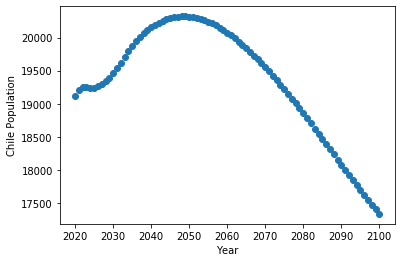

(array([[179.26689997]]), array([[-25.50214889]]))


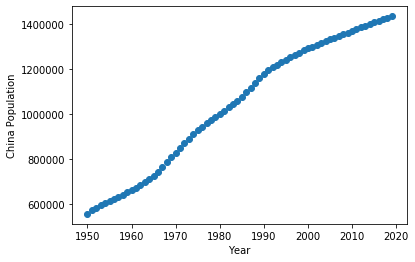

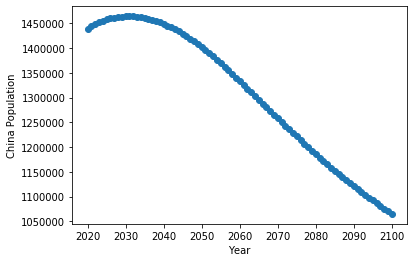

(array([[13958.40238266]]), array([[-5631.76437349]]))


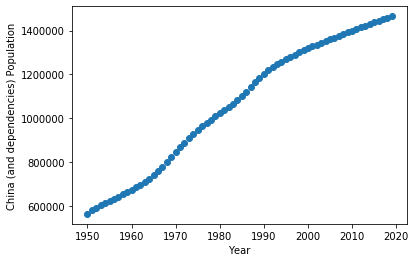

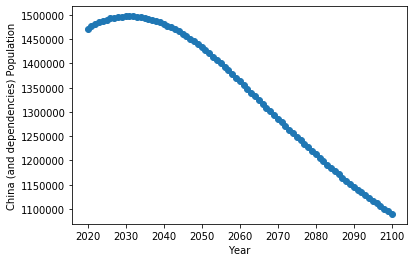

(array([[14289.49358863]]), array([[-5748.81145314]]))


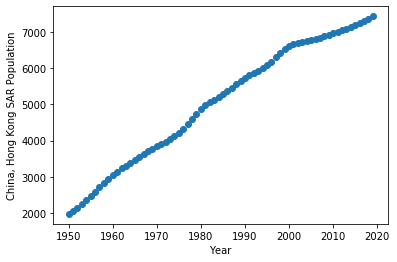

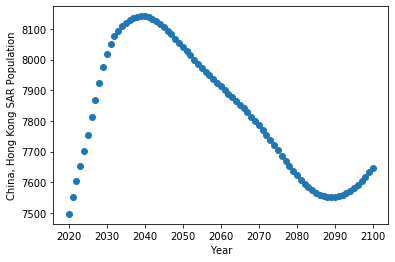

(array([[81.28601881]]), array([[-5.76961021]]))


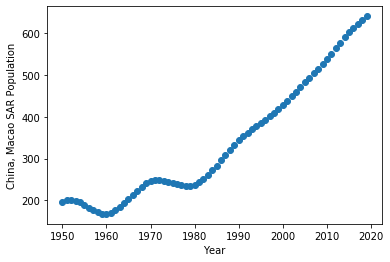

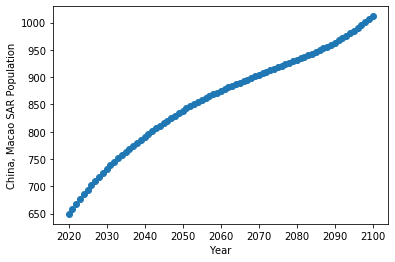

(array([[6.80013351]]), array([[3.97653015]]))


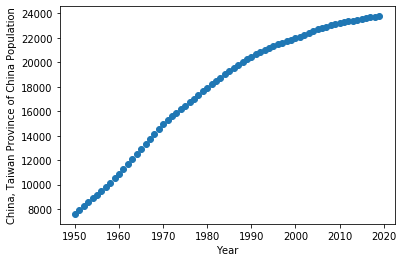

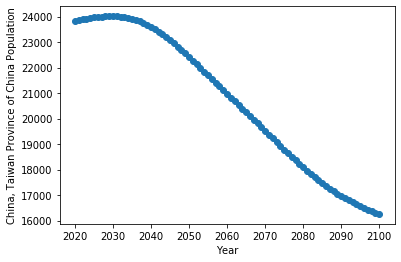

(array([[243.00505364]]), array([[-115.25399959]]))


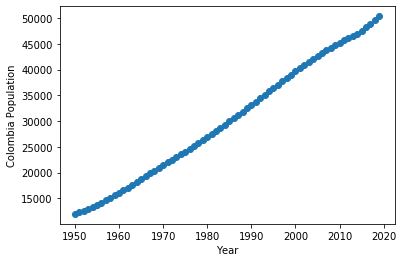

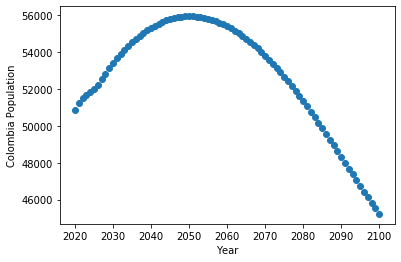

(array([[576.07657762]]), array([[-84.02969137]]))


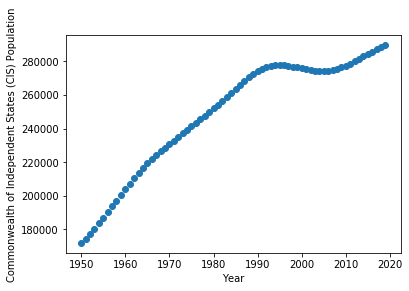

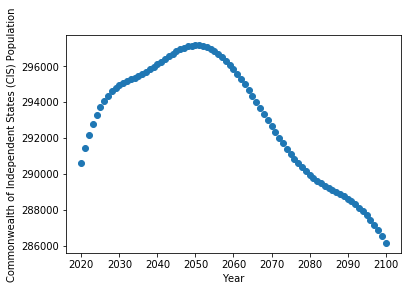

(array([[1596.90985499]]), array([[-105.78874813]]))


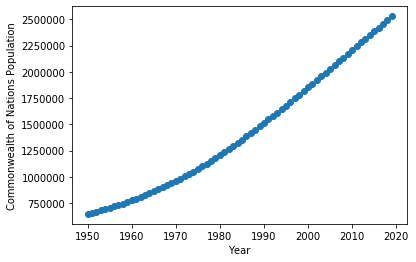

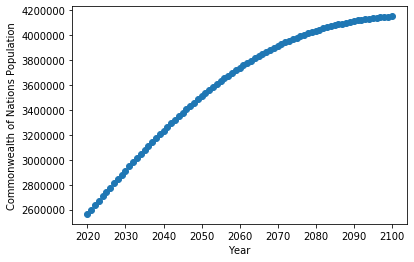

(array([[28268.50842397]]), array([[19981.98933665]]))


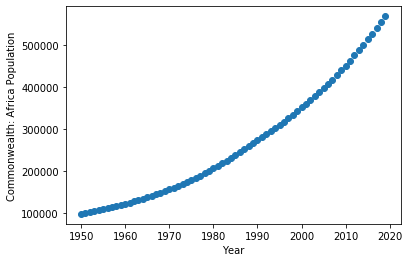

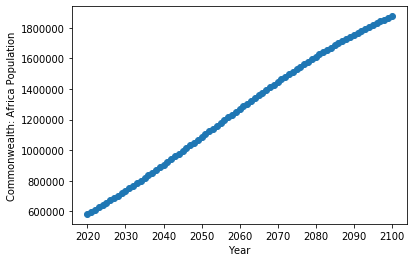

(array([[6616.42619512]]), array([[16875.83696746]]))


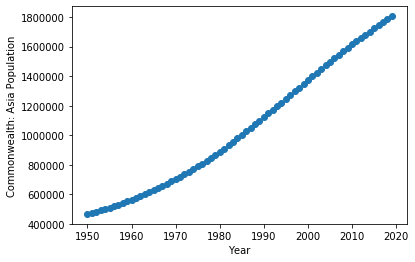

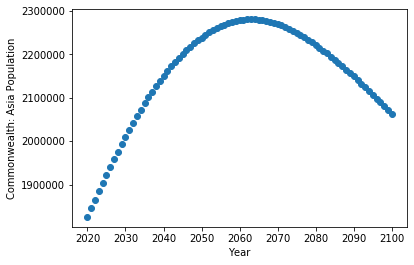

(array([[20650.22434301]]), array([[2385.17824027]]))


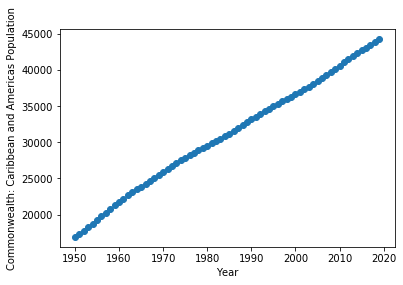

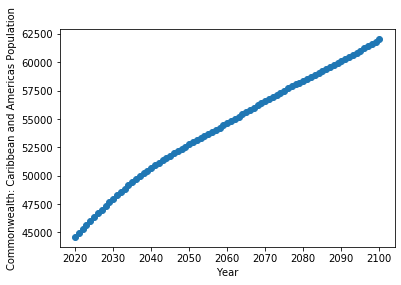

(array([[381.37807627]]), array([[204.73539074]]))


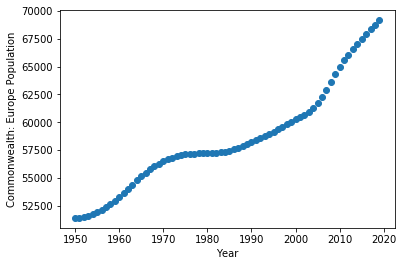

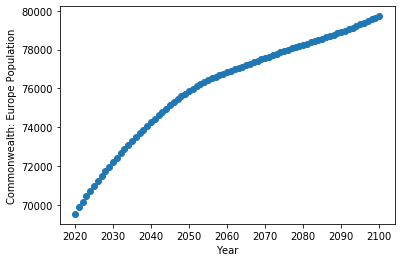

(array([[221.24596865]]), array([[113.03403713]]))


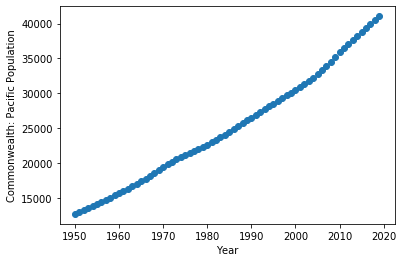

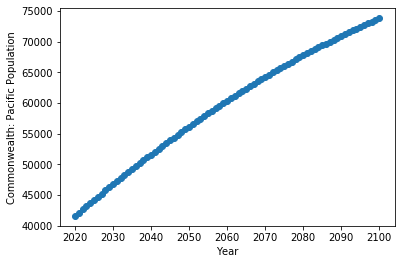

(array([[399.23384092]]), array([[403.20470106]]))


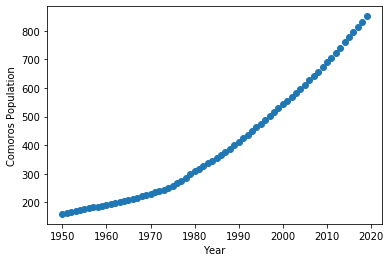

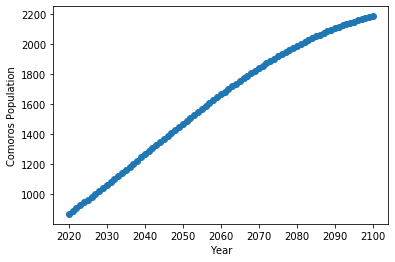

(array([[9.97979132]]), array([[17.27674146]]))


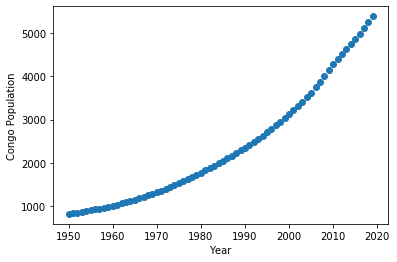

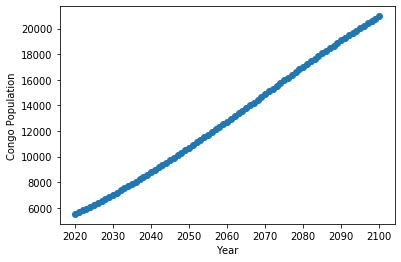

(array([[63.55535021]]), array([[199.7474635]]))


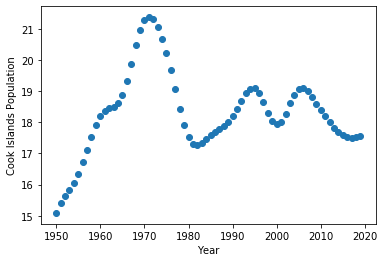

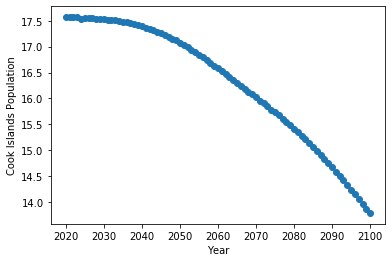

(array([[0.00665368]]), array([[-0.04803575]]))


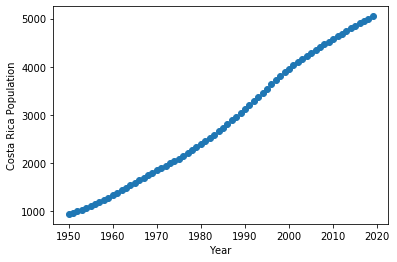

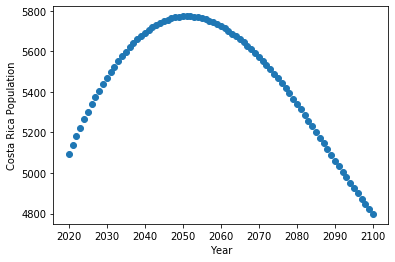

(array([[64.01225468]]), array([[-6.36593449]]))


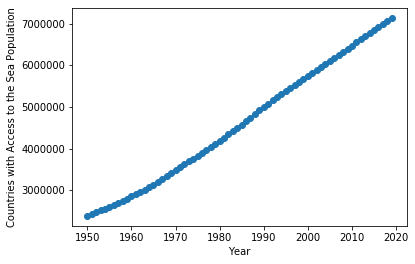

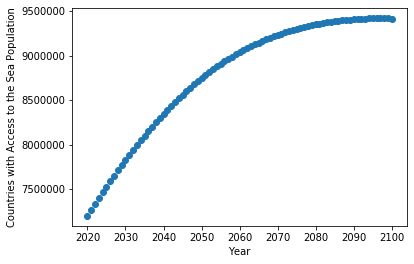

(array([[71756.10208194]]), array([[26441.53249763]]))


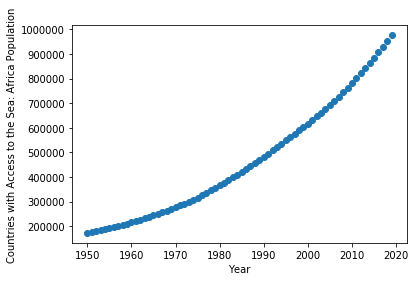

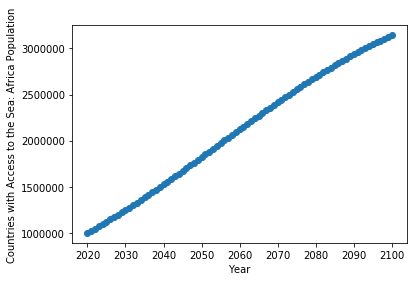

(array([[11344.54810816]]), array([[27963.12116402]]))


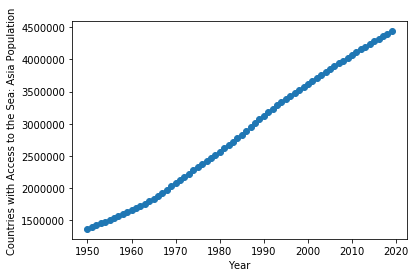

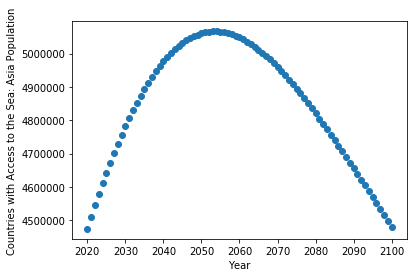

(array([[47632.74032938]]), array([[-1893.39585549]]))


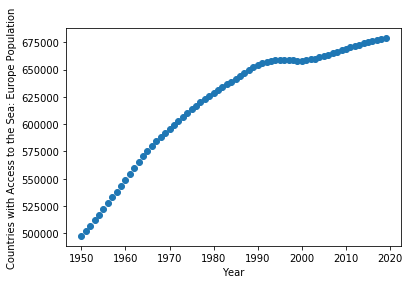

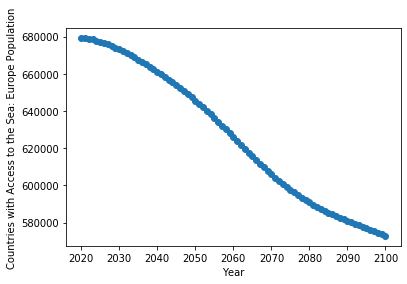

(array([[2466.39002847]]), array([[-1533.44284817]]))


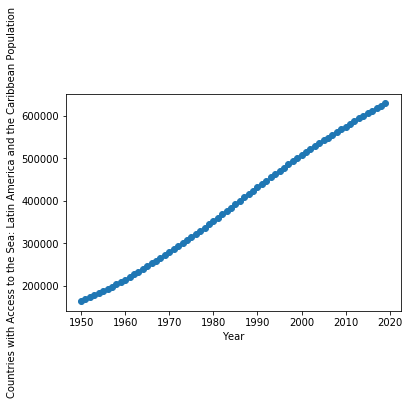

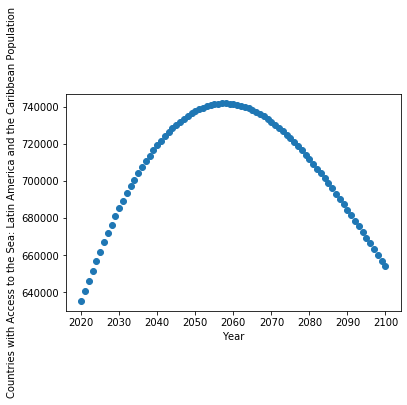

(array([[7124.30011231]]), array([[19.60687392]]))


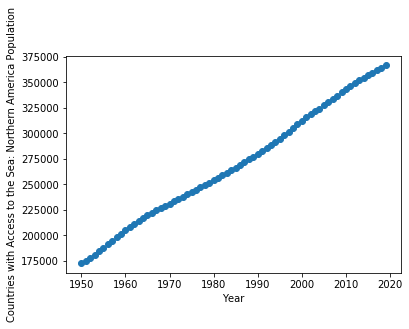

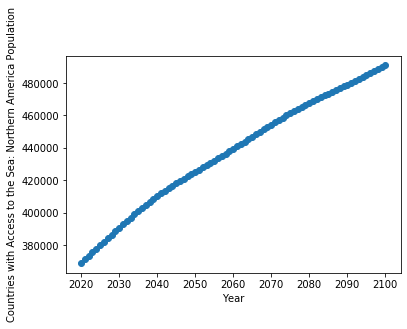

(array([[2775.98630883]]), array([[1482.45567579]]))


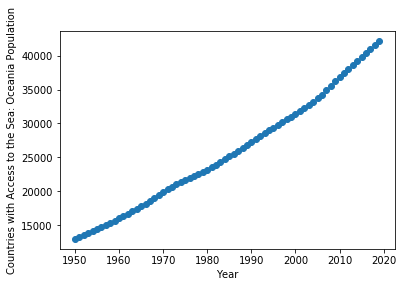

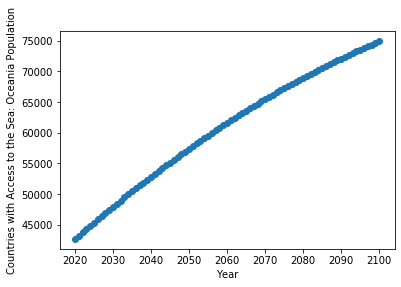

(array([[412.13719479]]), array([[403.18748756]]))


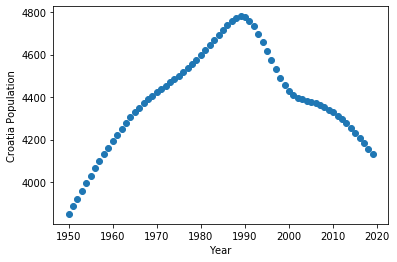

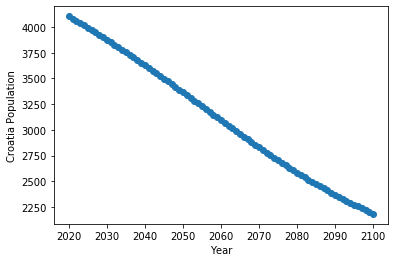

(array([[3.44504563]]), array([[-25.02184573]]))


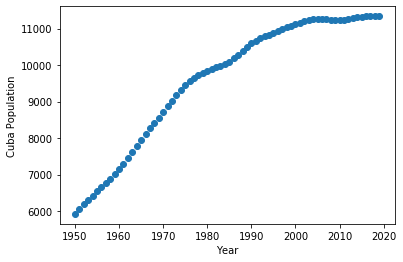

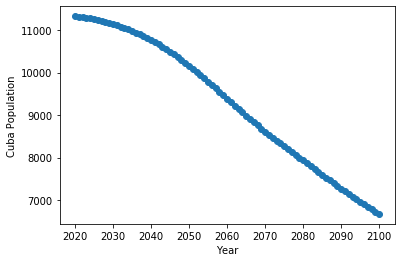

(array([[81.11408438]]), array([[-64.35310266]]))


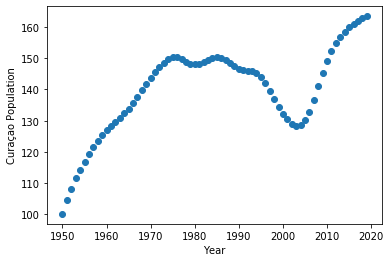

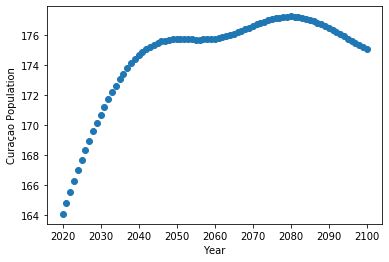

(array([[0.45479407]]), array([[0.10054252]]))


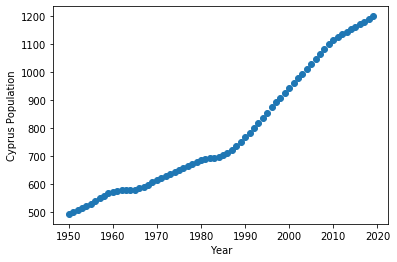

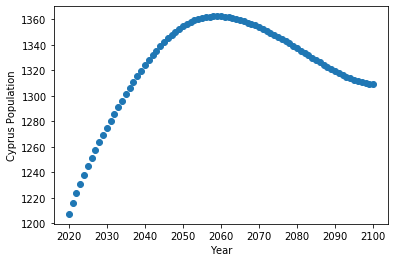

(array([[10.54912793]]), array([[0.78679826]]))


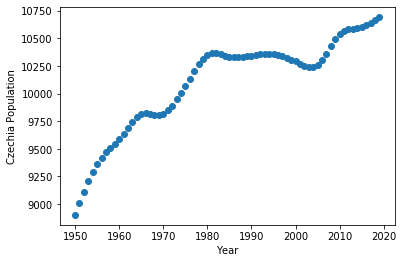

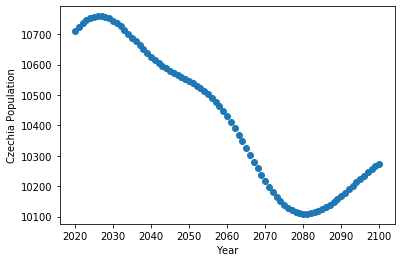

(array([[19.40189803]]), array([[-9.24367188]]))


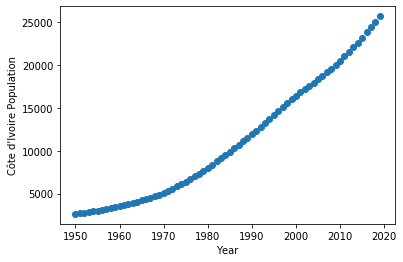

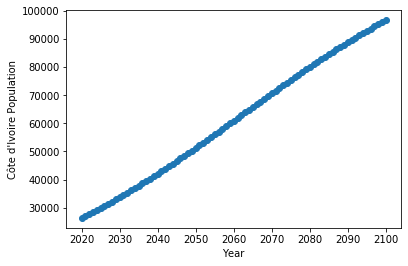

(array([[342.11481867]]), array([[914.40409808]]))


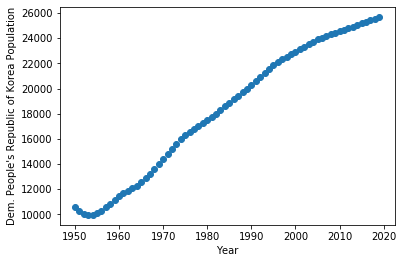

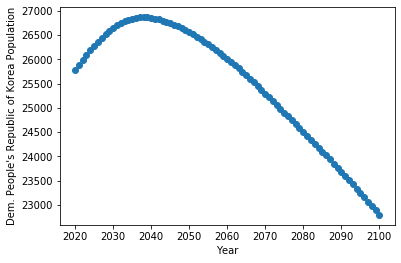

(array([[257.32327772]]), array([[-47.97887333]]))


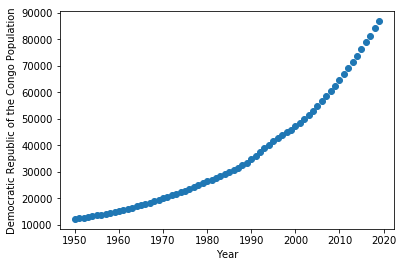

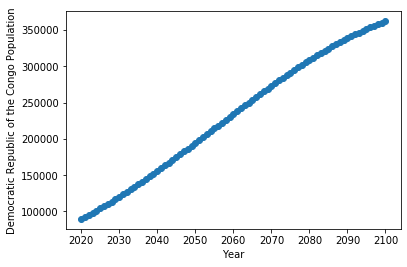

(array([[992.94179986]]), array([[3614.64908184]]))


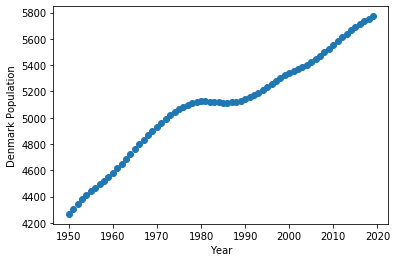

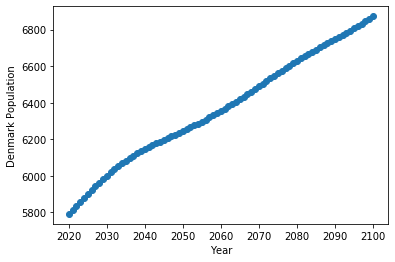

(array([[18.99163165]]), array([[12.69013446]]))


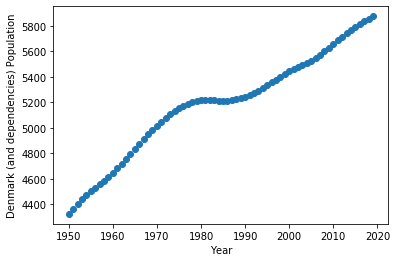

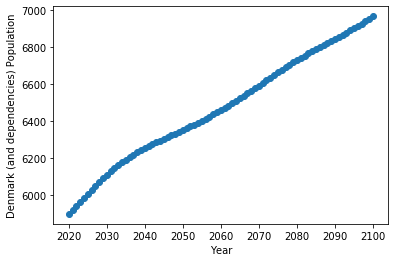

(array([[19.74403527]]), array([[12.5427414]]))


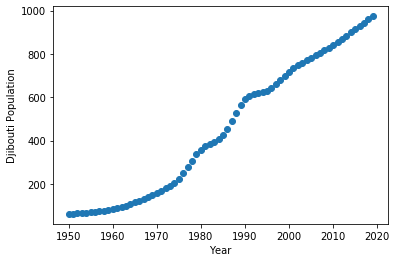

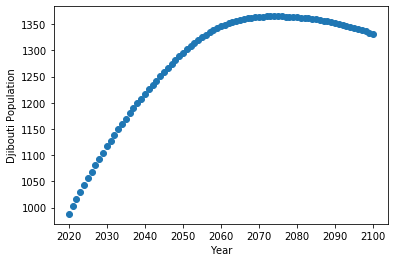

(array([[15.10107572]]), array([[3.97087529]]))


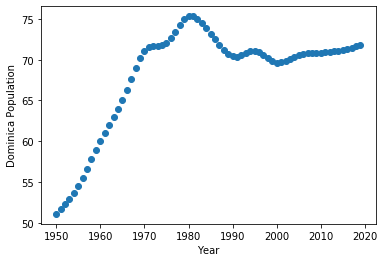

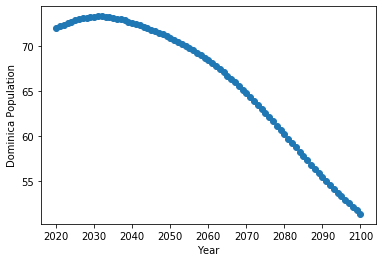

(array([[0.21320882]]), array([[-0.28780696]]))


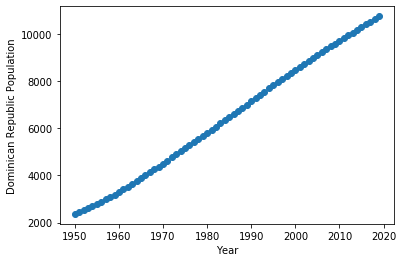

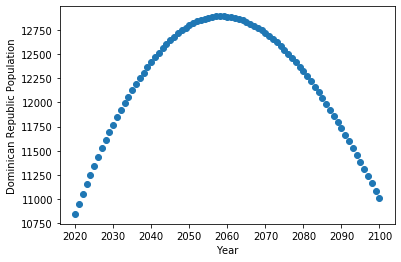

(array([[126.629979]]), array([[-0.30636229]]))


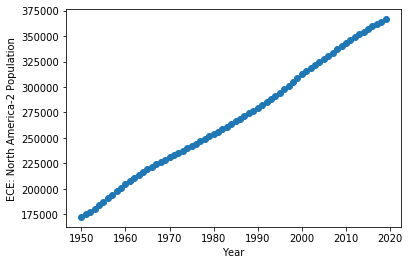

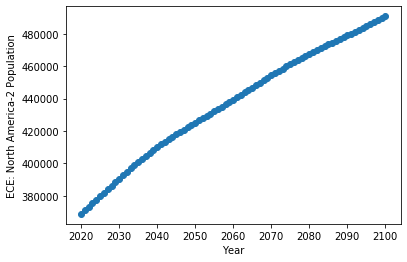

(array([[2775.07214851]]), array([[1483.0477584]]))


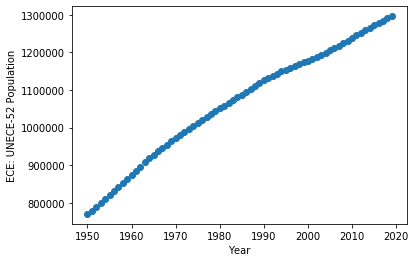

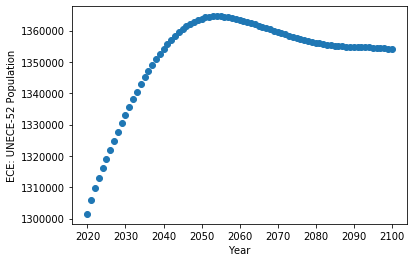

(array([[7395.96593434]]), array([[367.56398254]]))


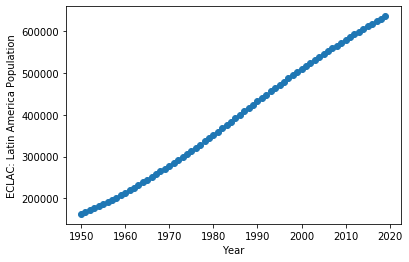

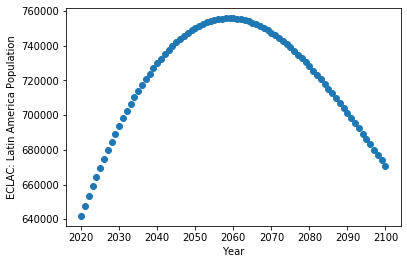

(array([[7241.92273101]]), array([[155.0701143]]))


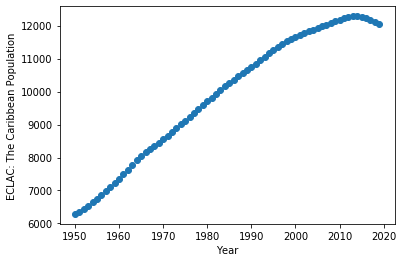

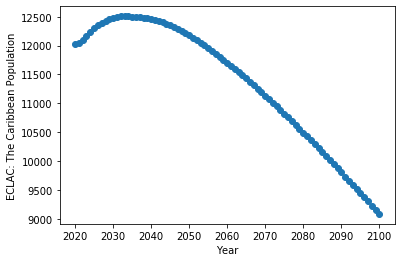

(array([[94.40469289]]), array([[-43.19758261]]))


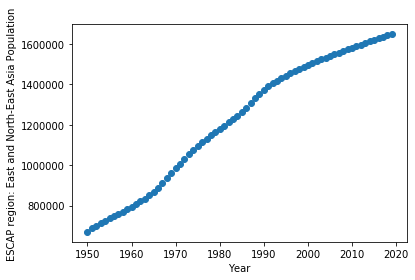

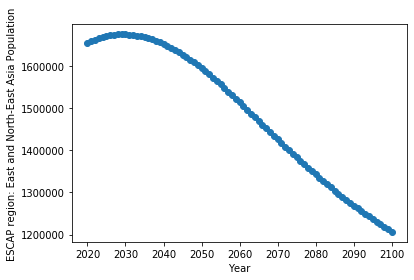

(array([[15520.50371997]]), array([[-6664.86460095]]))


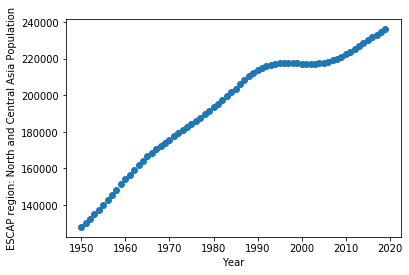

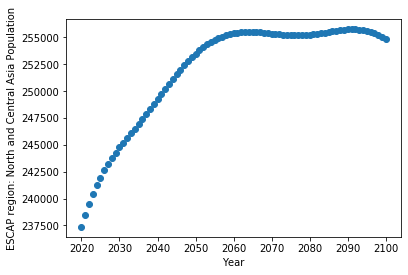

(array([[1466.82087123]]), array([[181.99190601]]))


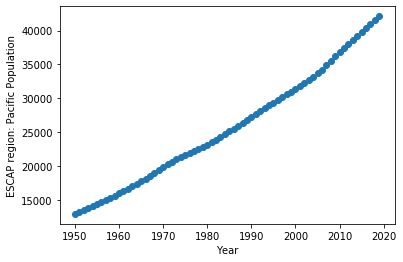

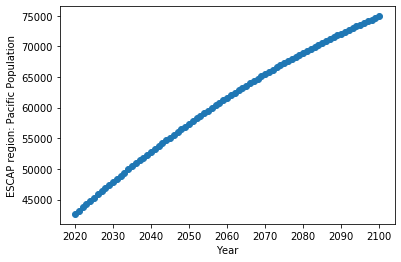

(array([[412.03824306]]), array([[403.25747425]]))


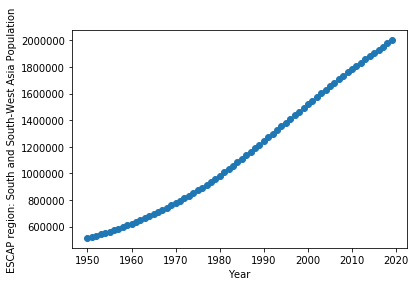

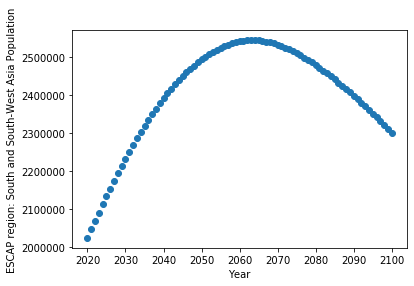

(array([[22880.88862899]]), array([[2832.74453552]]))


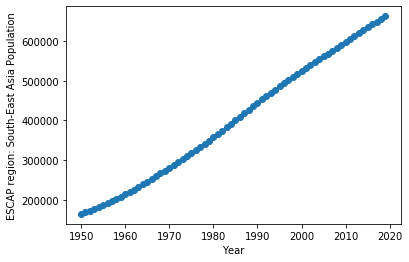

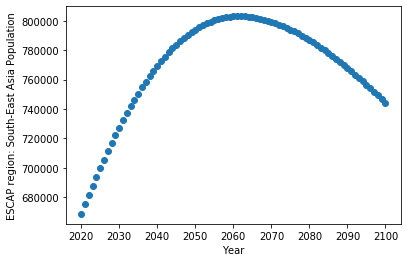

(array([[7596.00021351]]), array([[697.82486667]]))


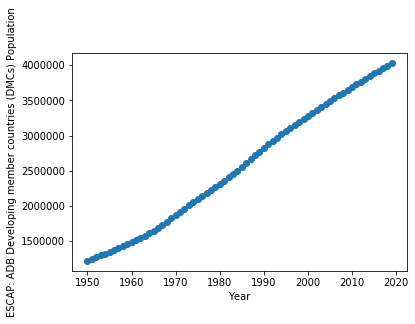

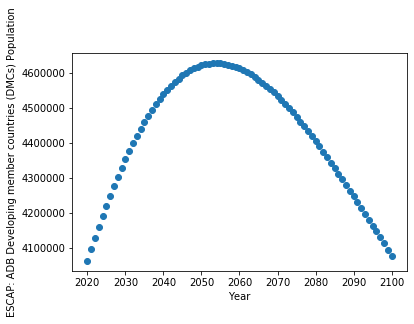

(array([[43477.52169331]]), array([[-1578.82869715]]))


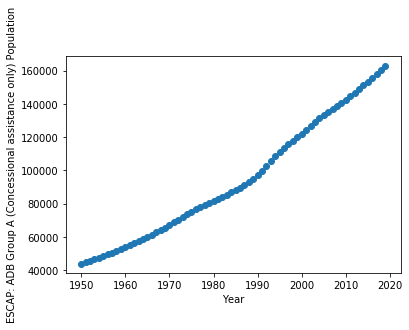

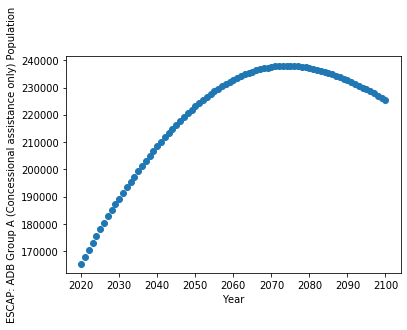

(array([[1761.41009326]]), array([[729.40592428]]))


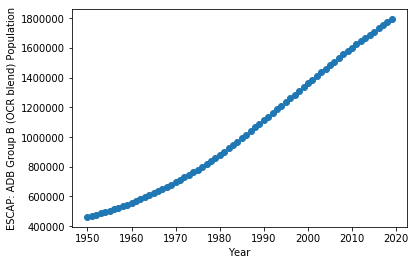

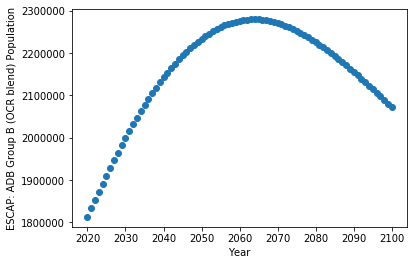

(array([[20526.22010078]]), array([[2672.87889889]]))


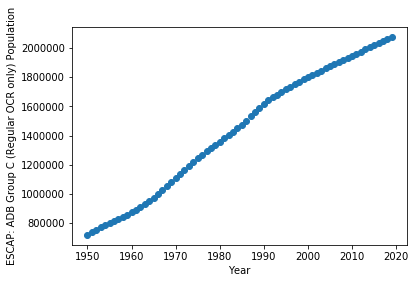

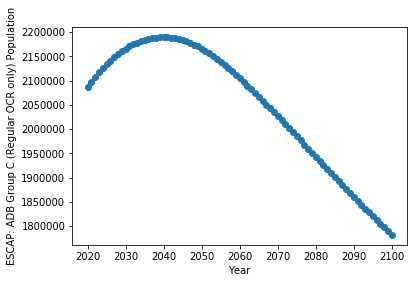

(array([[21189.89149927]]), array([[-4981.11352033]]))


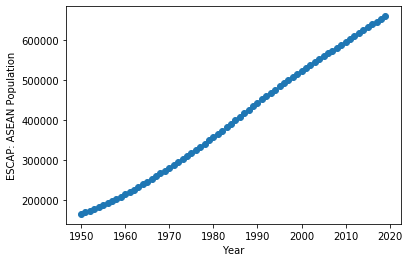

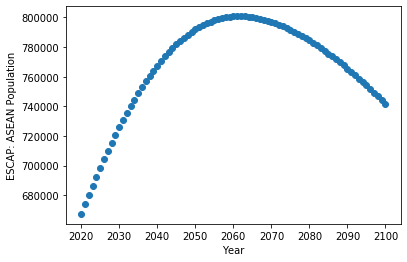

(array([[7583.85539157]]), array([[683.92842665]]))


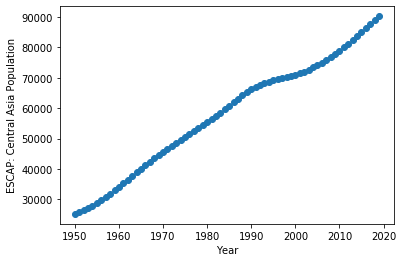

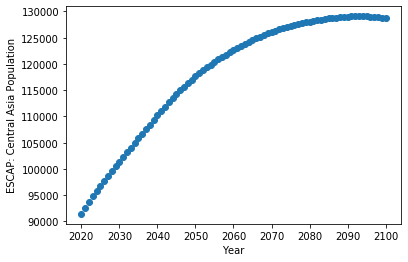

(array([[911.63527956]]), array([[457.09932211]]))


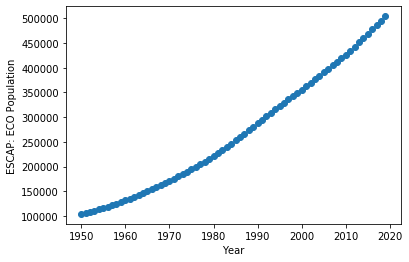

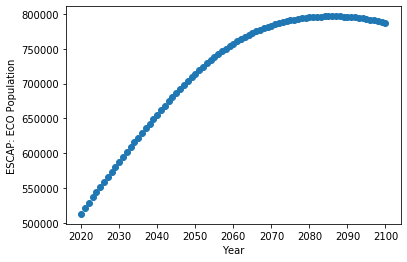

(array([[5898.62706146]]), array([[3461.14311344]]))


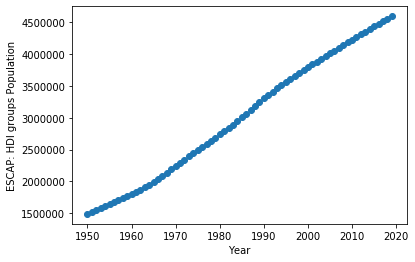

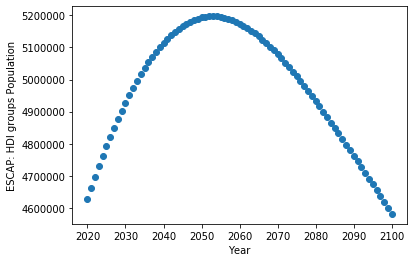

(array([[47876.25167676]]), array([[-2549.0458185]]))


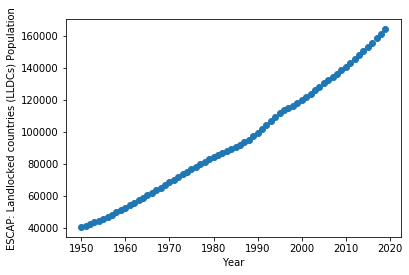

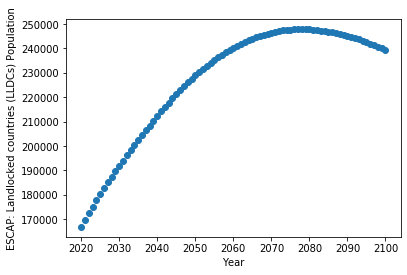

(array([[1758.7860702]]), array([[891.12120635]]))


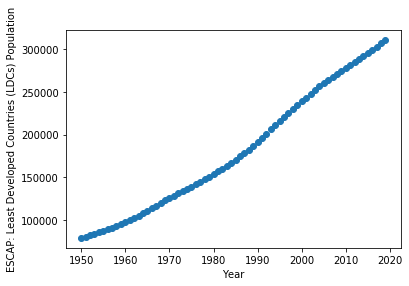

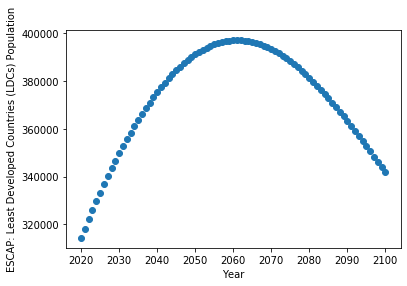

(array([[3545.97463986]]), array([[240.98727855]]))


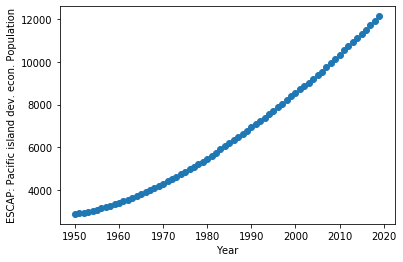

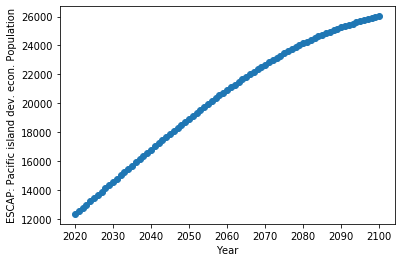

(array([[136.75852594]]), array([[177.39843805]]))


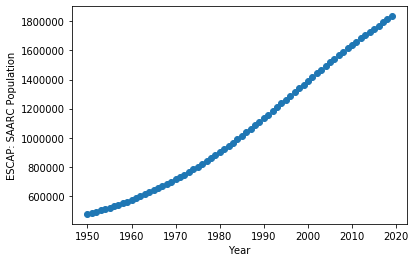

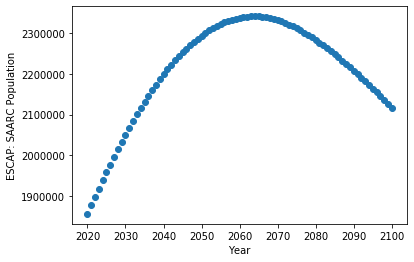

(array([[20923.25427142]]), array([[2686.33569259]]))


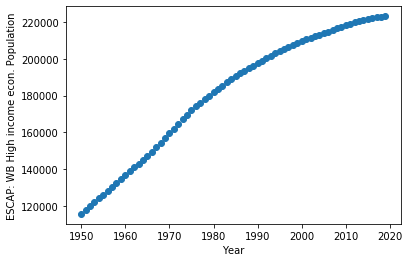

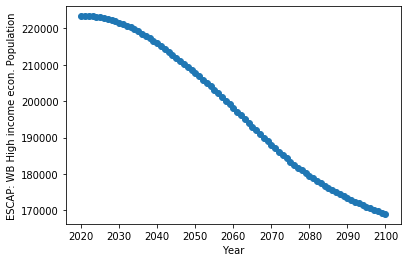

(array([[1628.04764439]]), array([[-793.38542552]]))


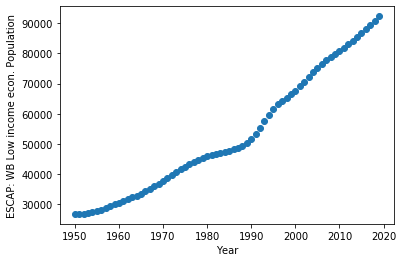

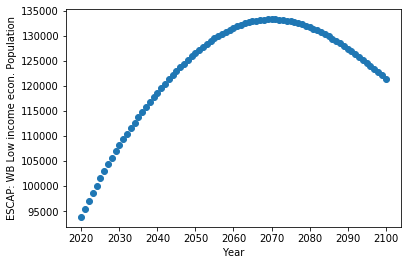

(array([[980.75762411]]), array([[329.99042389]]))


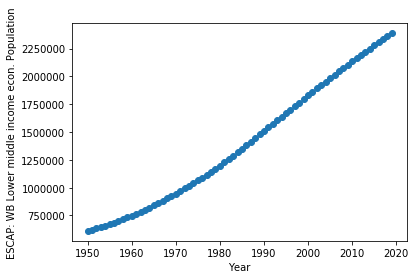

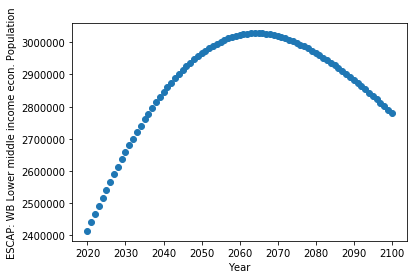

(array([[27290.12185184]]), array([[3827.68907735]]))


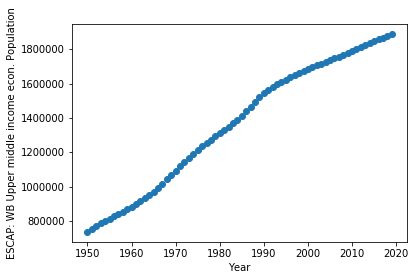

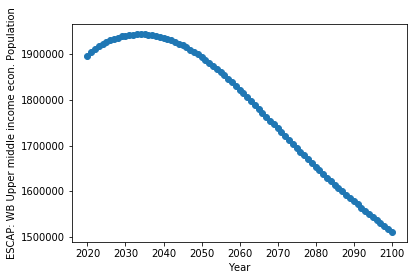

(array([[17977.3817349]]), array([[-5913.29358622]]))


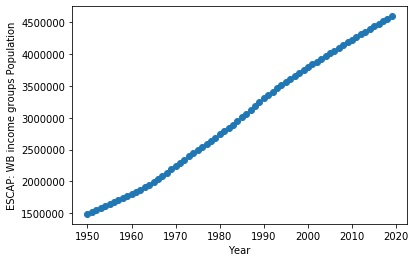

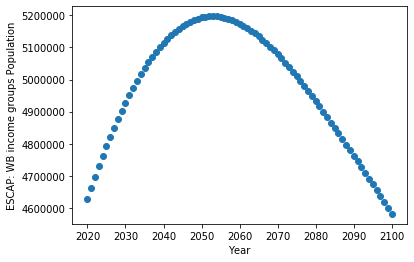

(array([[47876.30885524]]), array([[-2548.9995105]]))


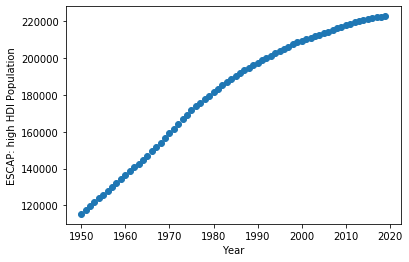

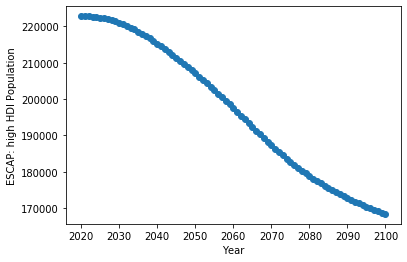

(array([[1620.86230006]]), array([[-793.77286906]]))


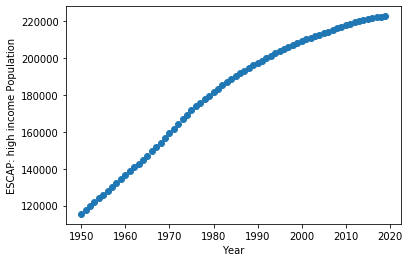

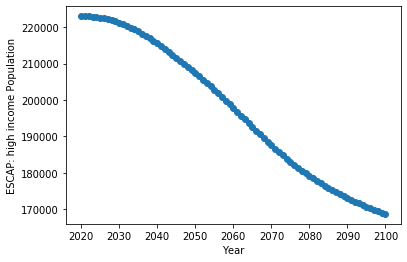

(array([[1623.32234034]]), array([[-792.89253878]]))


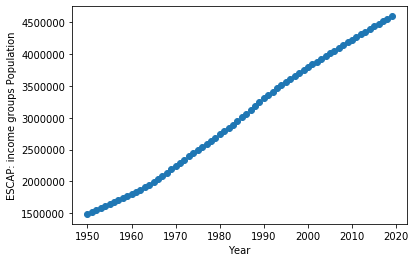

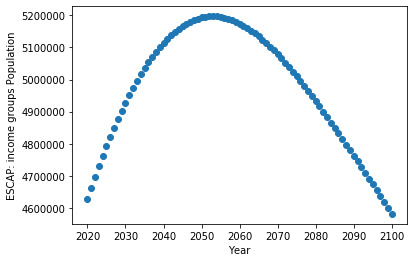

(array([[47876.25167676]]), array([[-2549.0458185]]))


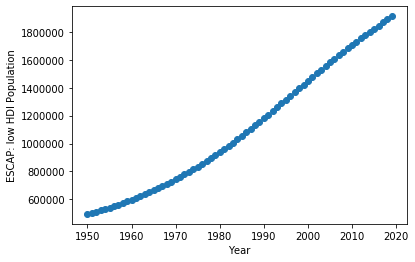

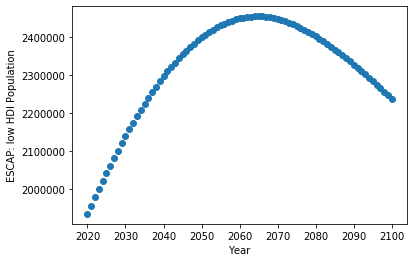

(array([[21777.04199125]]), array([[3218.89111402]]))


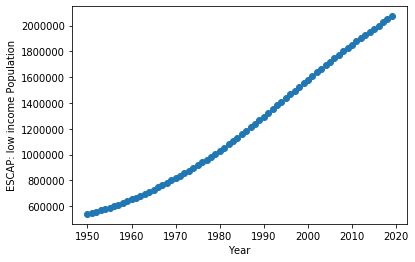

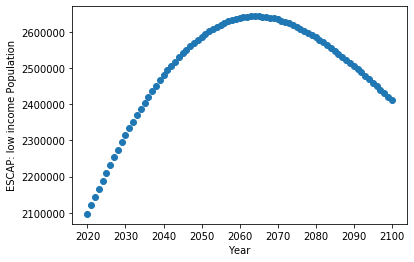

(array([[23605.21326943]]), array([[3275.10161028]]))


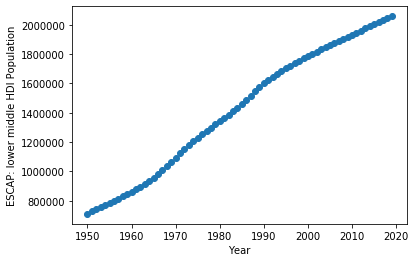

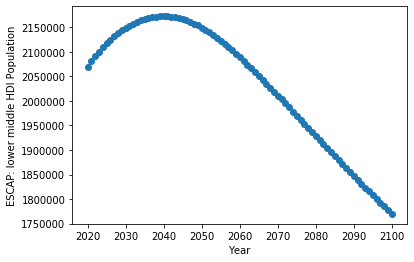

(array([[21120.97658427]]), array([[-4923.36738756]]))


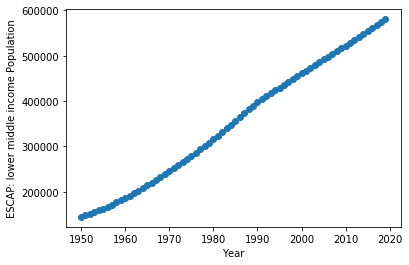

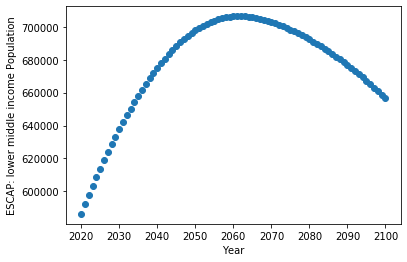

(array([[6686.48335131]]), array([[664.51045052]]))


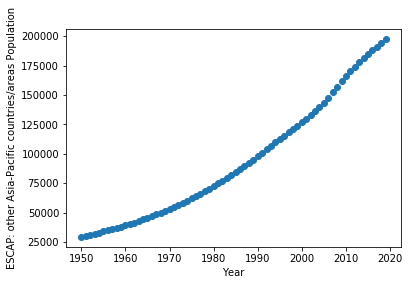

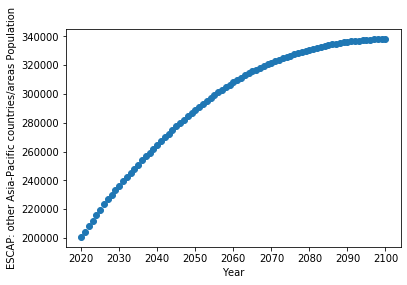

(array([[2472.04838135]]), array([[1674.06444255]]))


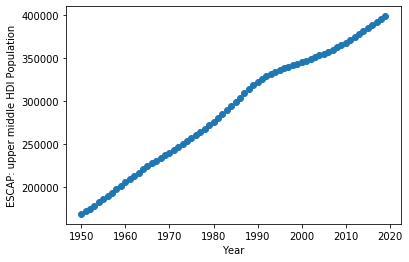

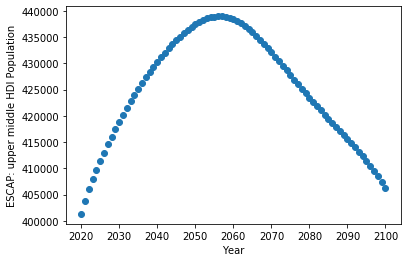

(array([[3357.37080117]]), array([[-50.7966759]]))


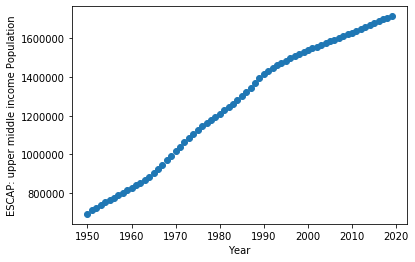

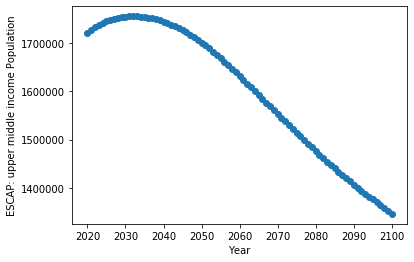

(array([[15961.23271569]]), array([[-5695.76534051]]))


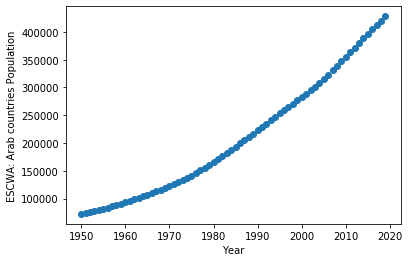

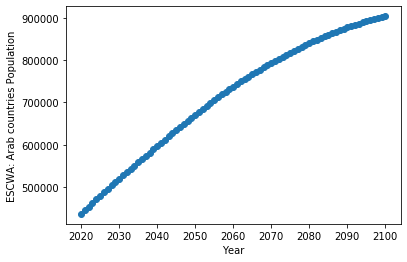

(array([[5200.63538172]]), array([[5947.64706868]]))


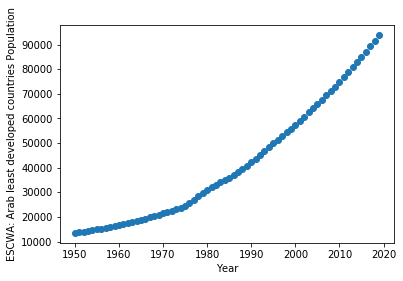

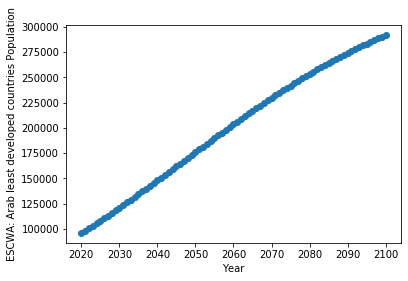

(array([[1158.69564675]]), array([[2543.87115815]]))


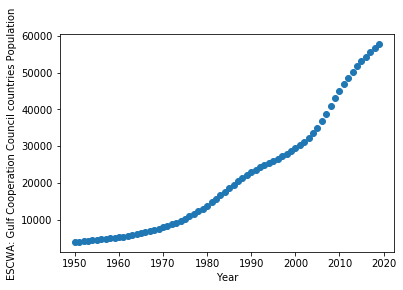

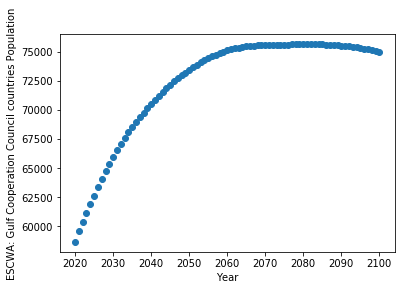

(array([[770.50299956]]), array([[164.94082681]]))


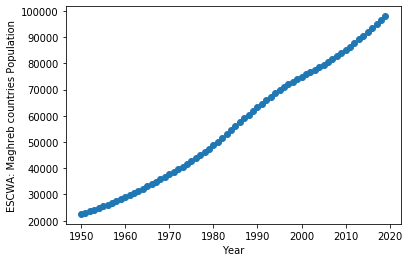

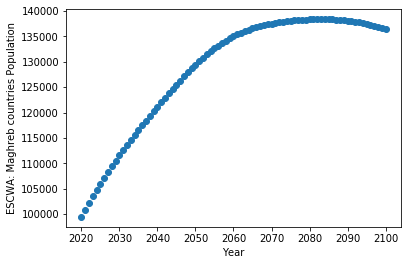

(array([[1134.71236767]]), array([[443.6789956]]))


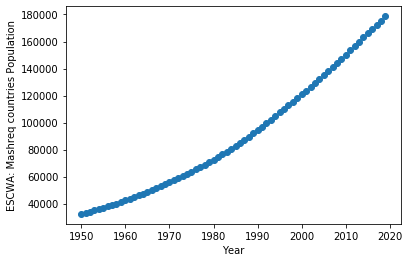

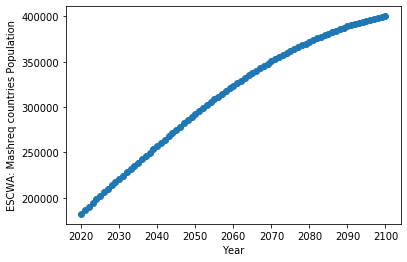

(array([[2136.72436774]]), array([[2795.15608812]]))


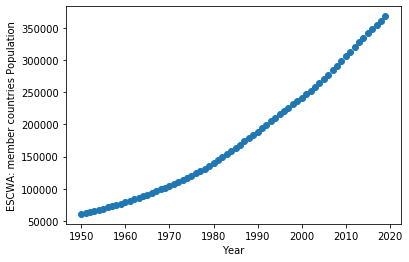

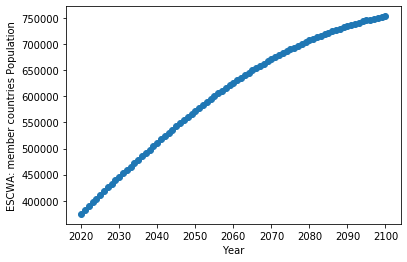

(array([[4484.40466316]]), array([[4811.09906181]]))


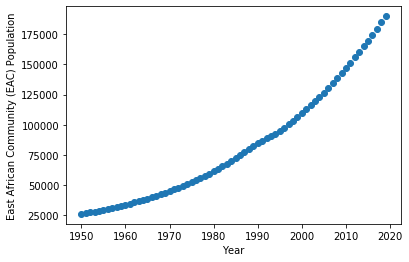

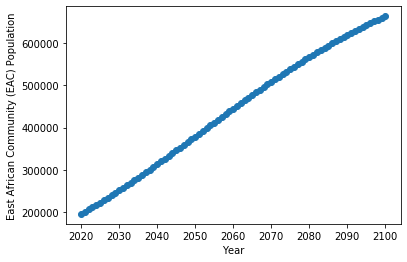

(array([[2264.49416289]]), array([[6111.44388916]]))


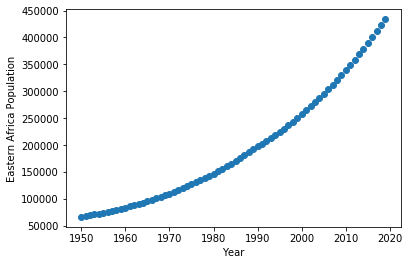

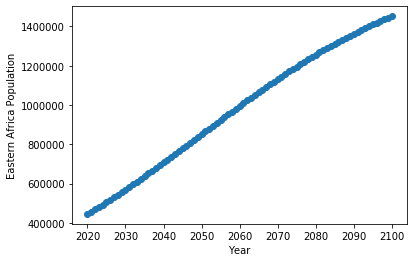

(array([[5105.06965016]]), array([[13159.44423345]]))


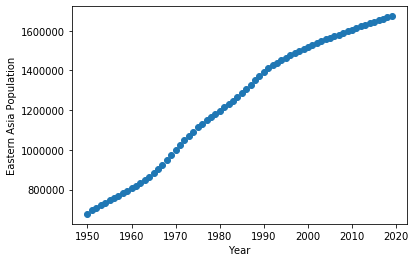

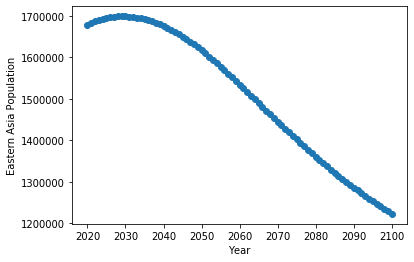

(array([[15763.50877362]]), array([[-6780.11860054]]))


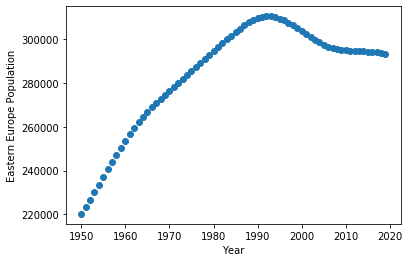

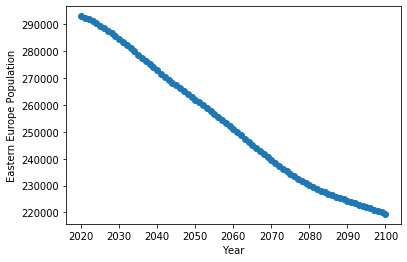

(array([[962.16225588]]), array([[-994.94969124]]))


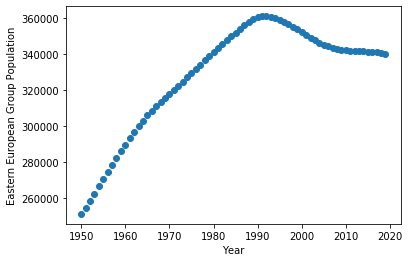

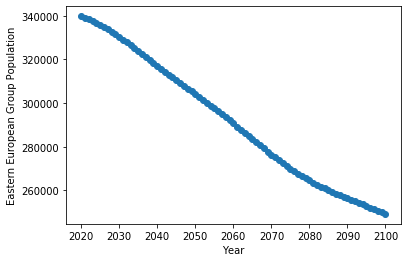

(array([[1196.97089933]]), array([[-1224.60587554]]))


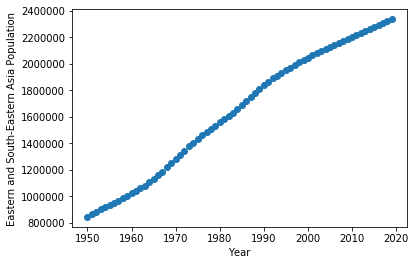

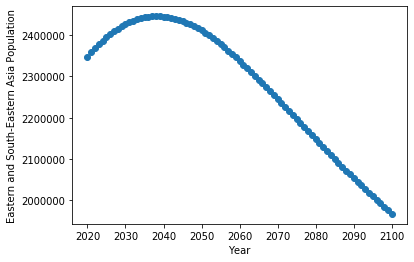

(array([[23359.50898712]]), array([[-6082.29373388]]))


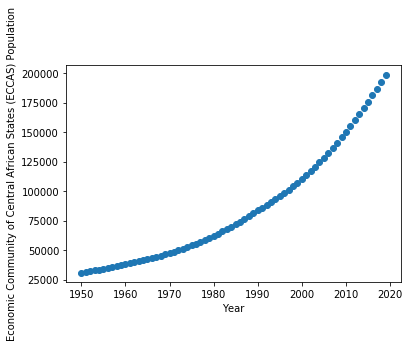

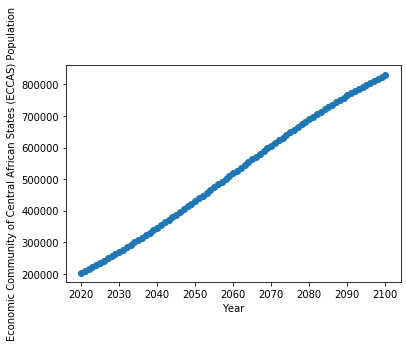

(array([[2255.43379101]]), array([[8207.18898595]]))


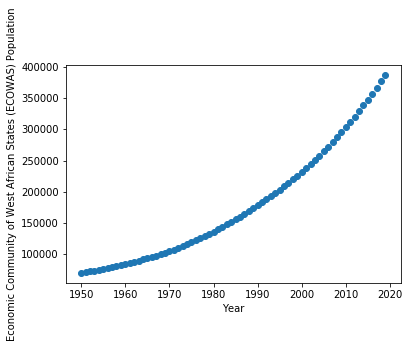

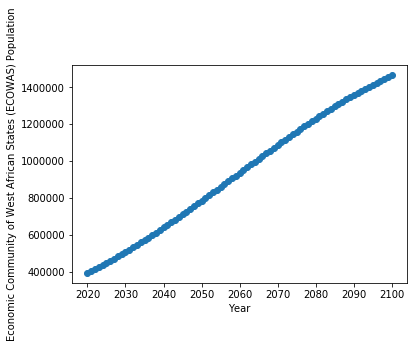

(array([[4384.2328692]]), array([[14052.80760653]]))


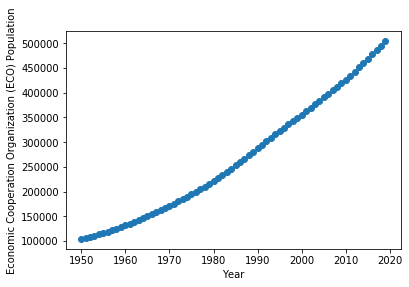

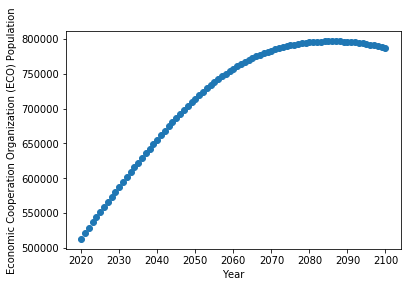

(array([[5898.62706146]]), array([[3461.14311344]]))


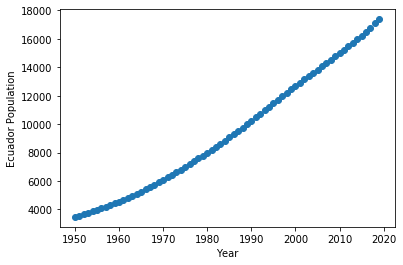

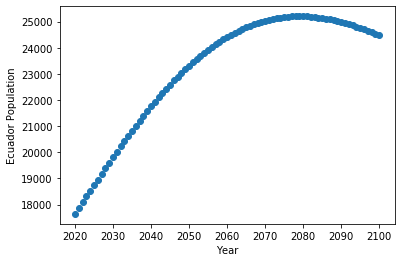

(array([[207.45986041]]), array([[85.85798952]]))


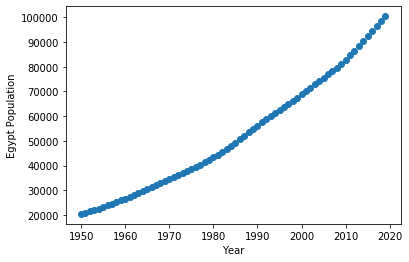

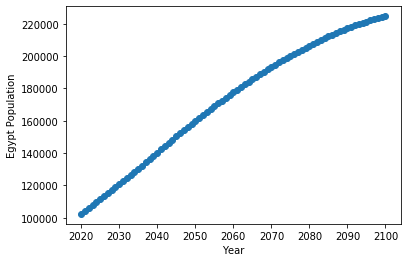

(array([[1137.80996536]]), array([[1594.15454397]]))


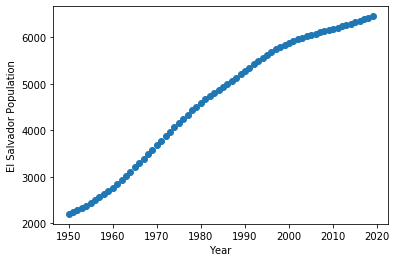

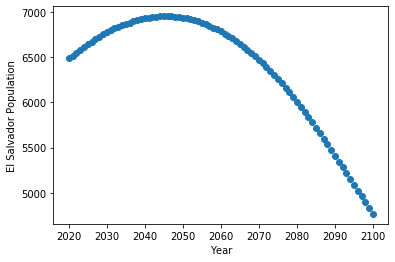

(array([[67.36512832]]), array([[-22.47360867]]))


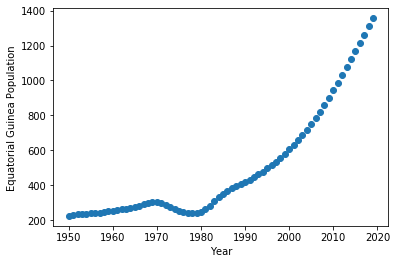

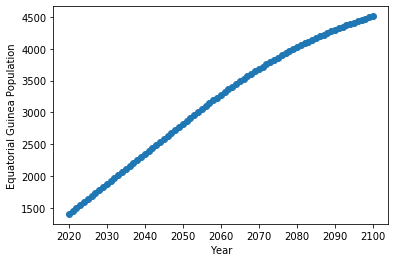

(array([[13.91151215]]), array([[40.32457809]]))


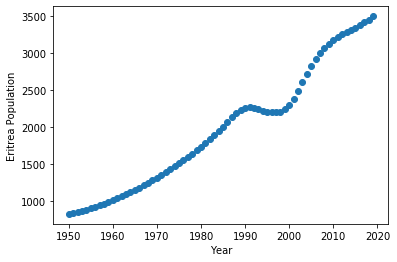

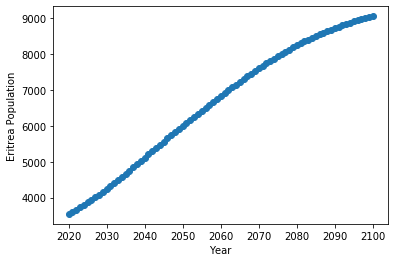

(array([[40.14886561]]), array([[73.94975869]]))


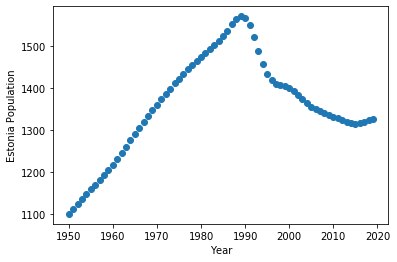

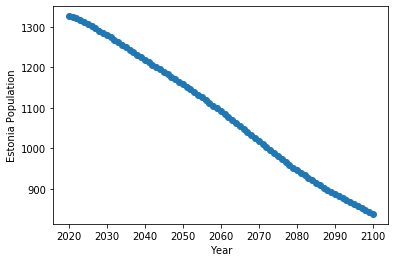

(array([[2.57652022]]), array([[-6.49577222]]))


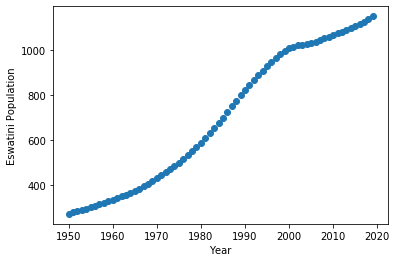

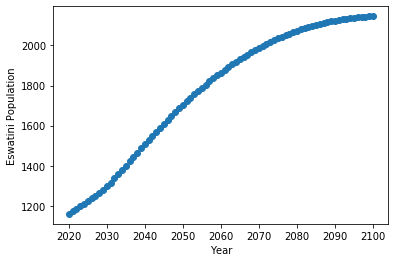

(array([[14.73647424]]), array([[13.38724415]]))


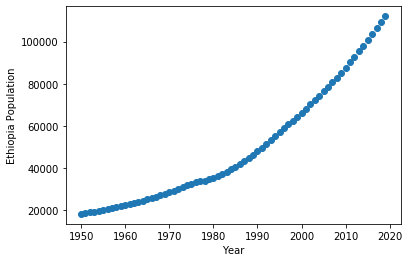

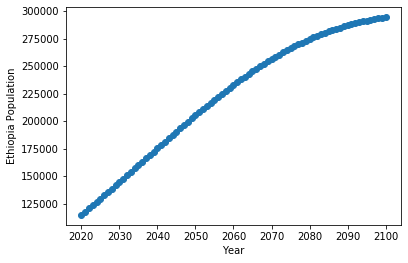

(array([[1305.02152674]]), array([[2358.22689185]]))


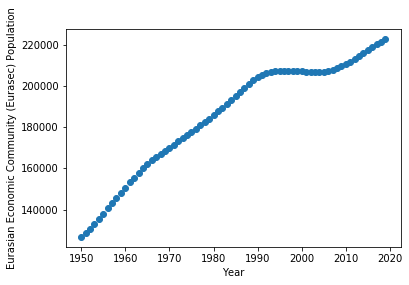

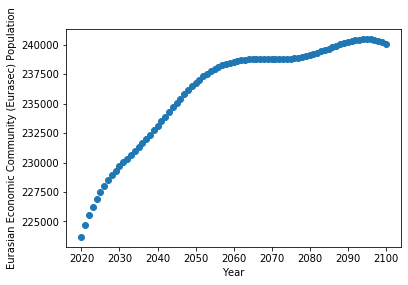

(array([[1296.34803928]]), array([[175.32295607]]))


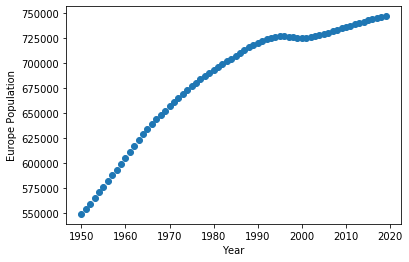

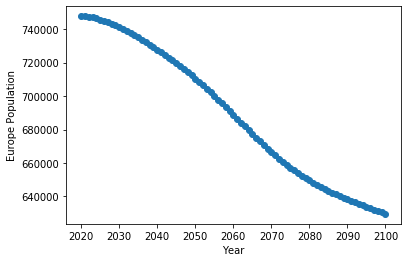

(array([[2691.84460241]]), array([[-1707.96620524]]))


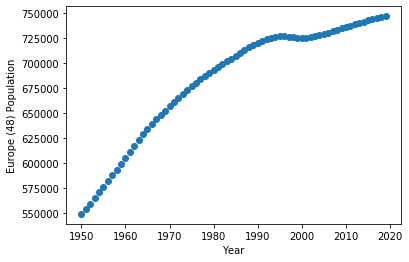

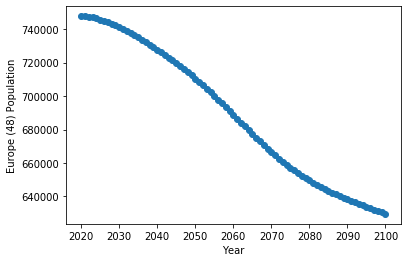

(array([[2691.84460241]]), array([[-1707.96620524]]))


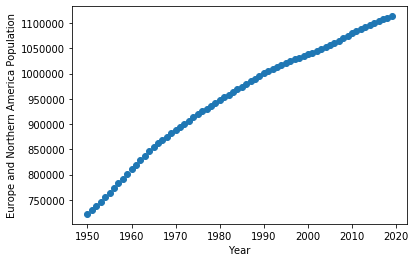

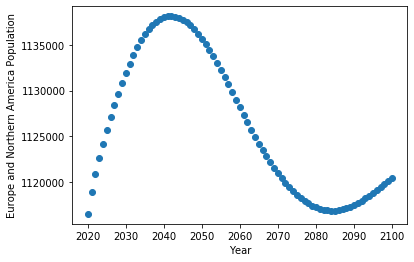

(array([[5467.83091124]]), array([[-225.51052945]]))


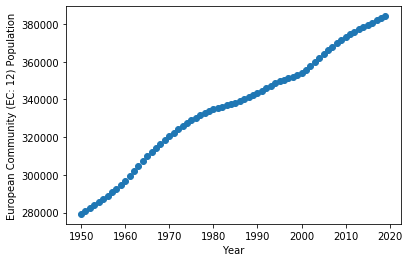

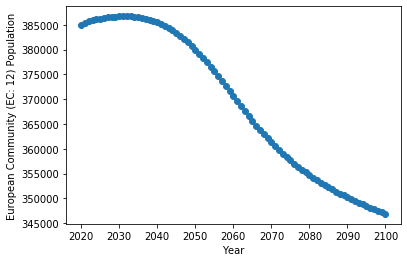

(array([[1453.25711234]]), array([[-611.6154801]]))


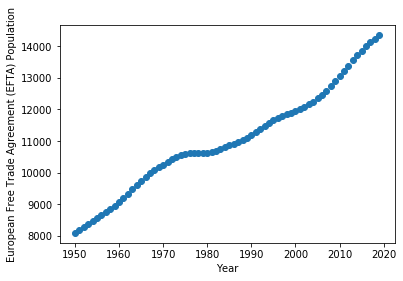

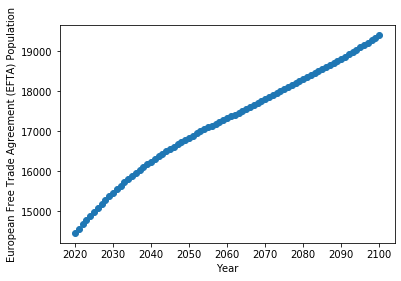

(array([[79.51716048]]), array([[56.47997486]]))


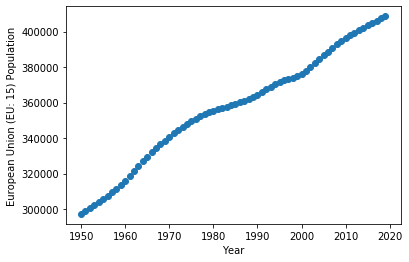

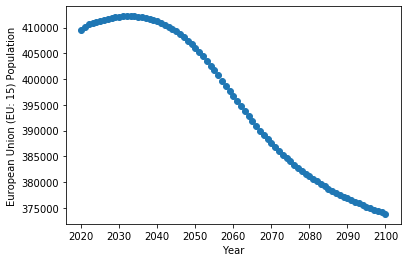

(array([[1537.78688389]]), array([[-589.47894885]]))


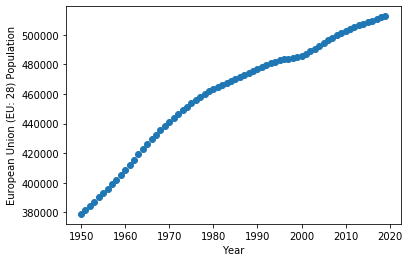

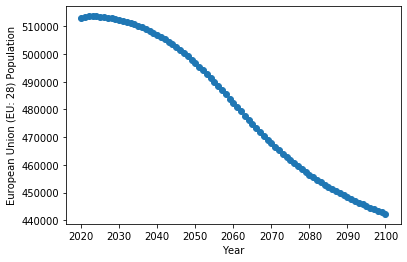

(array([[1847.34472935]]), array([[-1064.69677658]]))


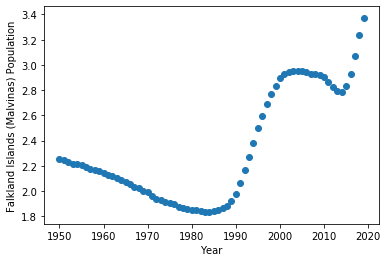

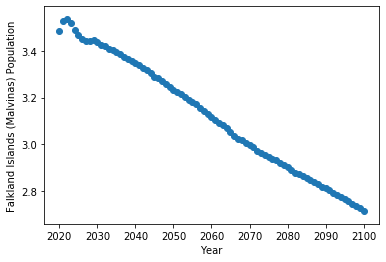

(array([[0.01605375]]), array([[-0.01047017]]))


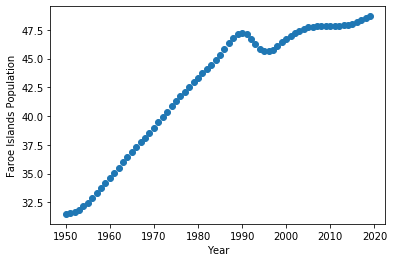

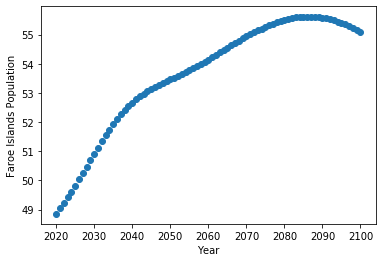

(array([[0.26312723]]), array([[0.07679533]]))


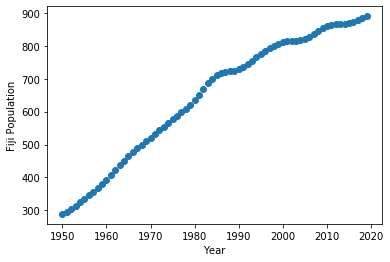

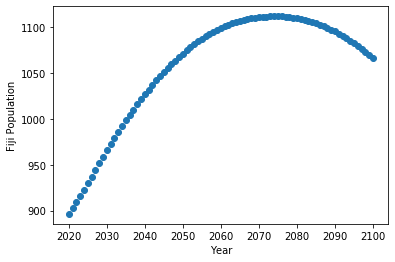

(array([[9.13286208]]), array([[2.13561032]]))


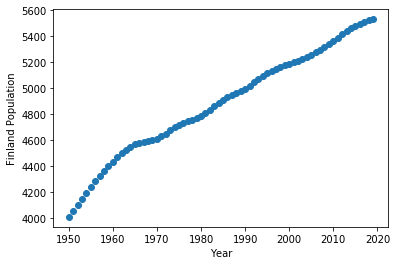

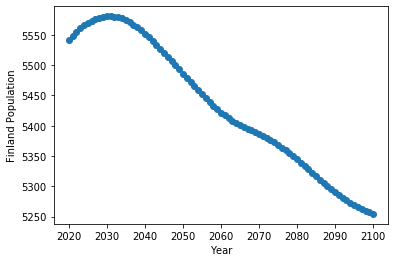

(array([[19.99859645]]), array([[-4.53967965]]))


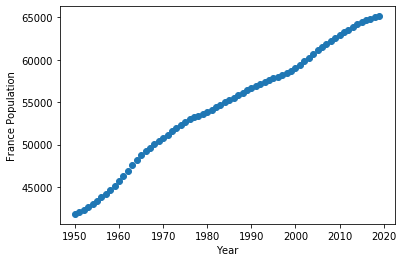

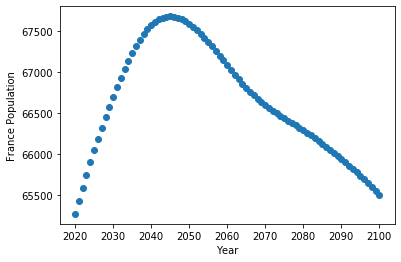

(array([[332.6214604]]), array([[-12.91441154]]))


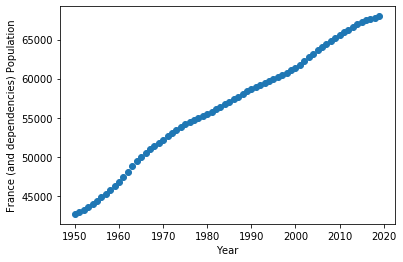

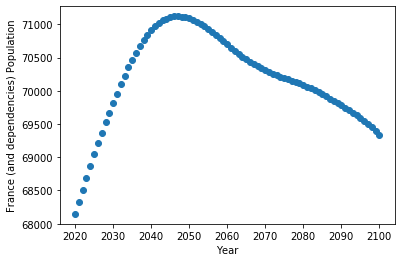

(array([[362.85844792]]), array([[-1.04287674]]))


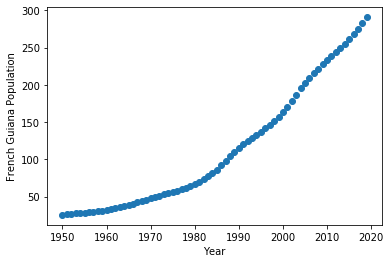

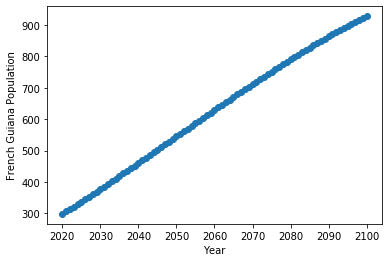

(array([[3.89864574]]), array([[8.05578794]]))


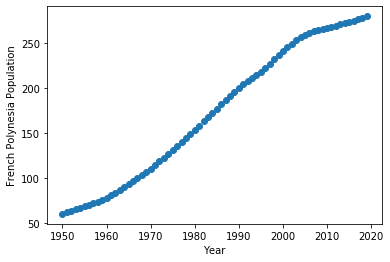

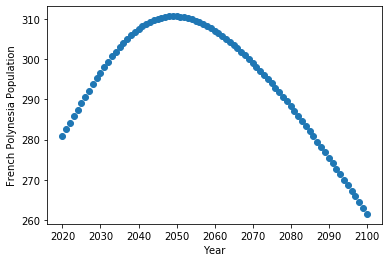

(array([[3.663366]]), array([[-0.3500456]]))


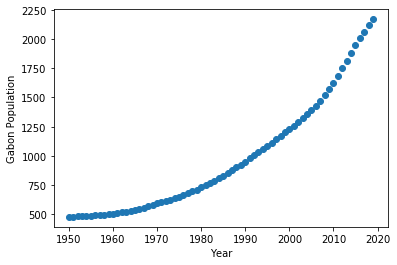

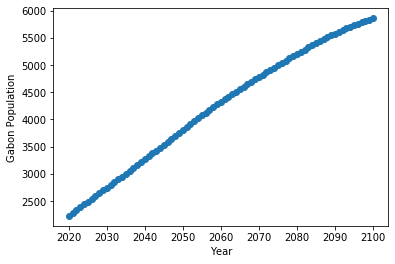

(array([[22.88033974]]), array([[46.94304155]]))


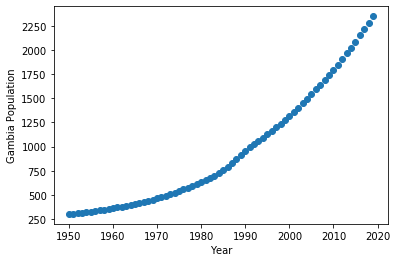

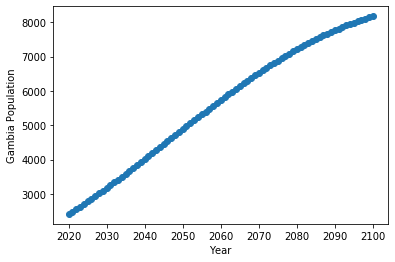

(array([[28.64394244]]), array([[76.11084467]]))


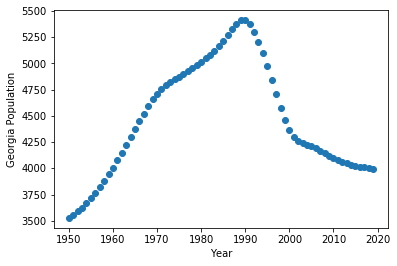

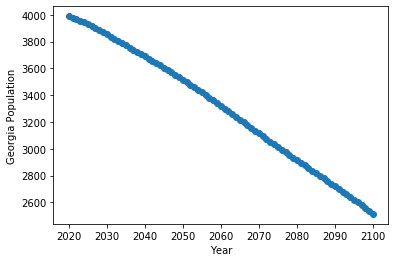

(array([[3.28985328]]), array([[-18.8959283]]))


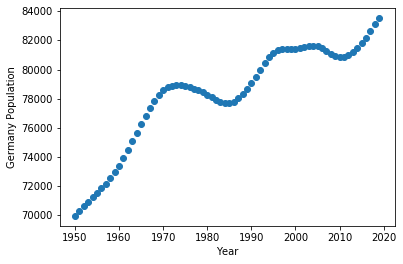

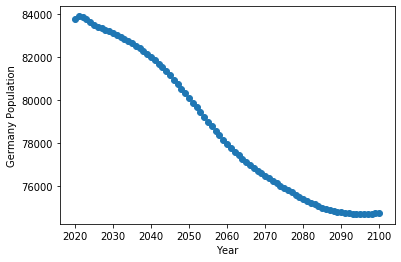

(array([[158.7333993]]), array([[-138.16164968]]))


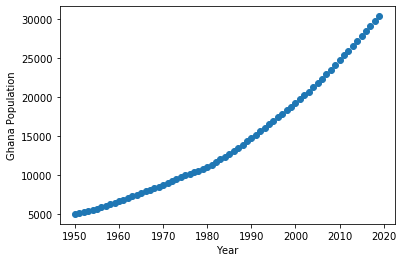

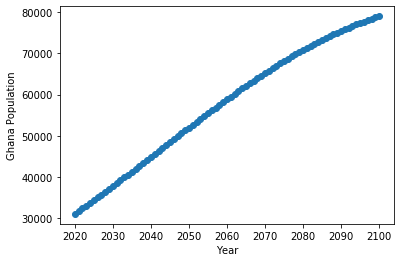

(array([[359.67237568]]), array([[624.29520336]]))


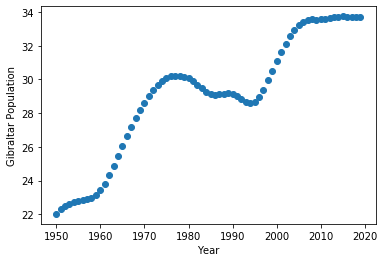

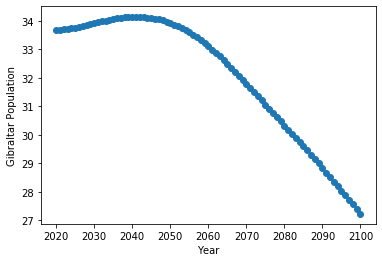

(array([[0.16591248]]), array([[-0.08606626]]))


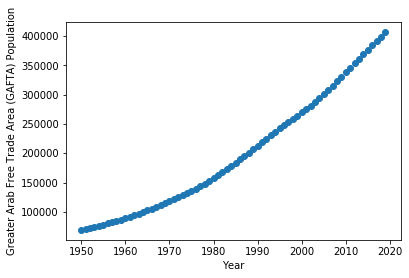

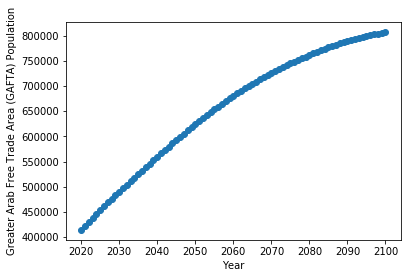

(array([[4938.61024124]]), array([[4984.00119539]]))


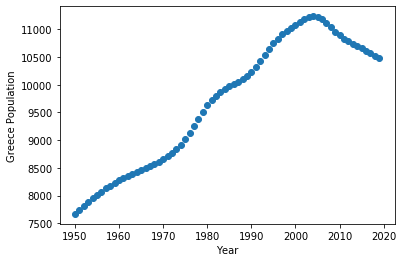

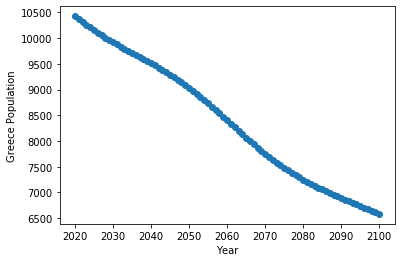

(array([[53.90281066]]), array([[-51.3090432]]))


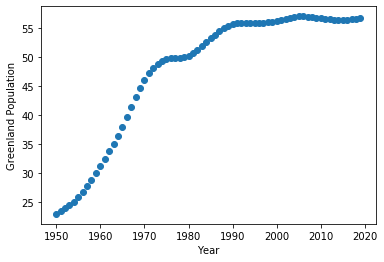

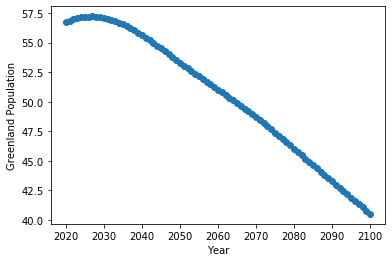

(array([[0.48927639]]), array([[-0.22418839]]))


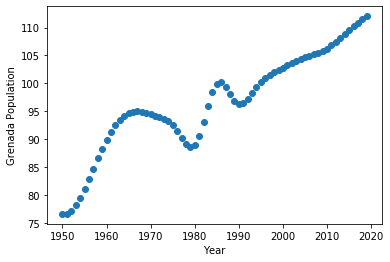

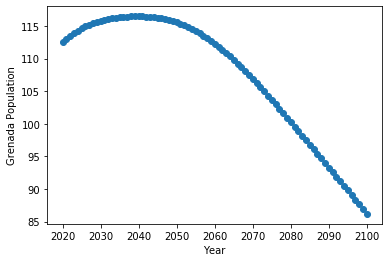

(array([[0.4070247]]), array([[-0.36985255]]))


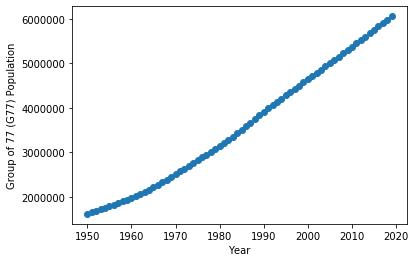

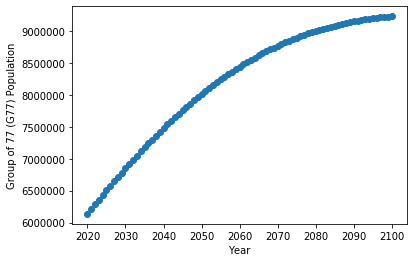

(array([[67172.30507996]]), array([[38357.31086242]]))


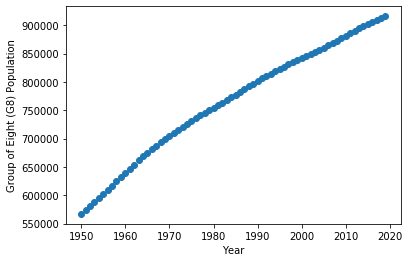

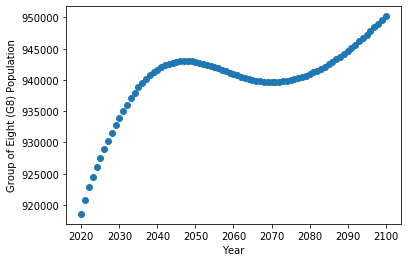

(array([[4905.72658226]]), array([[191.99325237]]))


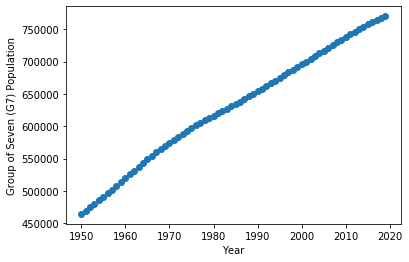

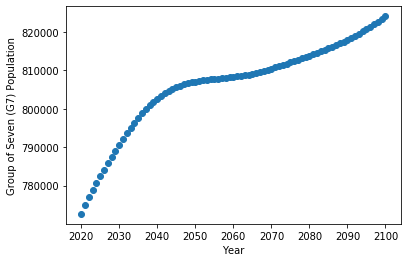

(array([[4350.54099059]]), array([[467.10066847]]))


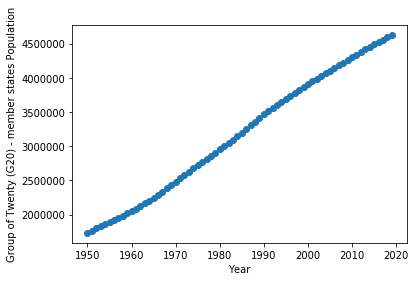

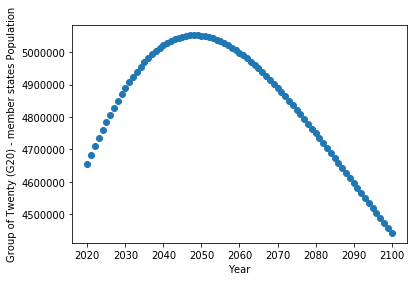

(array([[44430.41597031]]), array([[-4696.87216983]]))


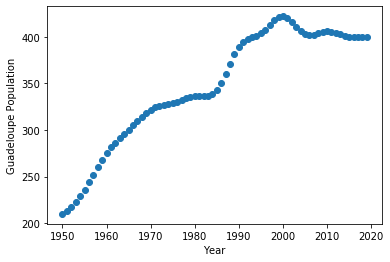

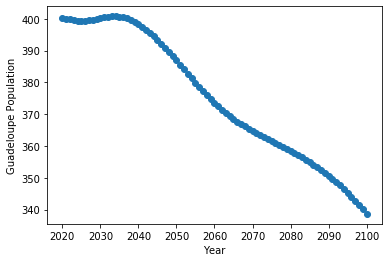

(array([[2.84752289]]), array([[-0.84662125]]))


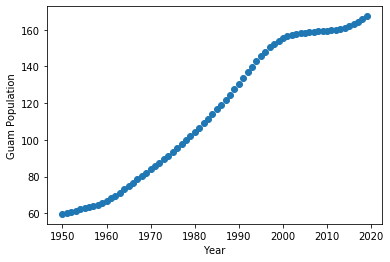

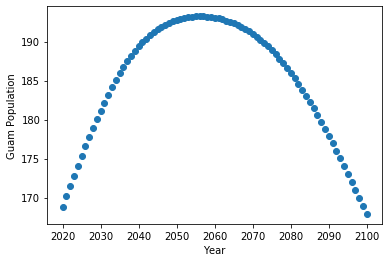

(array([[1.84349947]]), array([[-0.04809322]]))


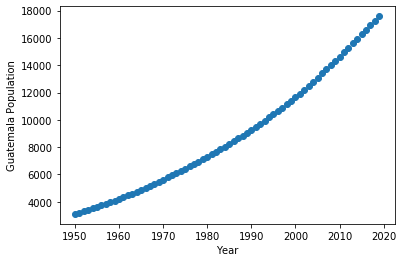

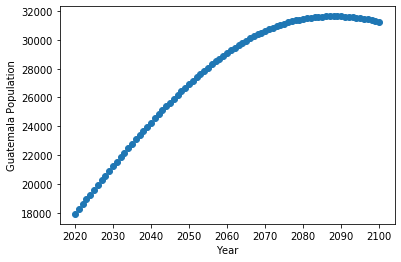

(array([[206.39183197]]), array([[173.20405623]]))


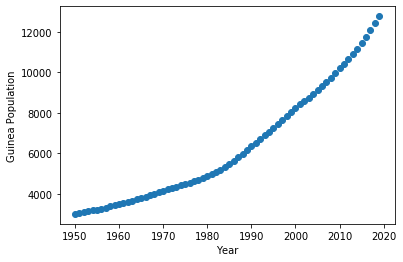

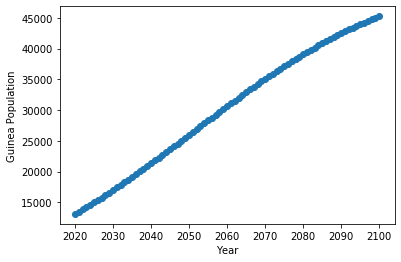

(array([[134.99616655]]), array([[422.37021902]]))


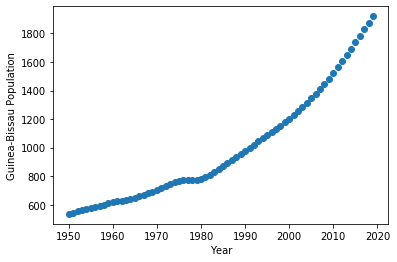

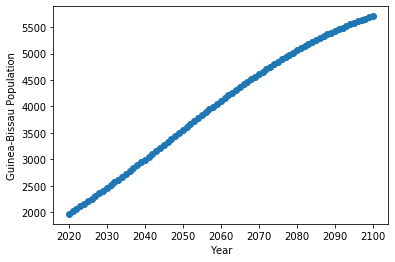

(array([[18.36185765]]), array([[49.18648491]]))


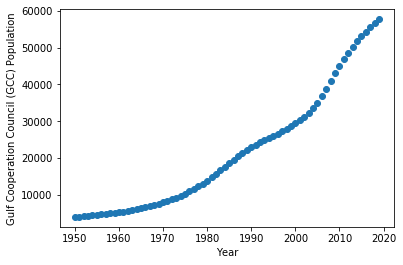

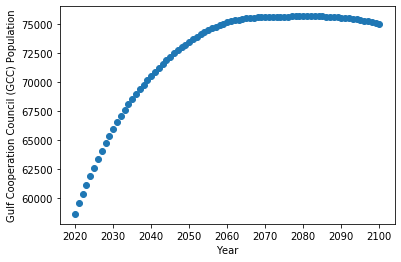

(array([[770.50299956]]), array([[164.94082681]]))


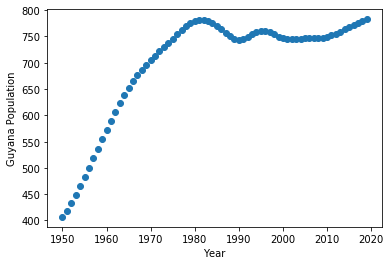

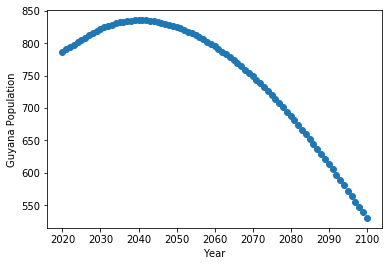

(array([[3.93182245]]), array([[-3.43686958]]))


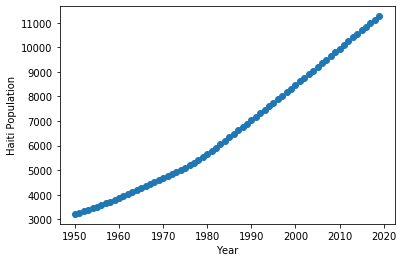

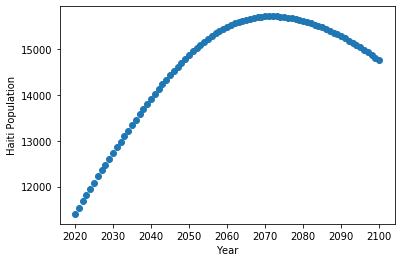

(array([[120.55783055]]), array([[42.33223205]]))


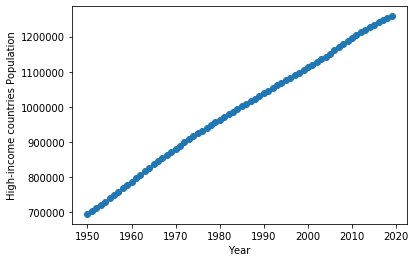

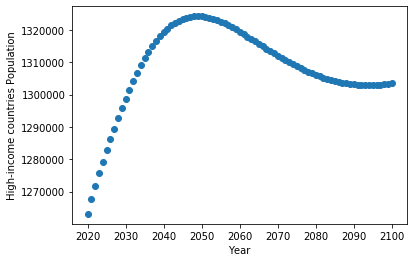

(array([[8114.85282847]]), array([[101.29573963]]))


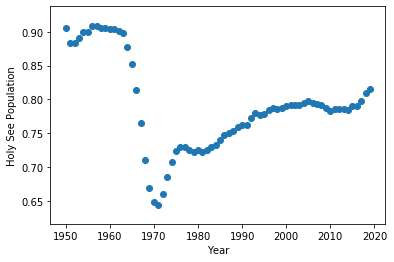

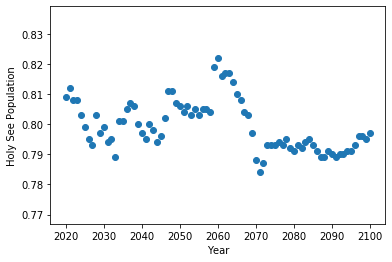

(array([[-0.00110227]]), array([[-0.00015743]]))


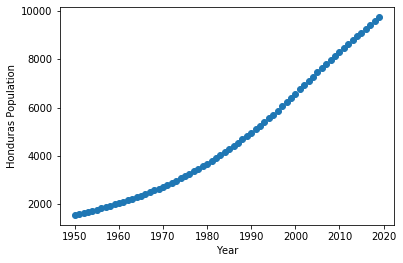

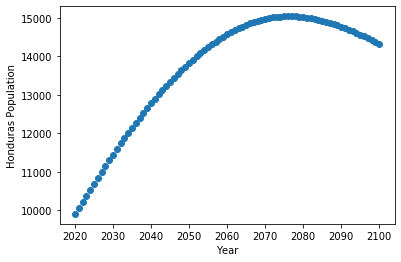

(array([[122.96607985]]), array([[55.60651009]]))


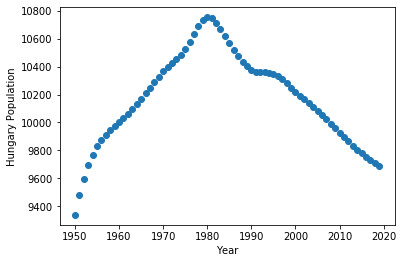

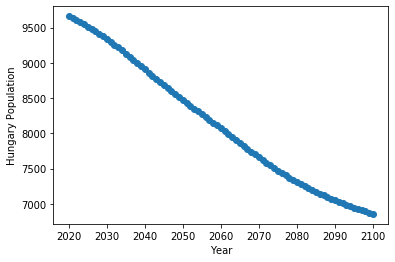

(array([[-0.42383025]]), array([[-37.62420332]]))


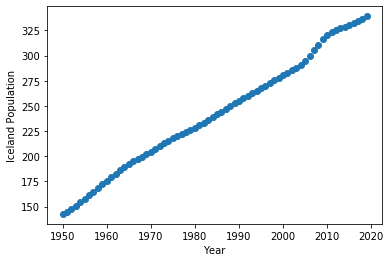

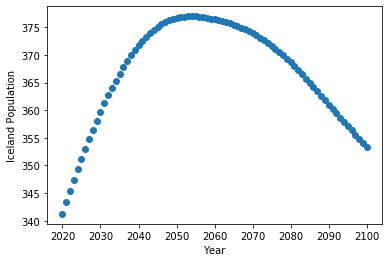

(array([[2.79181083]]), array([[0.03587317]]))


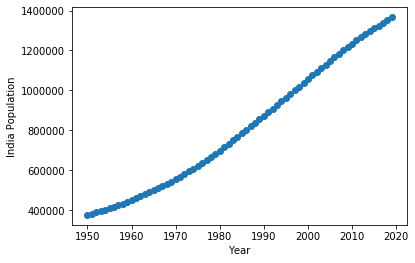

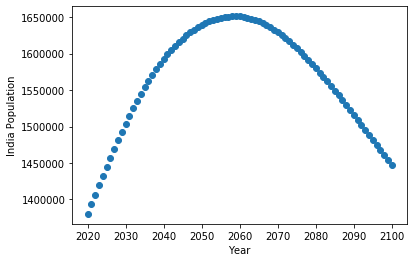

(array([[15362.95961625]]), array([[278.36930075]]))


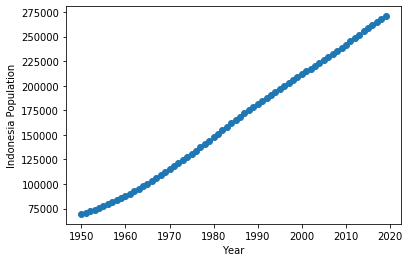

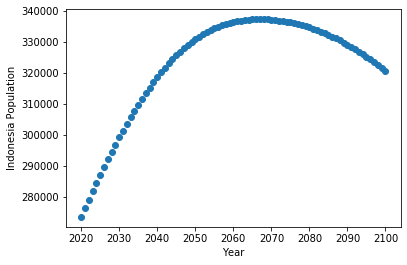

(array([[3055.4842514]]), array([[501.84055131]]))


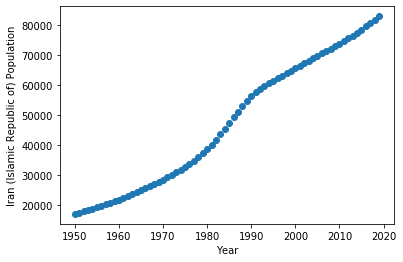

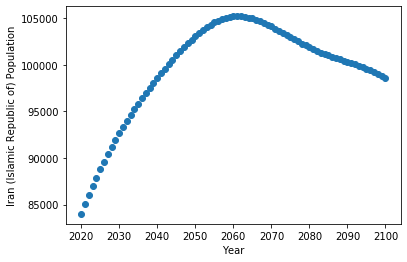

(array([[1050.02299592]]), array([[133.00936976]]))


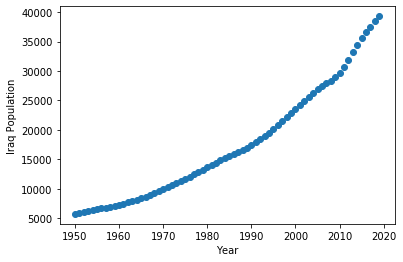

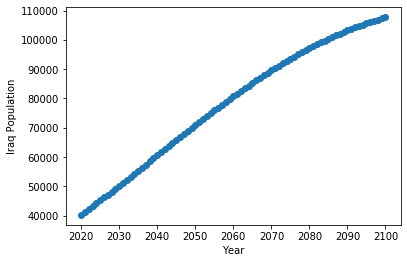

(array([[463.24642897]]), array([[878.82748627]]))


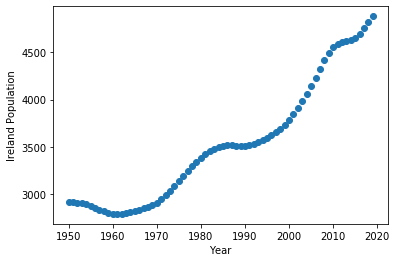

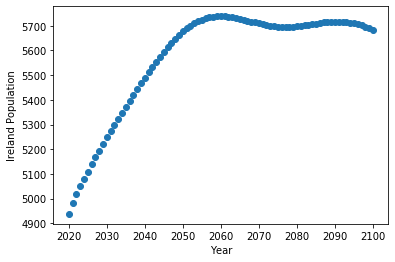

(array([[30.30337687]]), array([[7.51052791]]))


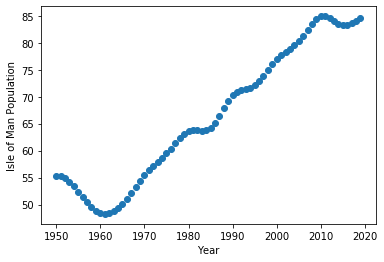

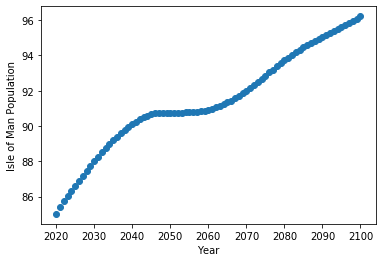

(array([[0.59423431]]), array([[0.11673625]]))


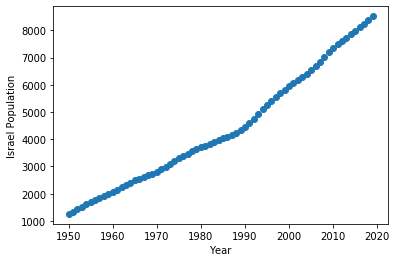

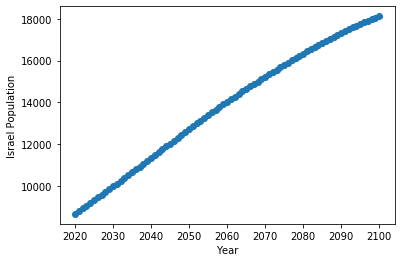

(array([[103.50582357]]), array([[121.8891925]]))


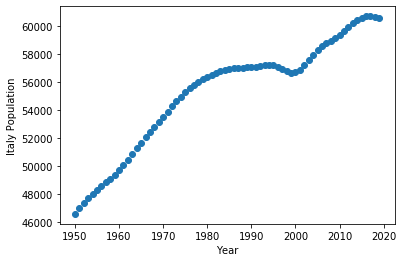

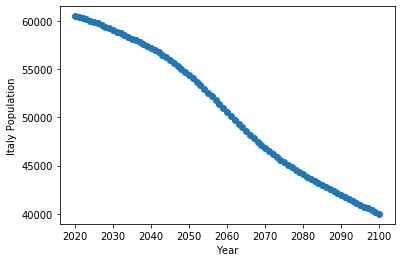

(array([[184.4828742]]), array([[-287.76976463]]))


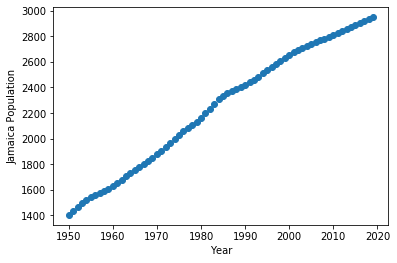

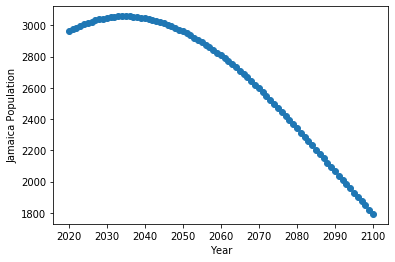

(array([[23.47083756]]), array([[-16.13100759]]))


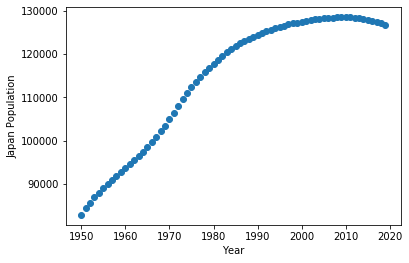

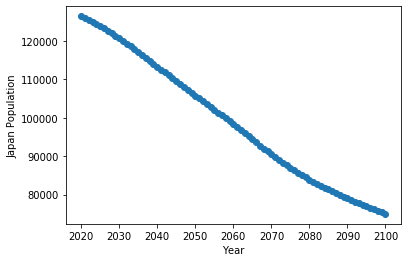

(array([[690.97137454]]), array([[-690.6352336]]))


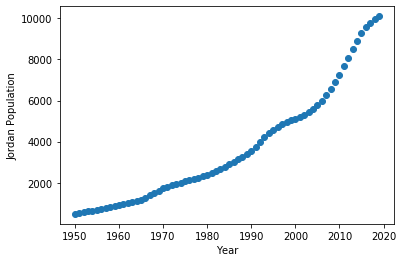

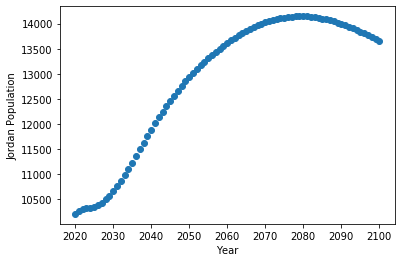

(array([[129.90012671]]), array([[51.82969415]]))


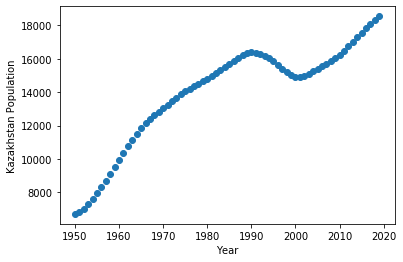

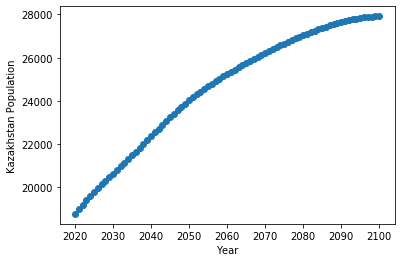

(array([[137.02715932]]), array([[115.57870059]]))


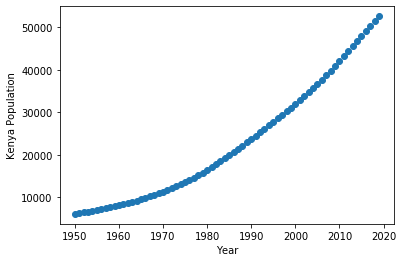

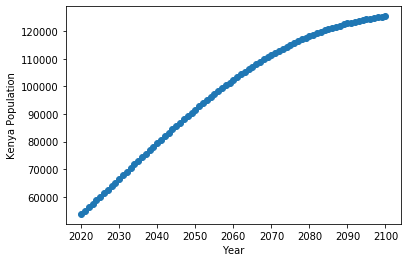

(array([[673.96158812]]), array([[933.8901818]]))


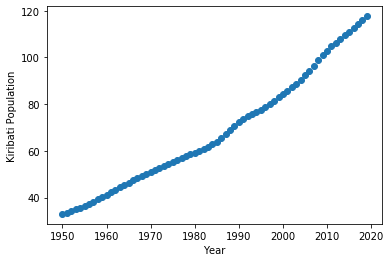

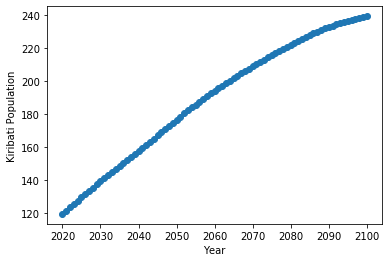

(array([[1.20255252]]), array([[1.55582401]]))


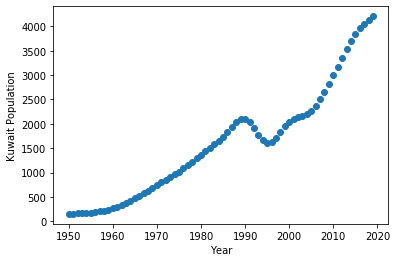

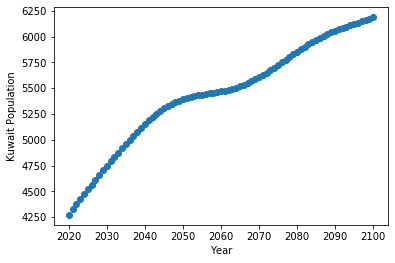

(array([[53.85988939]]), array([[21.209382]]))


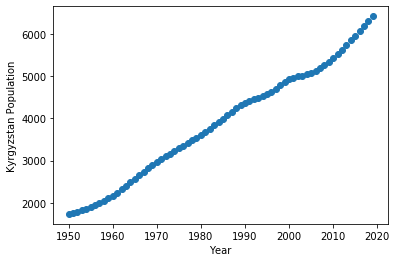

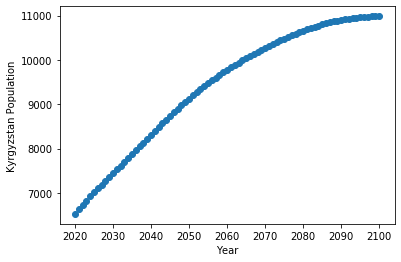

(array([[65.99137818]]), array([[57.17834381]]))


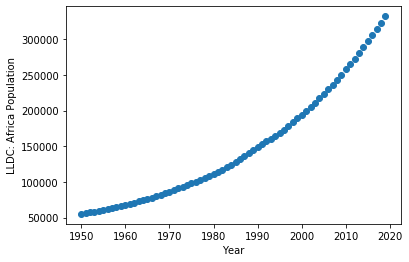

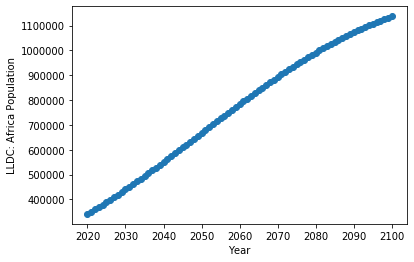

(array([[3797.88412023]]), array([[10477.85993191]]))


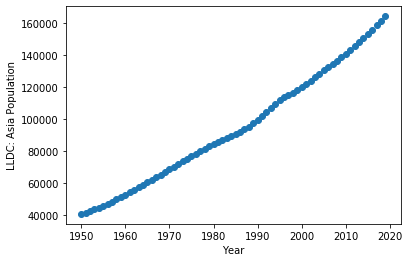

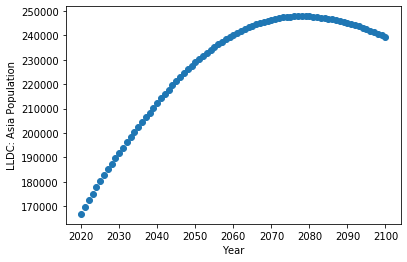

(array([[1758.7860702]]), array([[891.12120635]]))


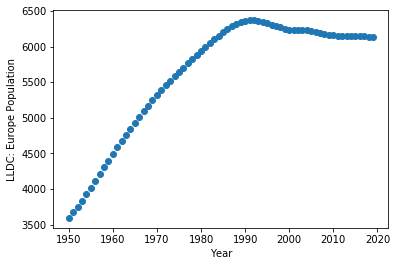

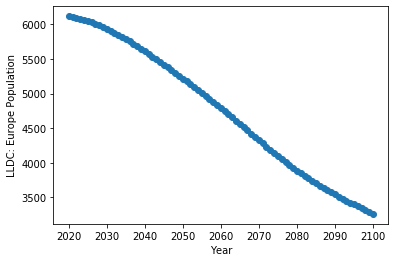

(array([[35.27606302]]), array([[-39.38998943]]))


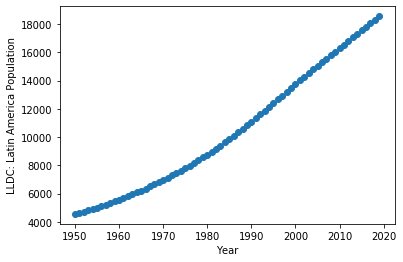

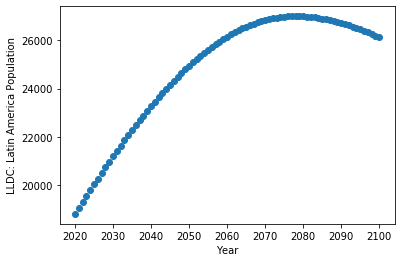

(array([[212.04336534]]), array([[92.2551876]]))


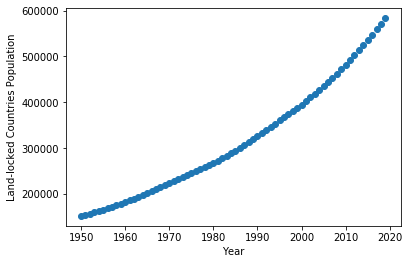

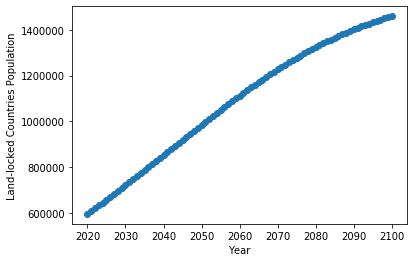

(array([[5994.16702745]]), array([[11286.71281136]]))


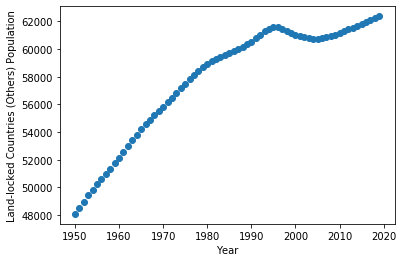

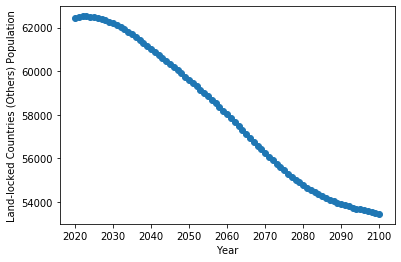

(array([[190.17740866]]), array([[-135.13352507]]))


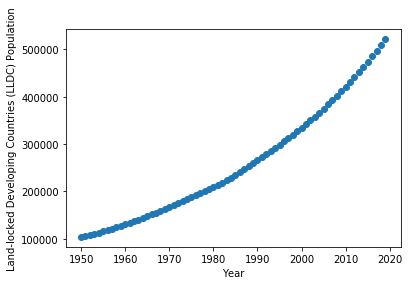

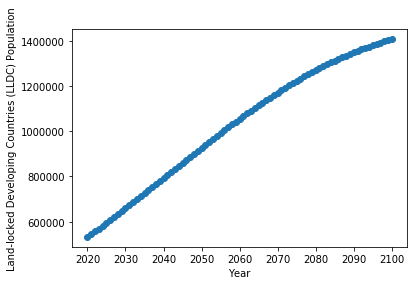

(array([[5803.98961879]]), array([[11421.84633643]]))


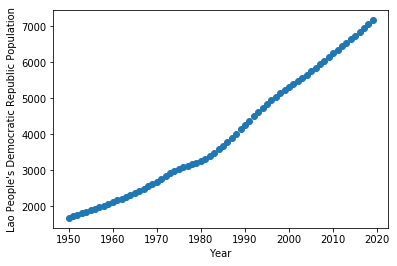

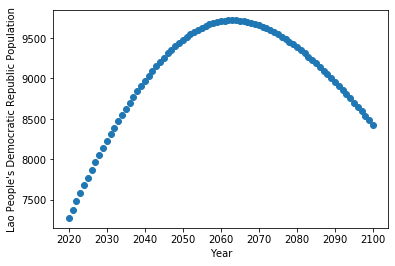

(array([[82.03961685]]), array([[12.37254715]]))


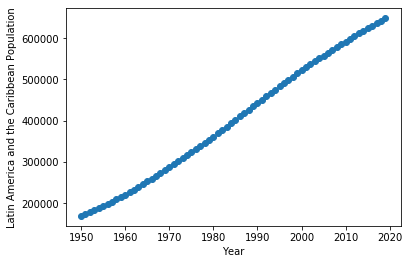

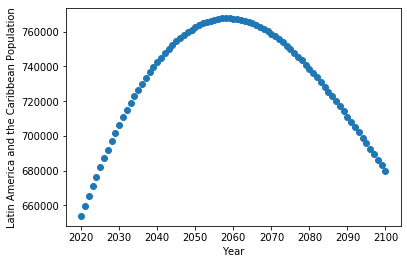

(array([[7336.34347765]]), array([[111.86206152]]))


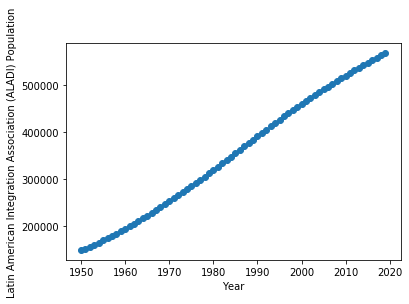

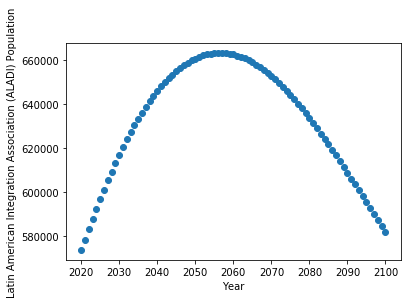

(array([[6453.33085237]]), array([[-105.18893914]]))


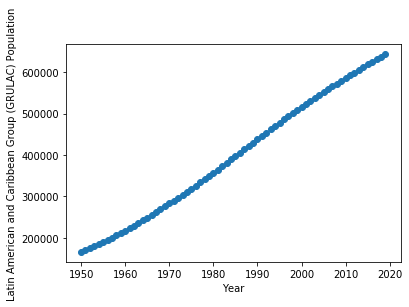

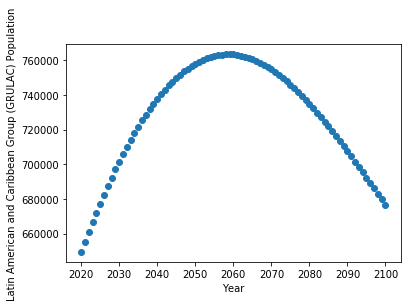

(array([[7298.27808512]]), array([[129.55923785]]))


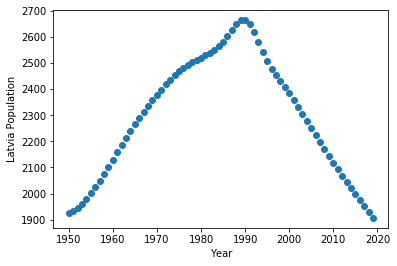

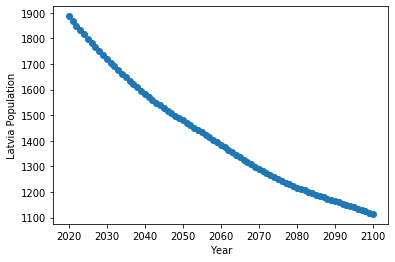

(array([[0.48614398]]), array([[-9.35382001]]))


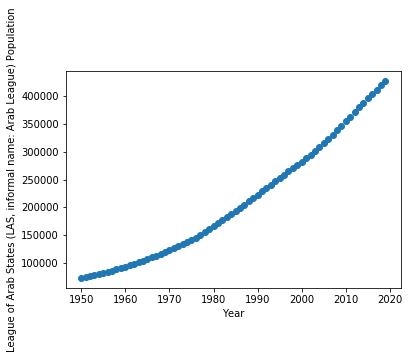

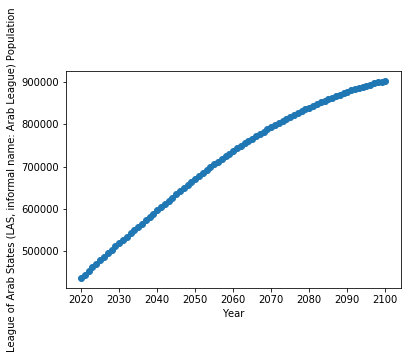

(array([[5200.63538172]]), array([[5947.64706868]]))


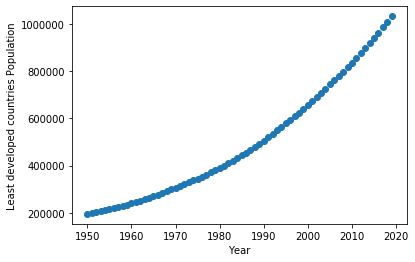

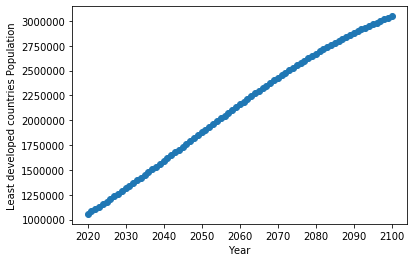

(array([[11860.37499064]]), array([[25929.20485531]]))


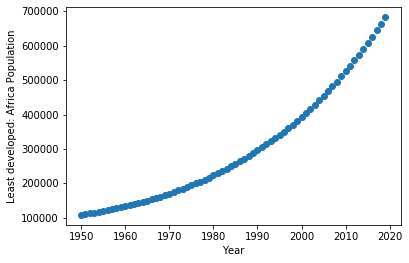

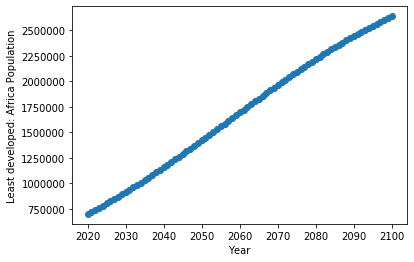

(array([[7837.82136977]]), array([[25344.32847934]]))


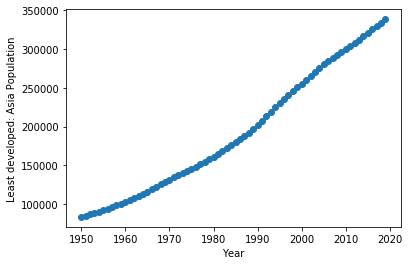

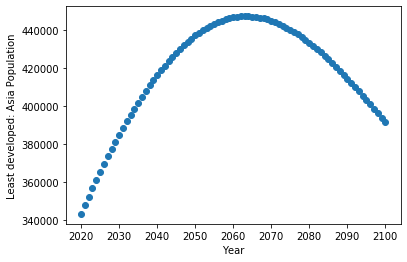

(array([[3888.95741092]]), array([[509.90569006]]))


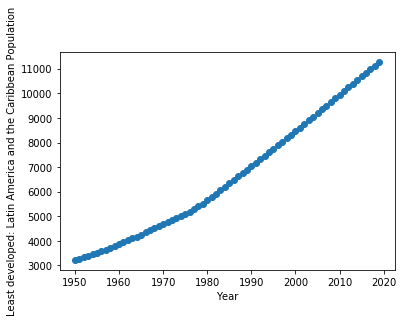

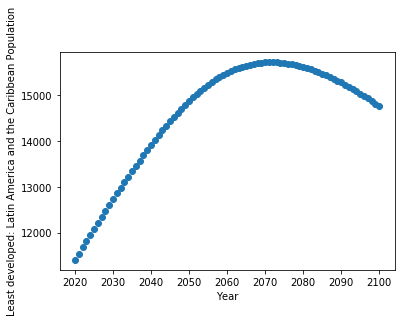

(array([[120.55783055]]), array([[42.33223205]]))


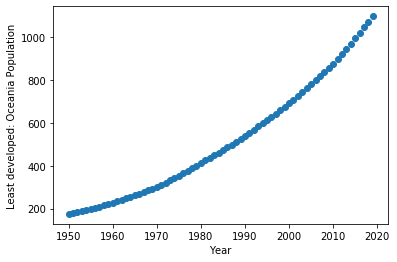

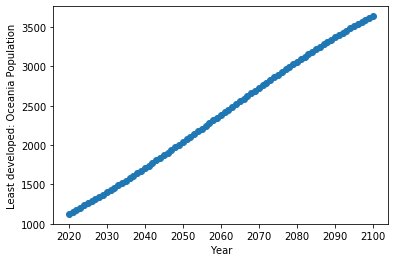

(array([[13.03837941]]), array([[32.63845386]]))


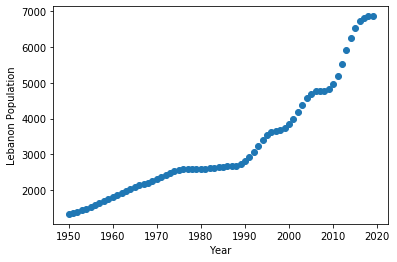

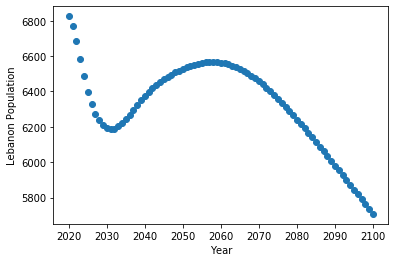

(array([[70.50552396]]), array([[-6.70933661]]))


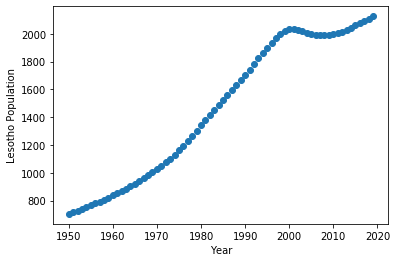

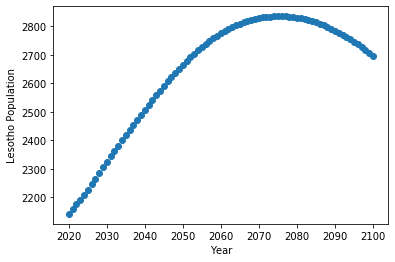

(array([[24.13418361]]), array([[7.56009763]]))


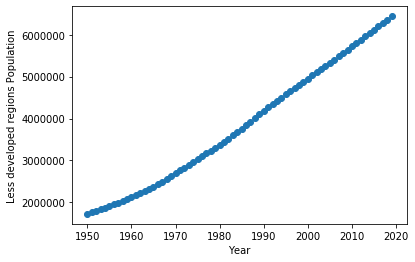

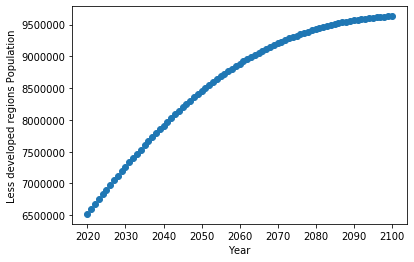

(array([[71316.18820875]]), array([[38418.53219327]]))


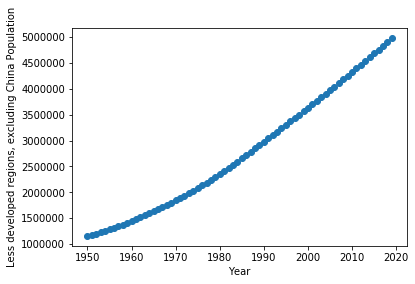

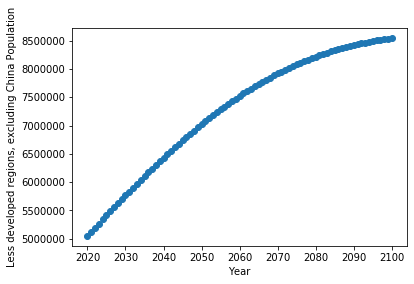

(array([[57026.69462012]]), array([[44167.34364641]]))


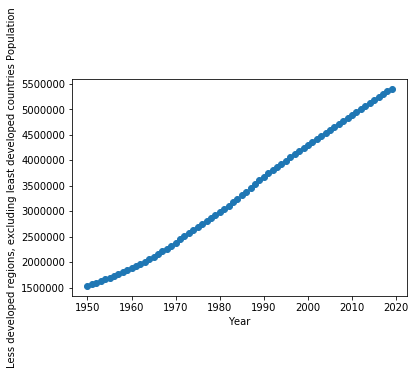

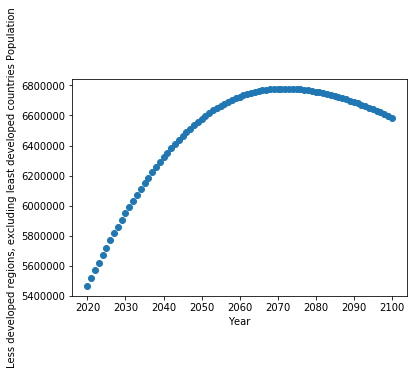

(array([[59455.81321811]]), array([[12489.32733796]]))


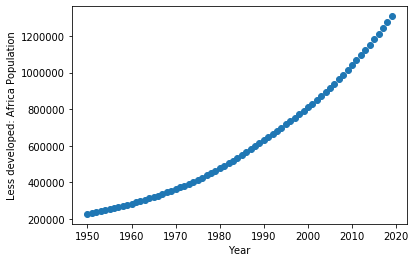

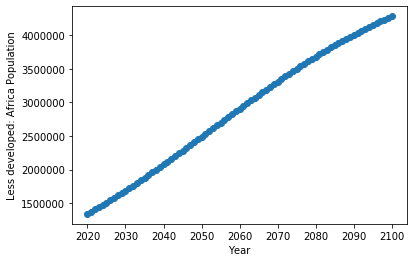

(array([[15142.4322284]]), array([[38440.98109593]]))


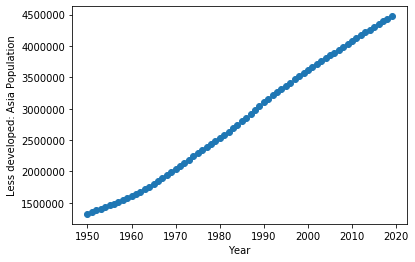

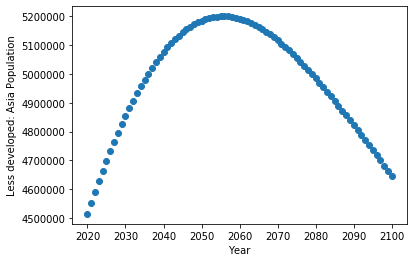

(array([[48700.55502504]]), array([[-311.63941554]]))


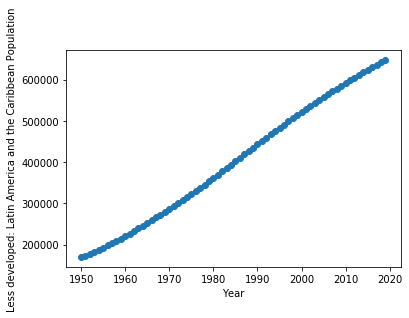

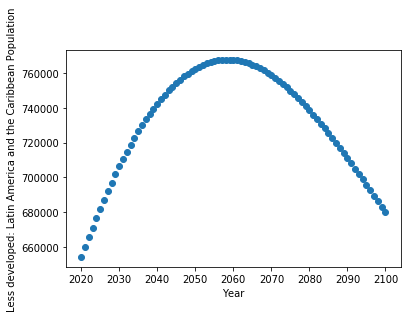

(array([[7336.34347765]]), array([[111.86206152]]))


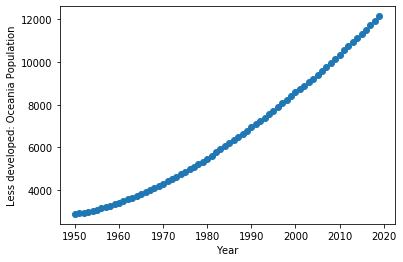

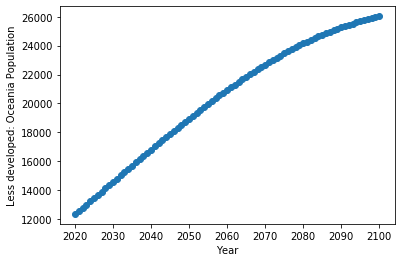

(array([[136.85747767]]), array([[177.32845136]]))


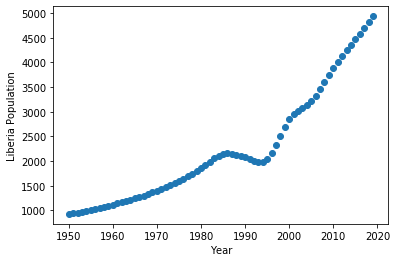

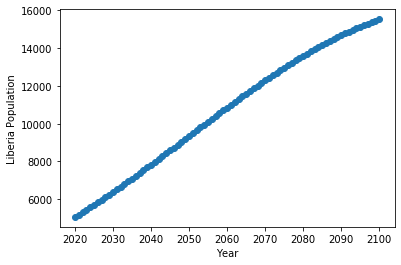

(array([[53.07604162]]), array([[137.59029097]]))


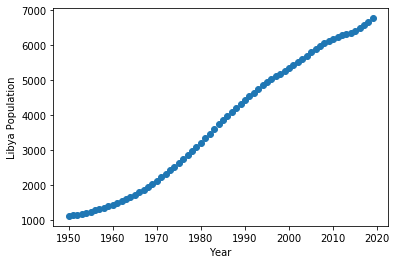

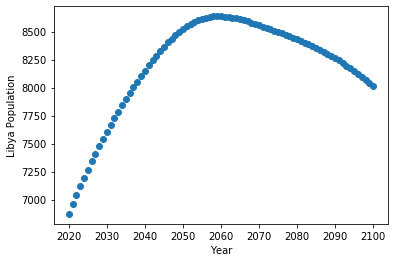

(array([[92.36541324]]), array([[10.81157227]]))


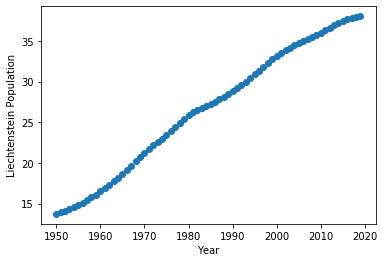

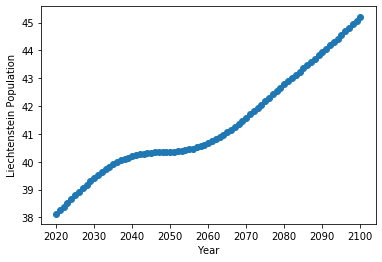

(array([[0.38016656]]), array([[0.07693446]]))


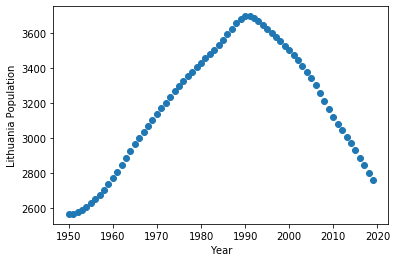

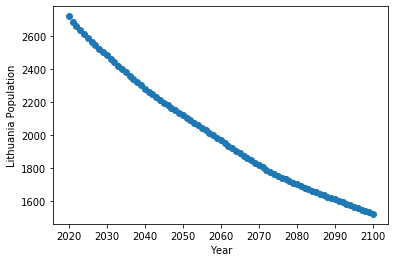

(array([[7.44432093]]), array([[-14.6541033]]))


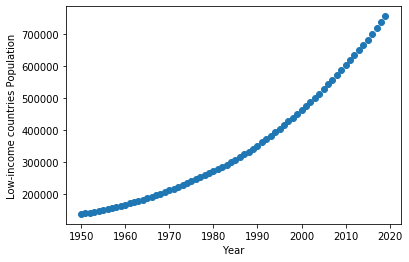

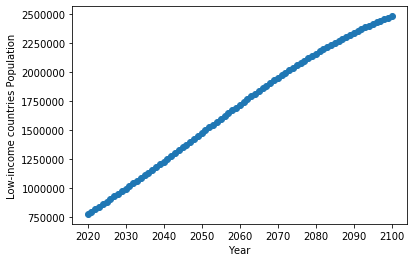

(array([[8654.32193889]]), array([[22350.0418479]]))


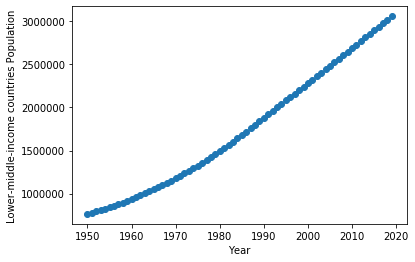

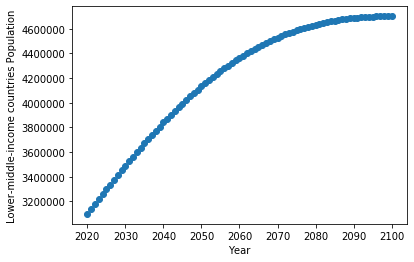

(array([[34635.57039753]]), array([[19974.46462213]]))


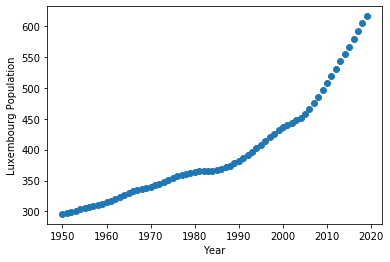

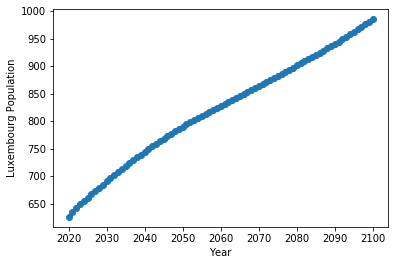

(array([[3.90968117]]), array([[4.1906365]]))


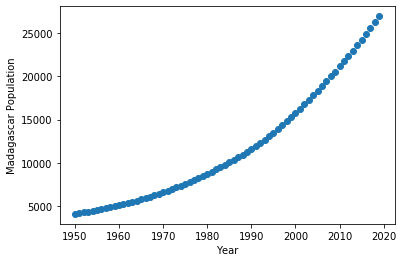

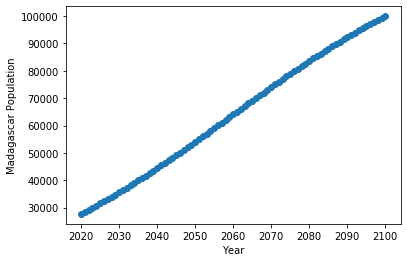

(array([[318.26200299]]), array([[941.09250781]]))


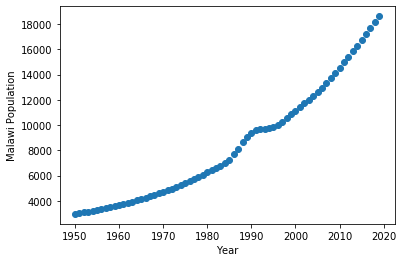

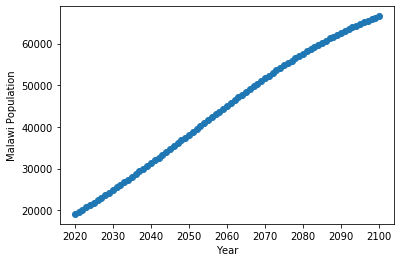

(array([[219.33615824]]), array([[625.6065376]]))


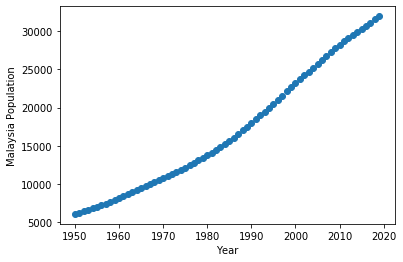

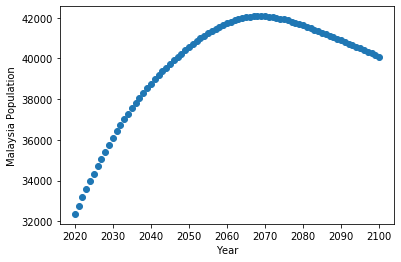

(array([[391.548296]]), array([[83.2515937]]))


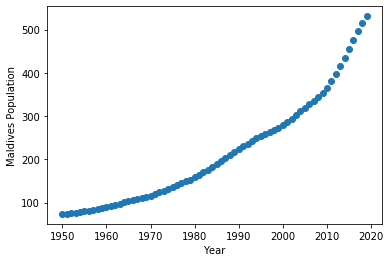

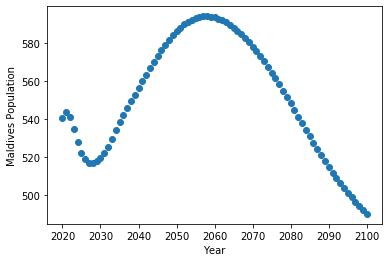

(array([[5.89539843]]), array([[-0.30649298]]))


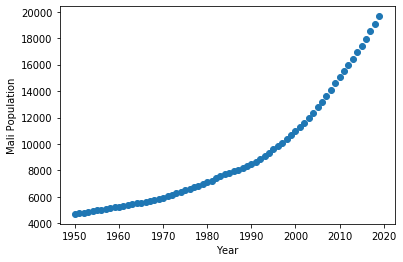

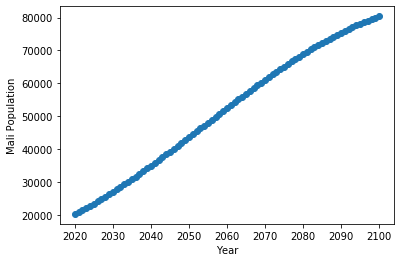

(array([[194.01245721]]), array([[800.83058778]]))


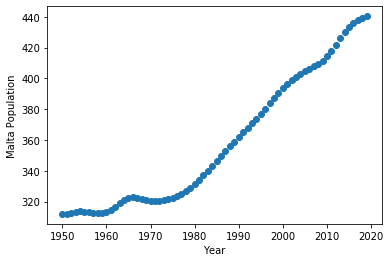

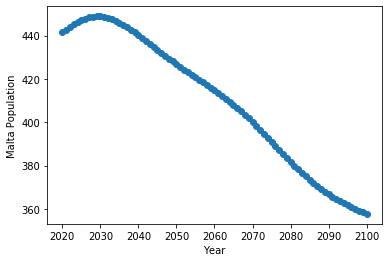

(array([[2.03710708]]), array([[-1.28673067]]))


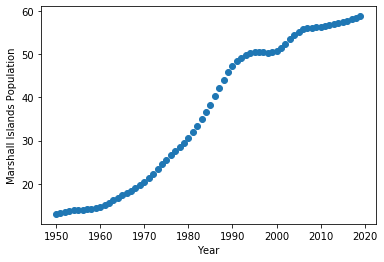

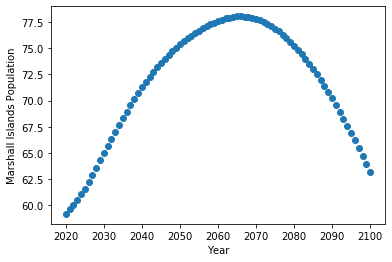

(array([[0.81855817]]), array([[0.08121389]]))


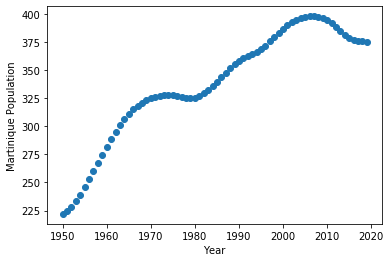

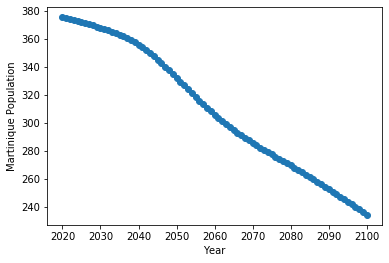

(array([[2.25858672]]), array([[-1.93116877]]))


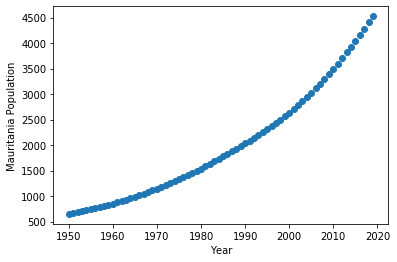

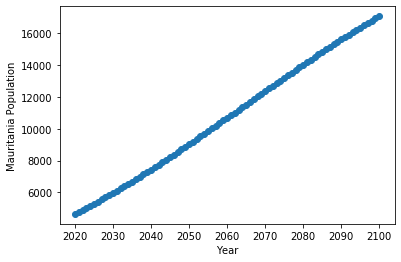

(array([[52.93921979]]), array([[160.01913101]]))


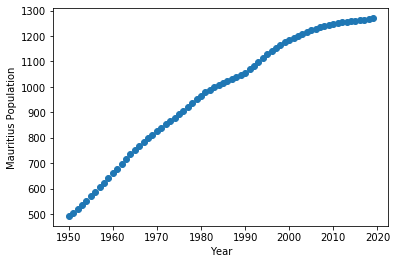

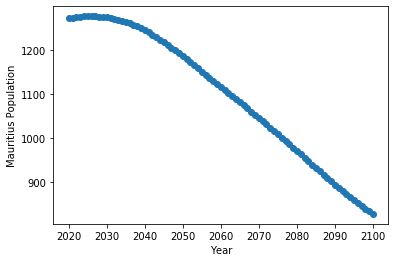

(array([[11.66303085]]), array([[-6.22776883]]))


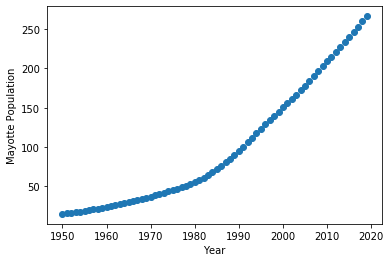

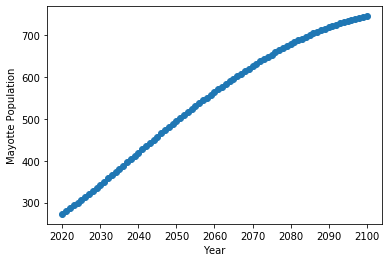

(array([[3.65146131]]), array([[6.21488241]]))


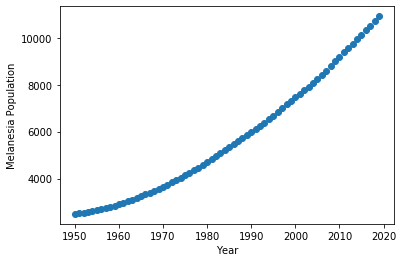

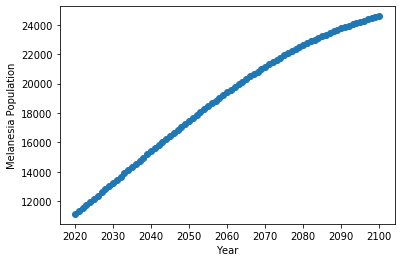

(array([[123.67327613]]), array([[174.54221247]]))


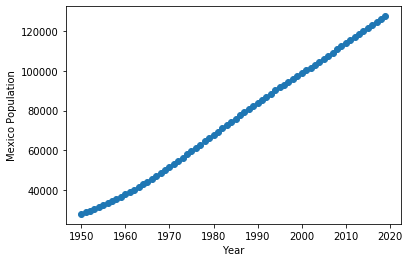

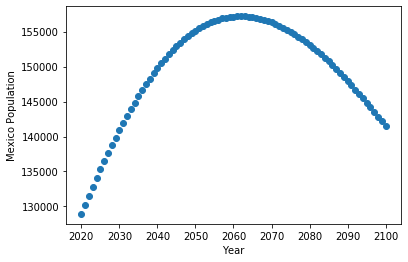

(array([[1507.87207863]]), array([[120.61422186]]))


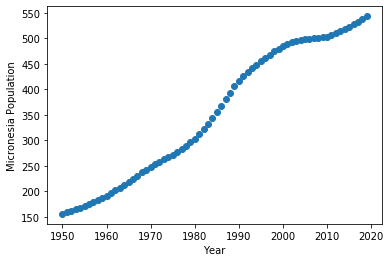

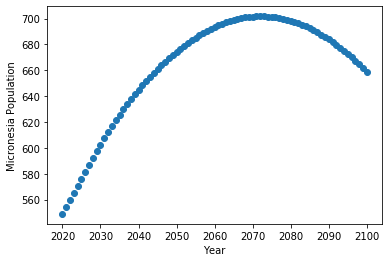

(array([[6.38927487]]), array([[1.36010729]]))


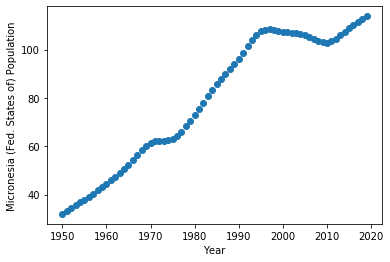

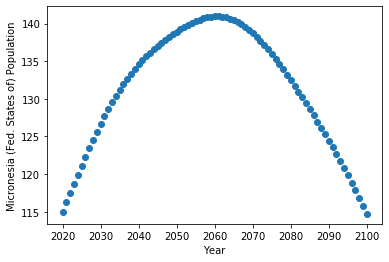

(array([[1.28470087]]), array([[-0.02767407]]))


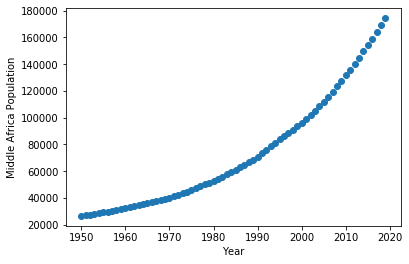

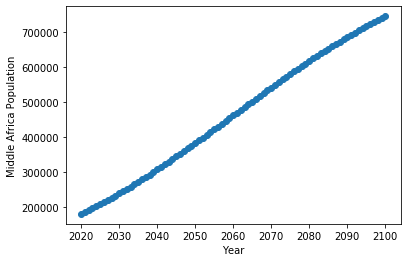

(array([[1994.57068638]]), array([[7429.15842103]]))


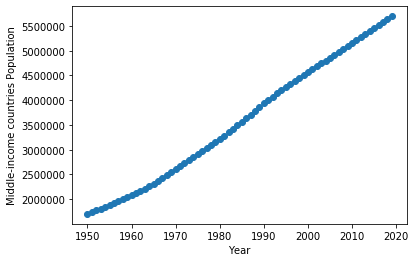

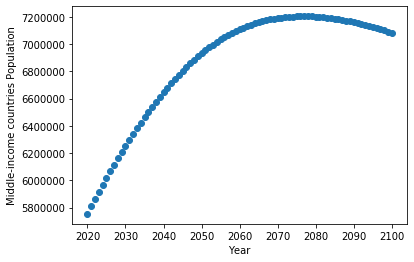

(array([[60949.83365296]]), array([[15256.09874309]]))


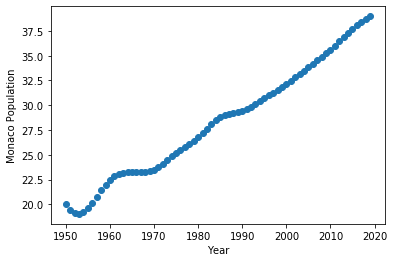

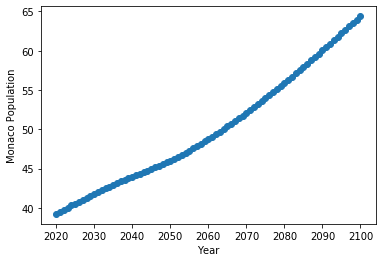

(array([[0.28119416]]), array([[0.30629149]]))


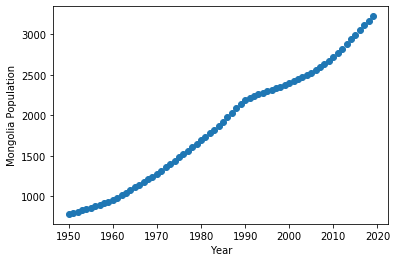

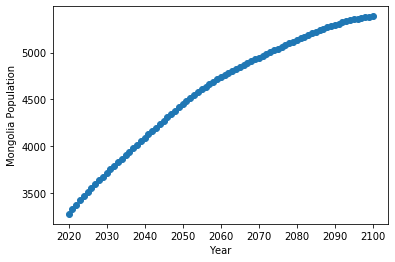

(array([[35.85284246]]), array([[26.21040899]]))


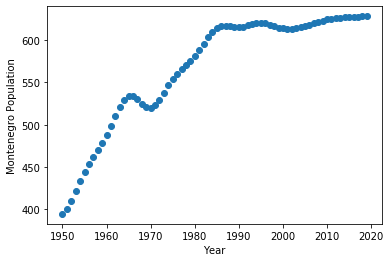

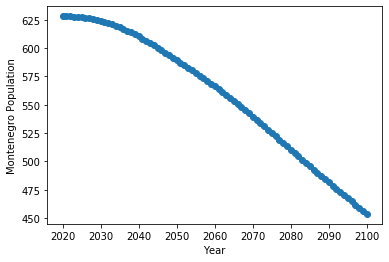

(array([[2.99494772]]), array([[-2.34389808]]))


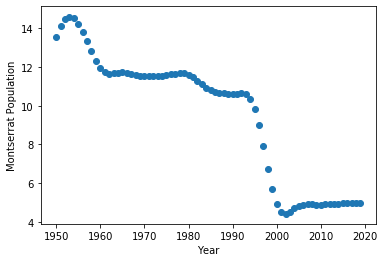

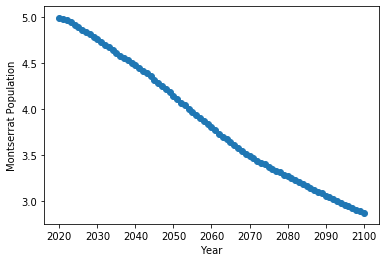

(array([[-0.15175528]]), array([[-0.02832202]]))


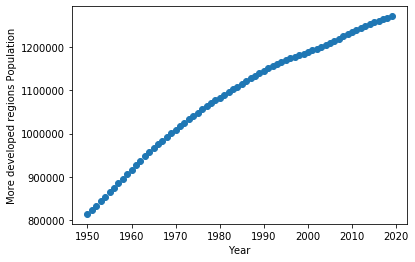

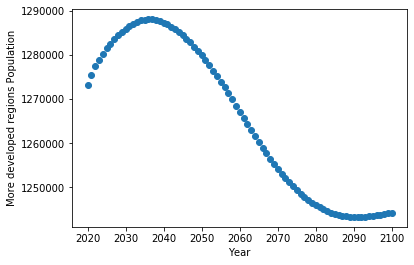

(array([[6434.0820029]]), array([[-690.28672685]]))


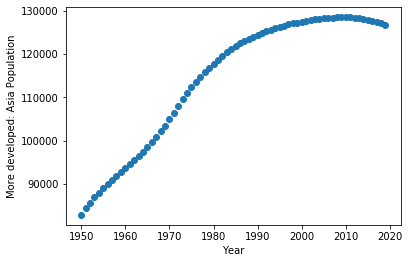

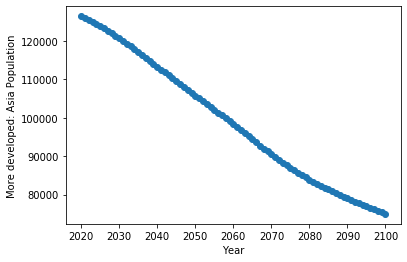

(array([[690.97137454]]), array([[-690.6352336]]))


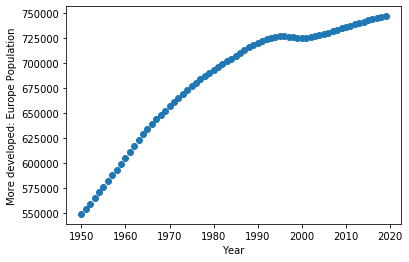

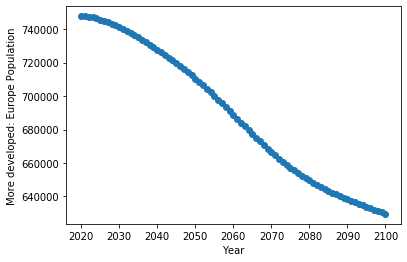

(array([[2691.84460241]]), array([[-1707.96620524]]))


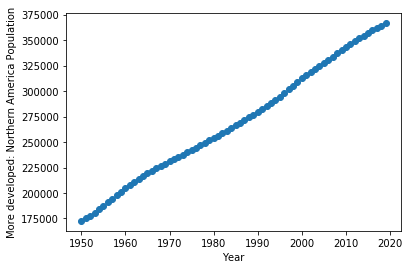

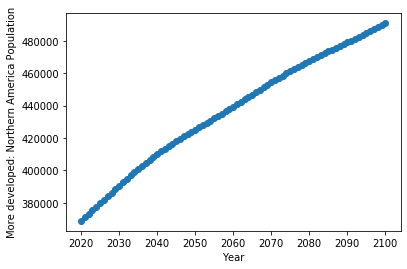

(array([[2775.98630883]]), array([[1482.45567579]]))


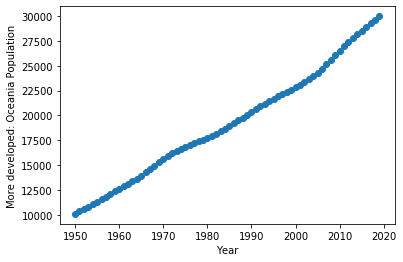

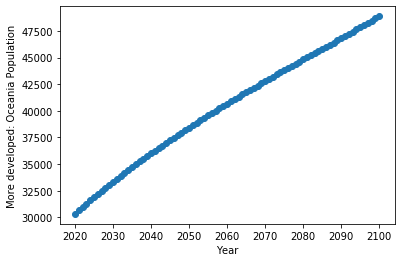

(array([[275.27971712]]), array([[225.8590362]]))


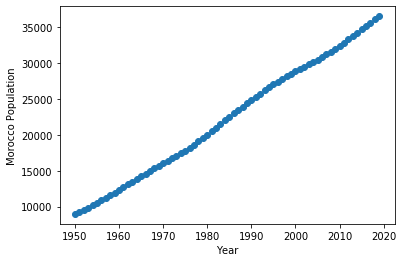

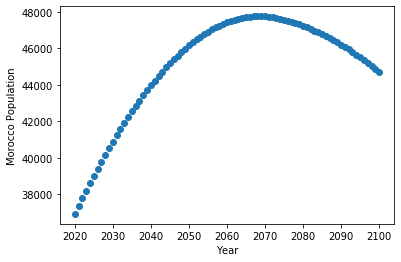

(array([[406.02973138]]), array([[89.74973354]]))


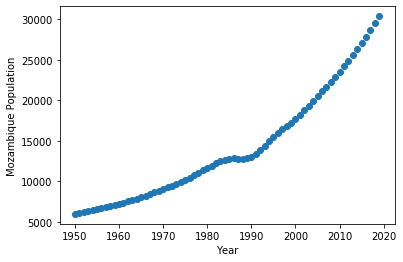

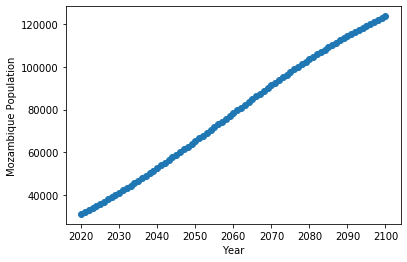

(array([[323.96215126]]), array([[1212.94723717]]))


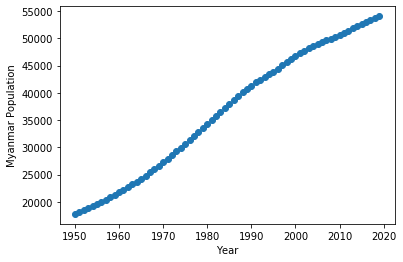

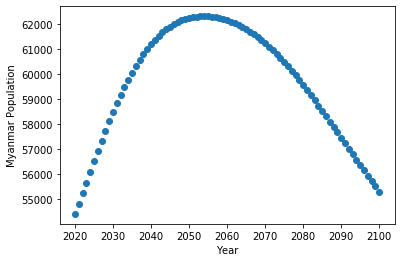

(array([[575.55983193]]), array([[-13.9260486]]))


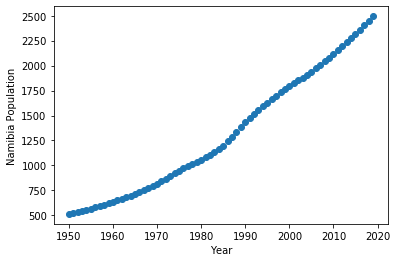

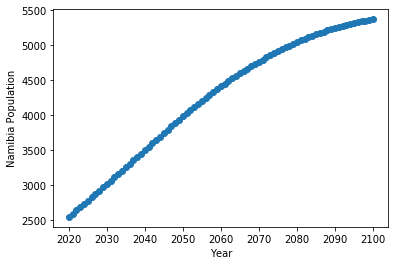

(array([[29.69379158]]), array([[37.07895361]]))


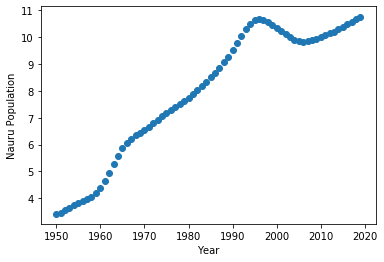

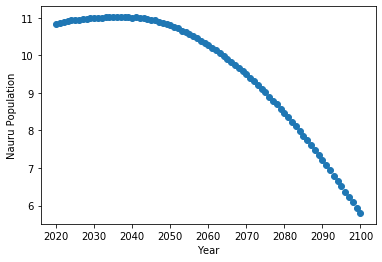

(array([[0.11343032]]), array([[-0.06333144]]))


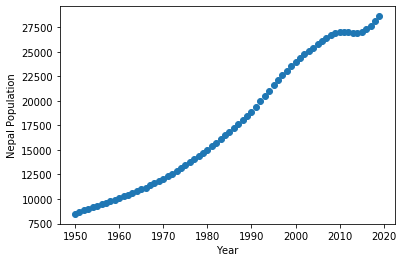

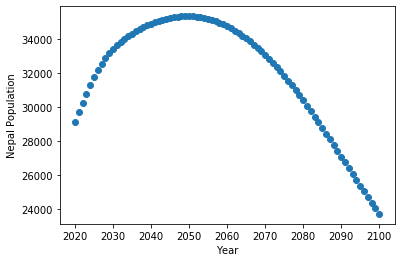

(array([[326.10582668]]), array([[-96.26074871]]))


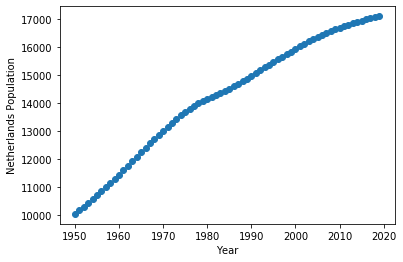

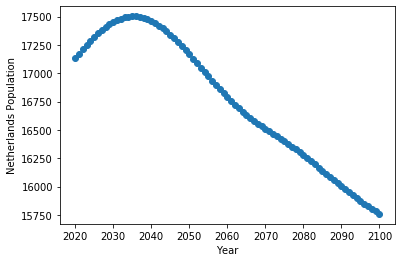

(array([[103.1063803]]), array([[-23.35000029]]))


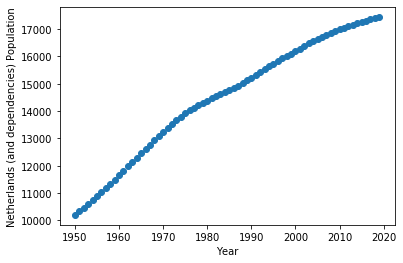

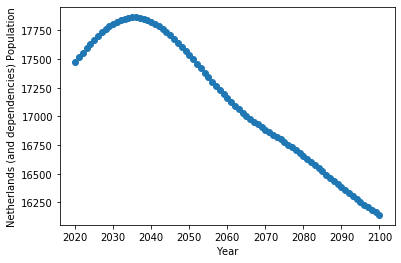

(array([[105.46963979]]), array([[-22.97271371]]))


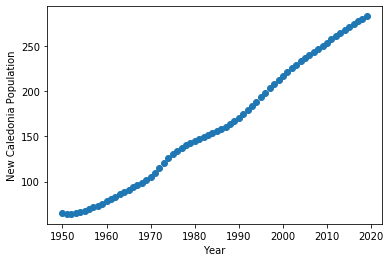

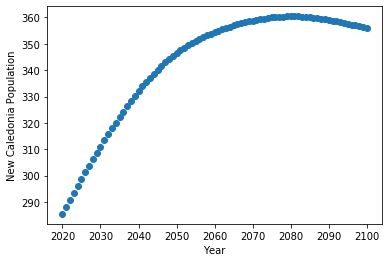

(array([[3.408548]]), array([[0.80082057]]))


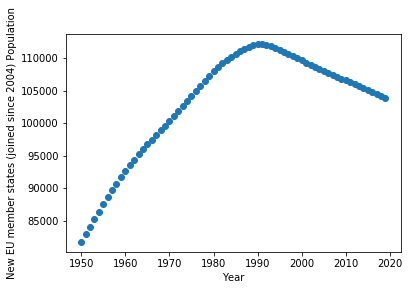

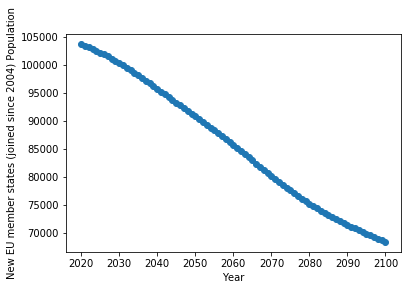

(array([[309.55784546]]), array([[-475.21782773]]))


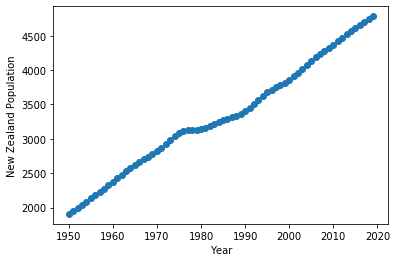

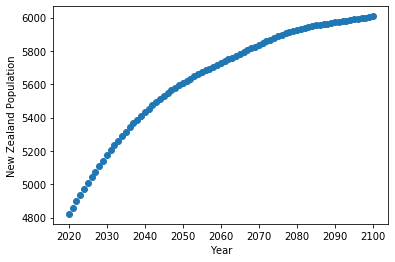

(array([[39.49440318]]), array([[13.51875748]]))


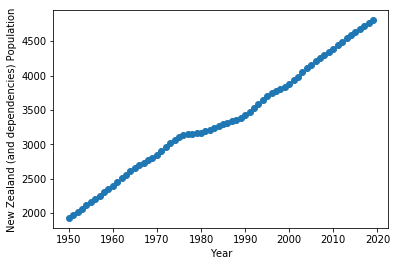

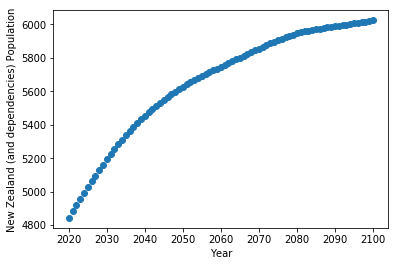

(array([[39.42894741]]), array([[13.47417139]]))


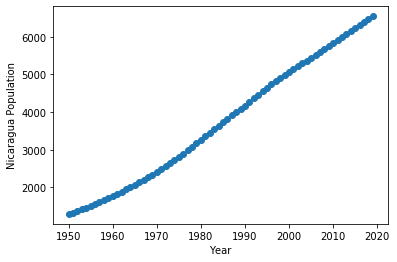

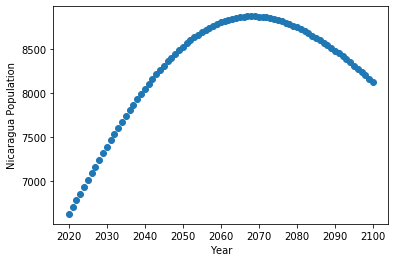

(array([[80.66877428]]), array([[18.2621605]]))


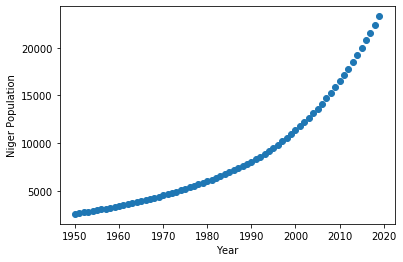

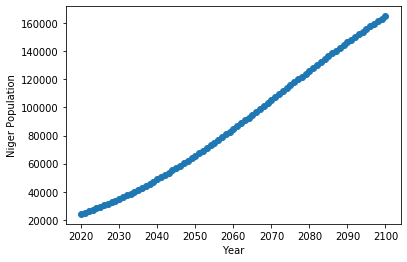

(array([[264.54855983]]), array([[1848.46992112]]))


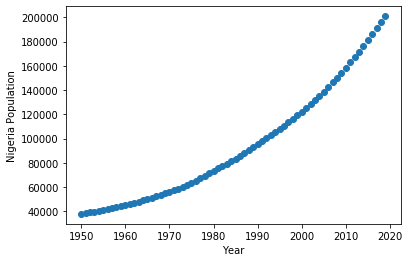

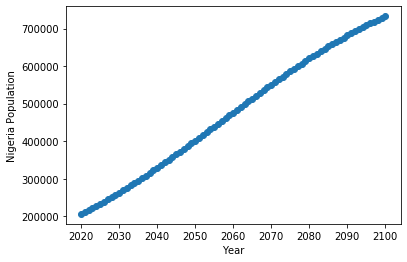

(array([[2267.95799972]]), array([[6937.75268117]]))


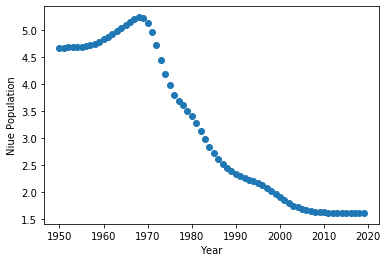

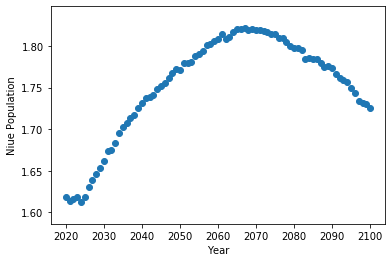

(array([[-0.06383216]]), array([[0.00172776]]))


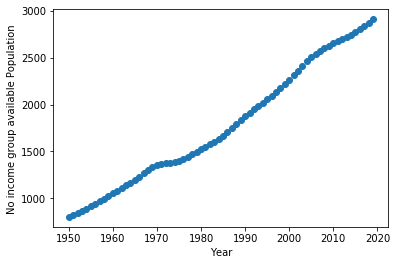

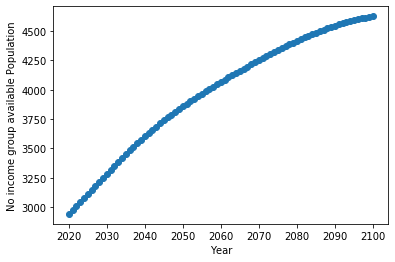

(array([[31.26179134]]), array([[20.80913579]]))


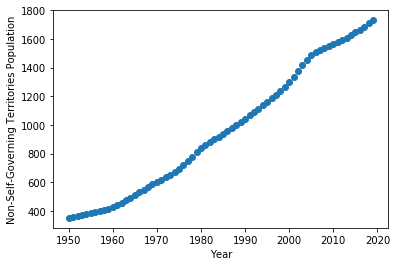

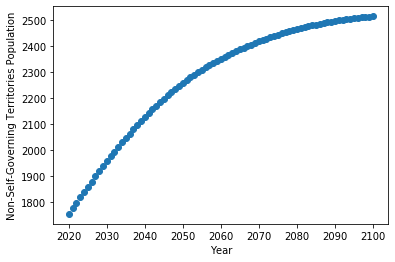

(array([[21.89197984]]), array([[9.0427154]]))


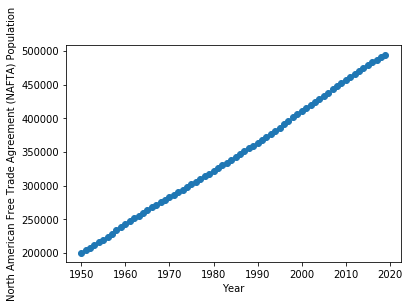

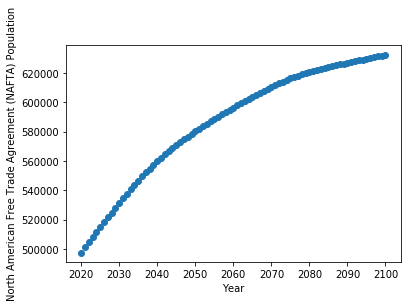

(array([[4282.94422714]]), array([[1603.66198026]]))


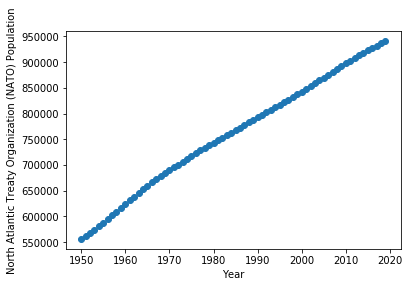

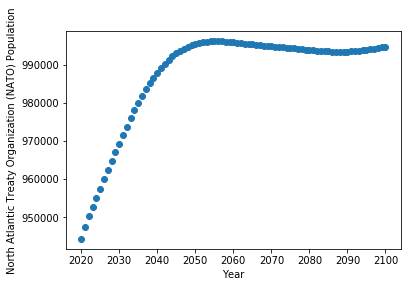

(array([[5462.35234382]]), array([[407.36740955]]))


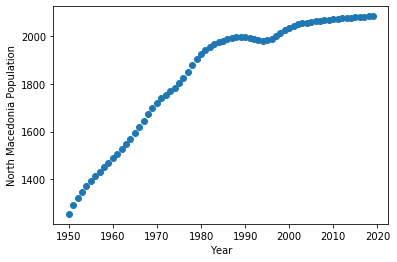

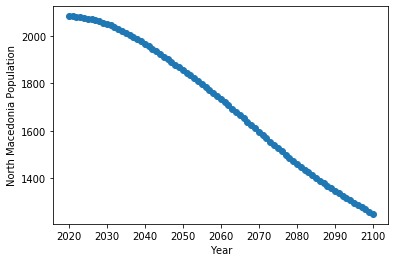

(array([[11.58507744]]), array([[-11.55542304]]))


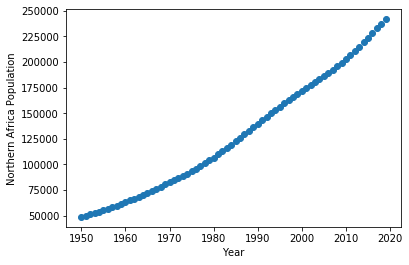

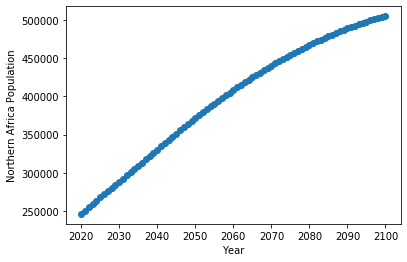

(array([[2821.72699844]]), array([[3326.22003074]]))


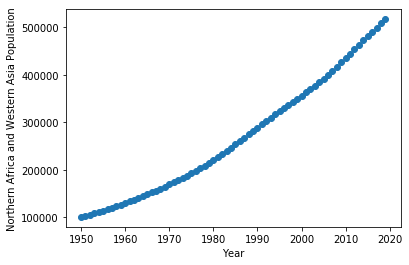

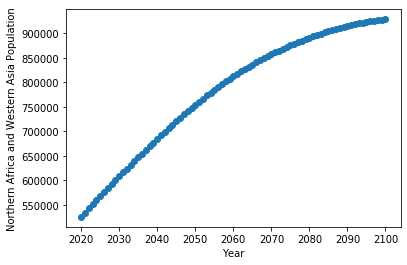

(array([[6097.17155509]]), array([[5079.48477825]]))


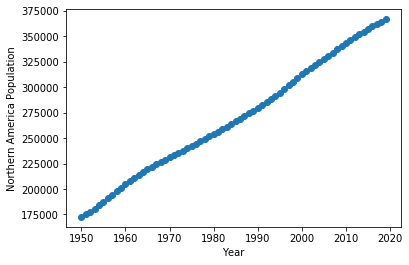

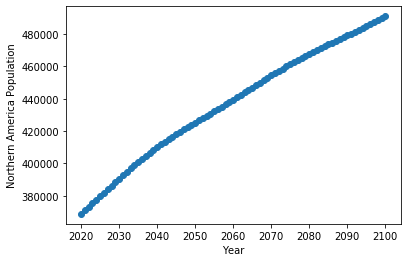

(array([[2775.98630883]]), array([[1482.45567579]]))


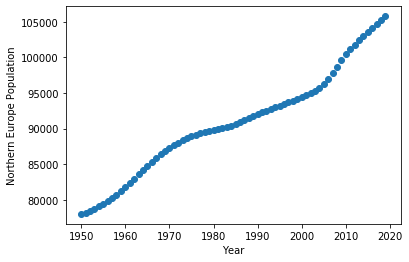

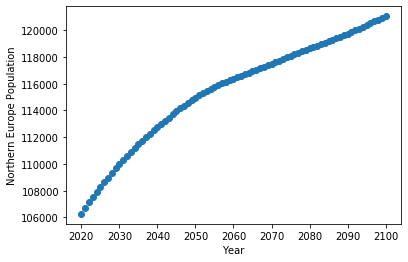

(array([[358.03594744]]), array([[164.88619252]]))


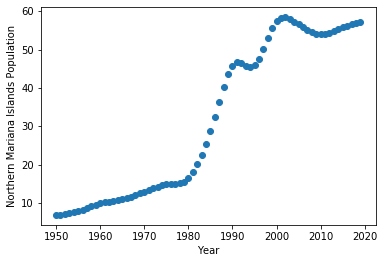

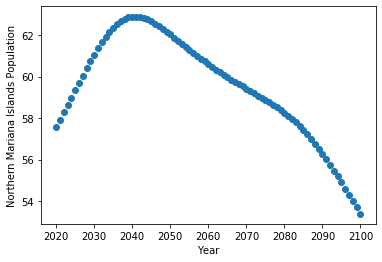

(array([[0.94850772]]), array([[-0.07950971]]))


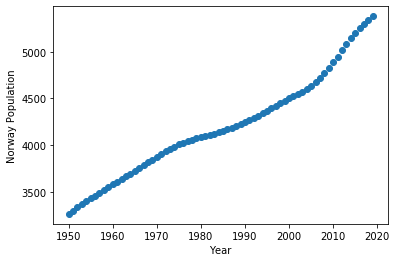

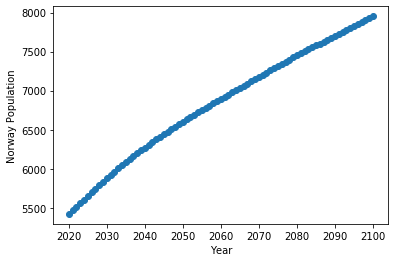

(array([[26.6524654]]), array([[30.57461974]]))


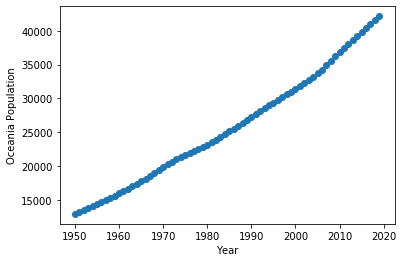

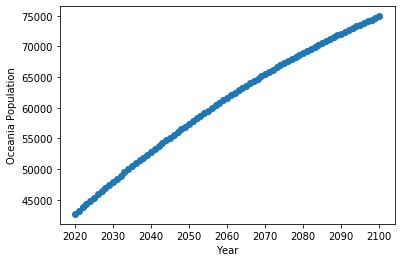

(array([[412.13719479]]), array([[403.18748756]]))


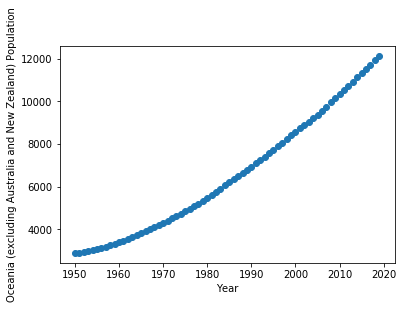

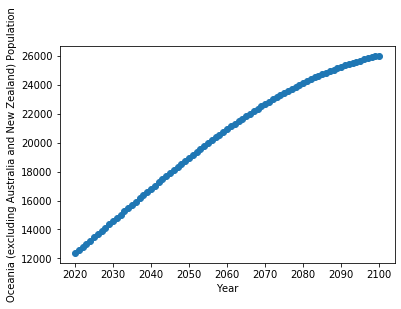

(array([[136.85747767]]), array([[177.32845136]]))


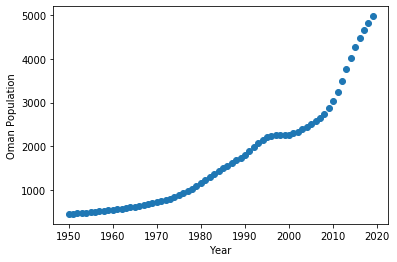

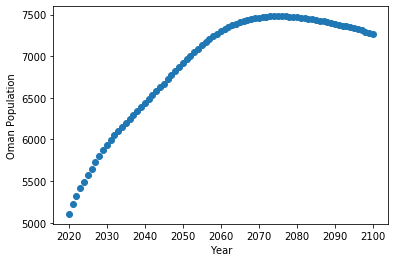

(array([[56.53839822]]), array([[25.4038678]]))


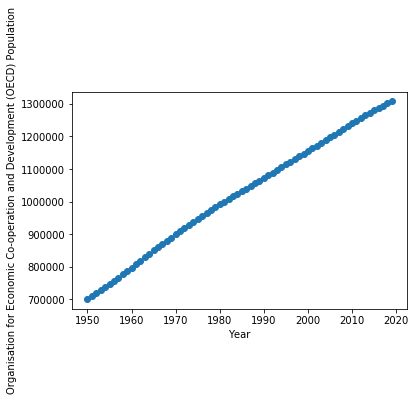

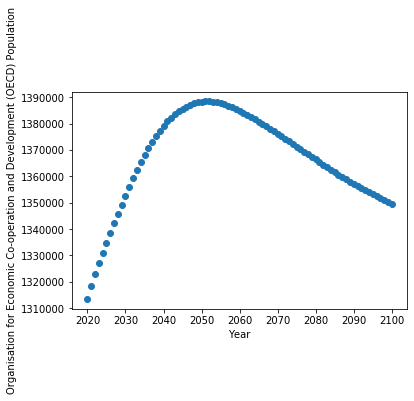

(array([[8799.75367842]]), array([[86.00523365]]))


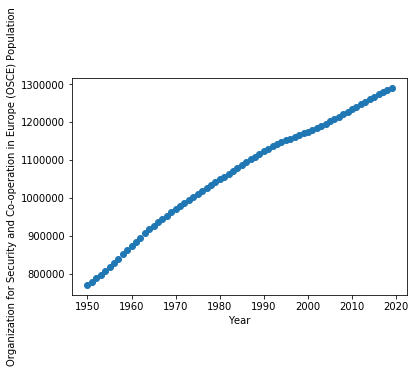

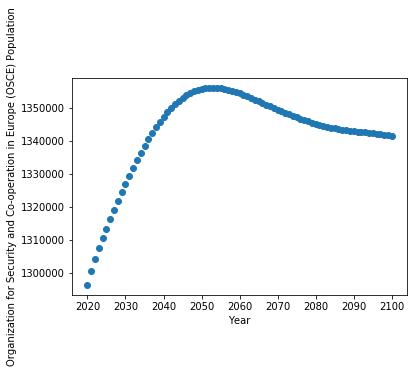

(array([[7330.56353313]]), array([[271.93860637]]))


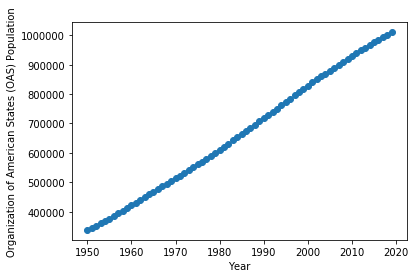

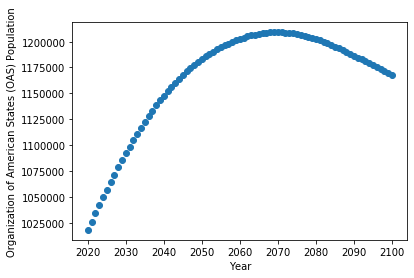

(array([[10073.35023363]]), array([[1612.60699625]]))


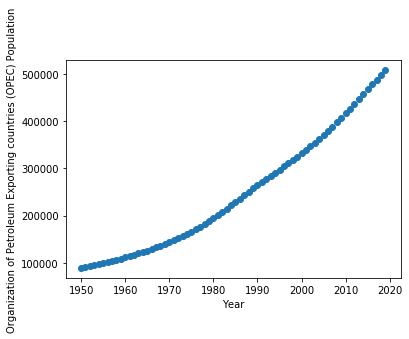

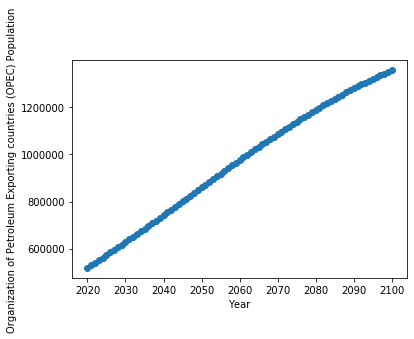

(array([[6103.94082358]]), array([[10830.94072044]]))


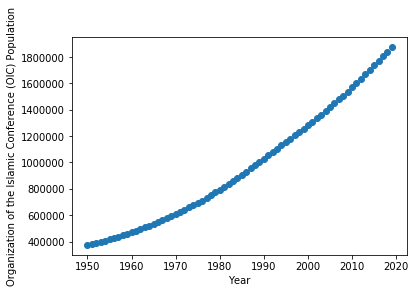

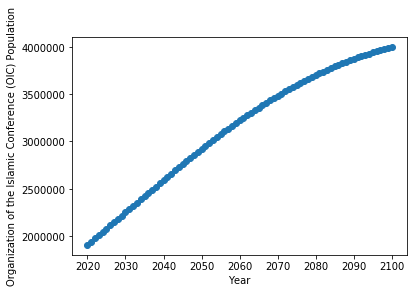

(array([[21864.73845219]]), array([[26918.42324424]]))


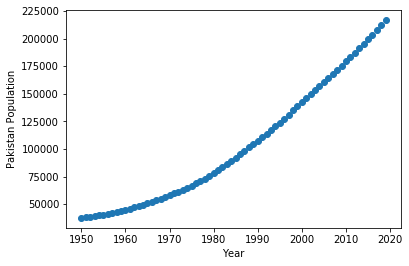

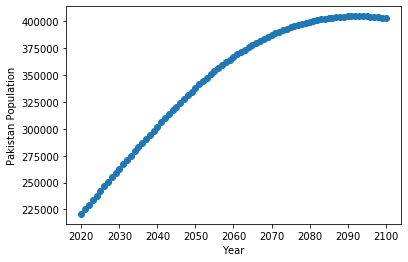

(array([[2657.4634138]]), array([[2351.74534492]]))


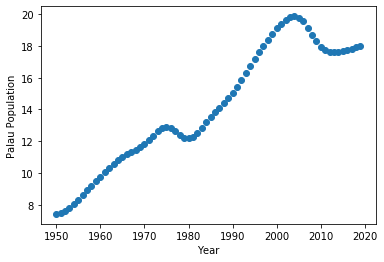

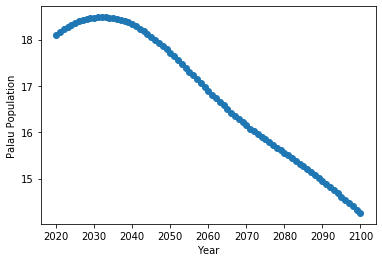

(array([[0.17802581]]), array([[-0.05832215]]))


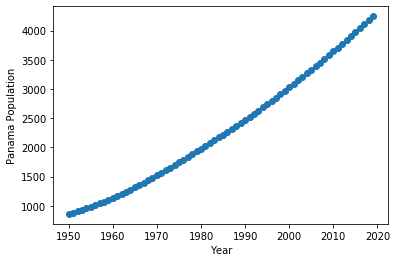

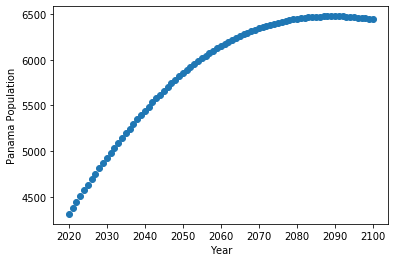

(array([[49.62394786]]), array([[25.8385042]]))


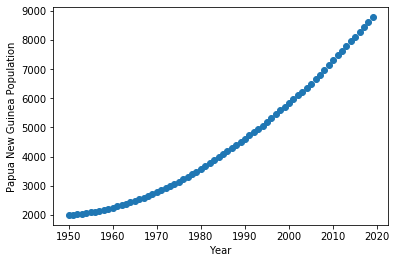

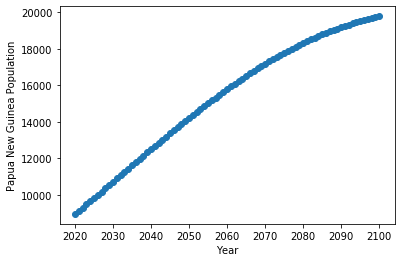

(array([[99.40315712]]), array([[140.63212222]]))


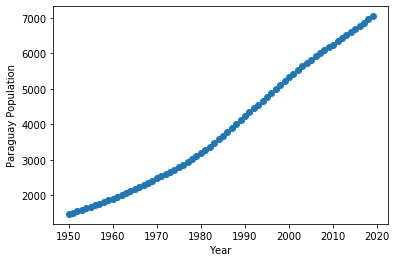

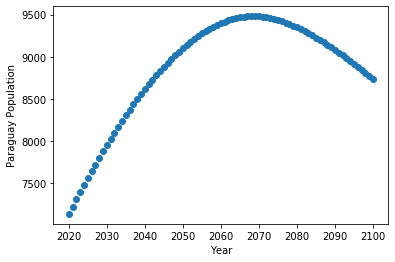

(array([[86.1007135]]), array([[19.11322834]]))


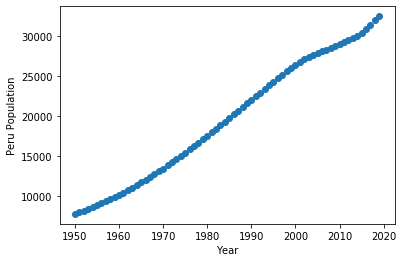

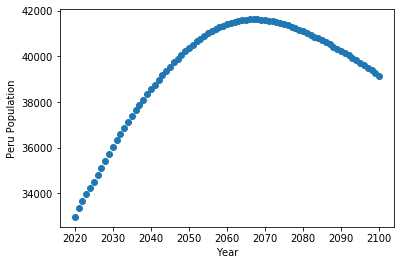

(array([[379.06588514]]), array([[70.73134767]]))


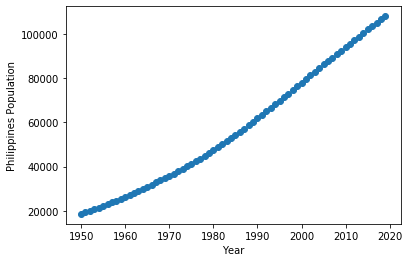

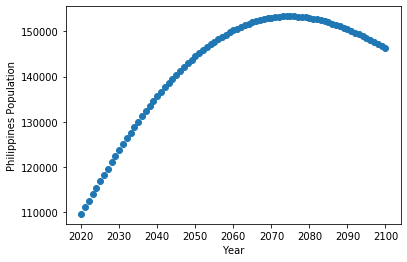

(array([[1341.89631698]]), array([[447.61855551]]))


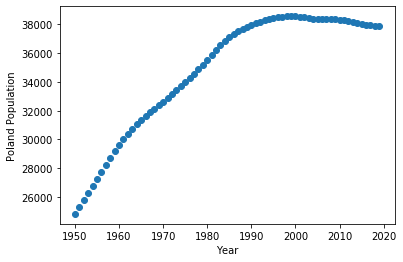

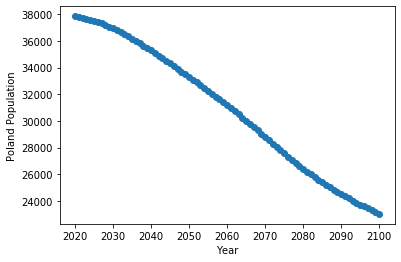

(array([[186.88459143]]), array([[-203.9445341]]))


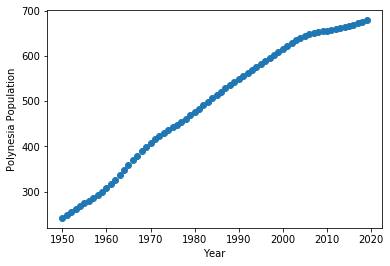

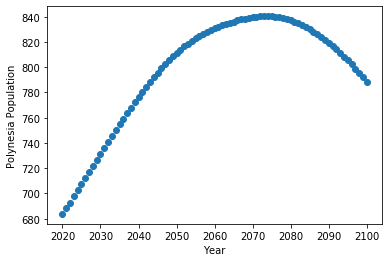

(array([[6.79492667]]), array([[1.42613159]]))


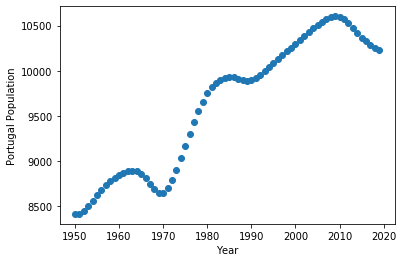

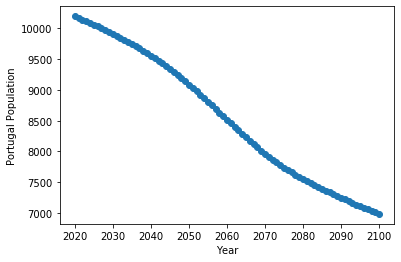

(array([[34.43286521]]), array([[-44.61639695]]))


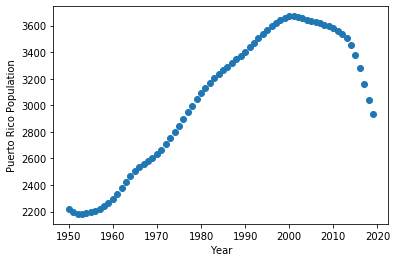

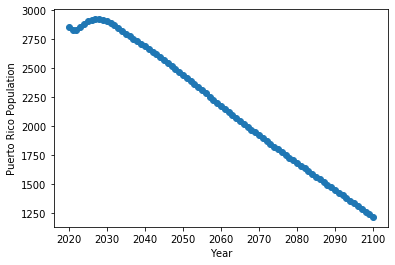

(array([[22.78201627]]), array([[-23.20947495]]))


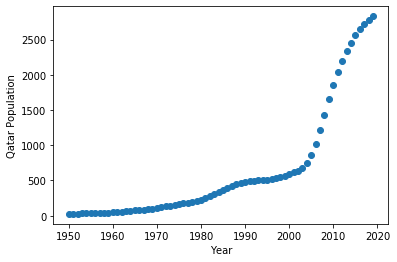

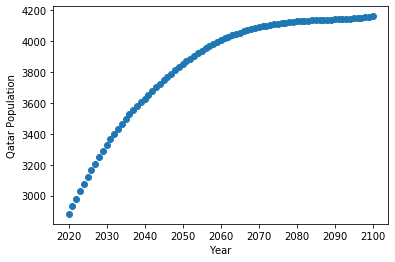

(array([[33.49186227]]), array([[14.03245671]]))


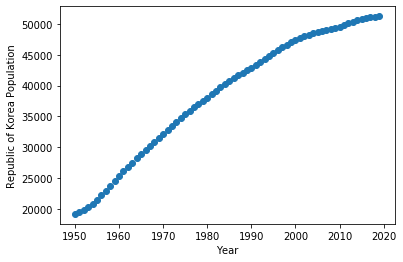

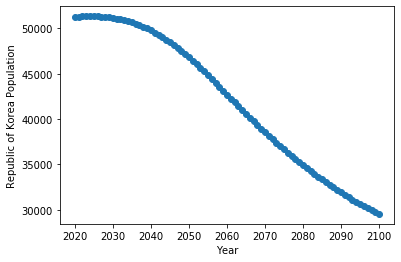

(array([[489.86769026]]), array([[-318.90344946]]))


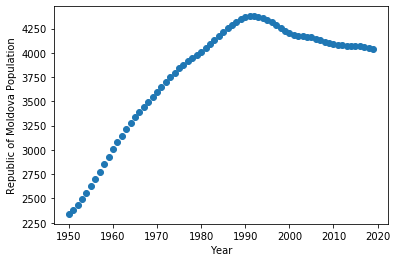

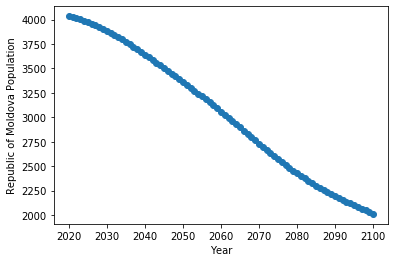

(array([[23.69098558]]), array([[-27.8345664]]))


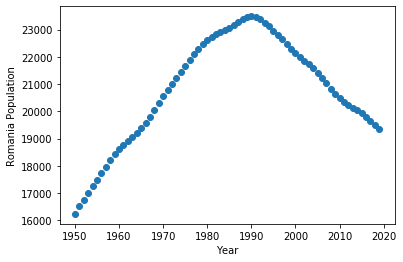

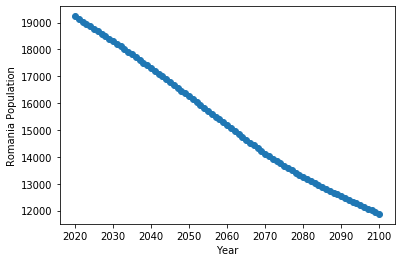

(array([[47.6212398]]), array([[-96.16581007]]))


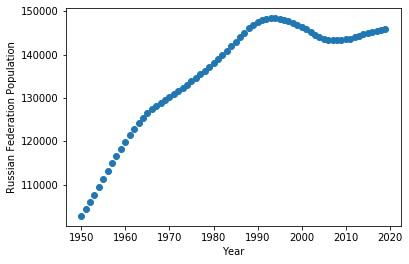

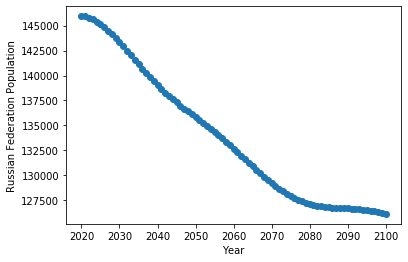

(array([[555.18559167]]), array([[-275.1074161]]))


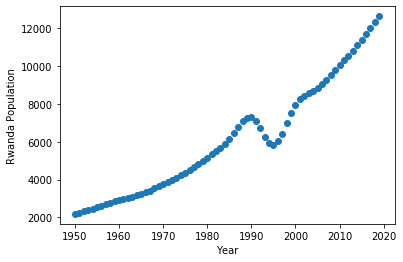

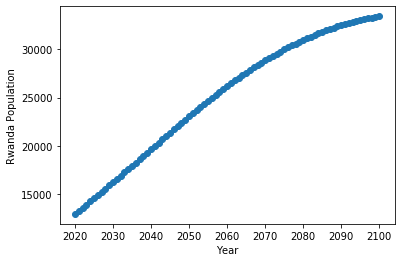

(array([[141.99234174]]), array([[269.40134006]]))


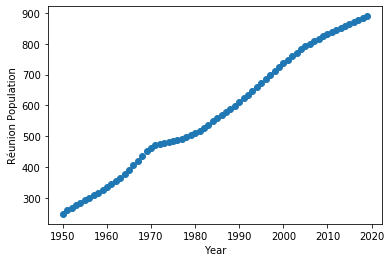

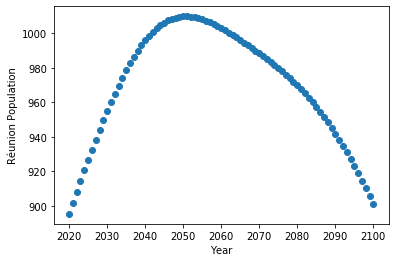

(array([[9.60297395]]), array([[-0.240246]]))


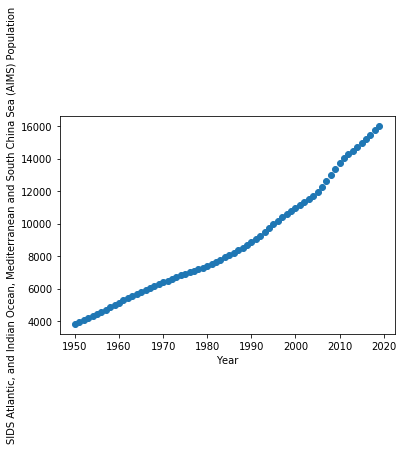

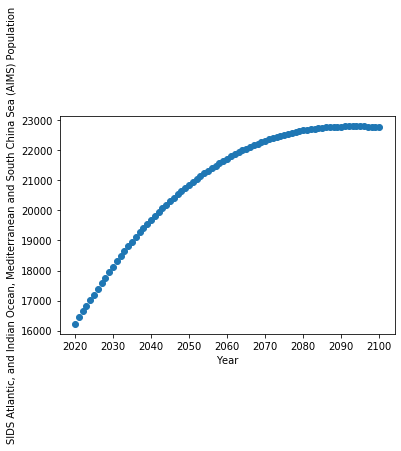

(array([[167.93570295]]), array([[78.05658401]]))


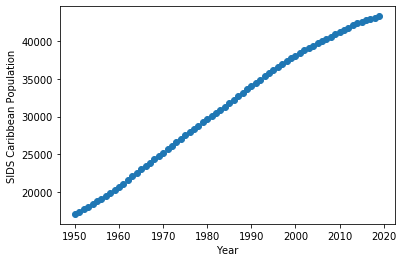

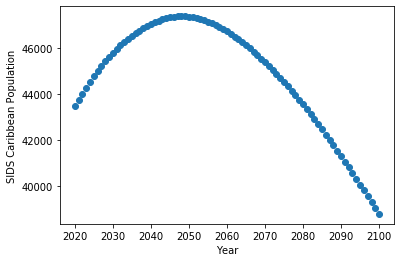

(array([[405.32208815]]), array([[-73.08547328]]))


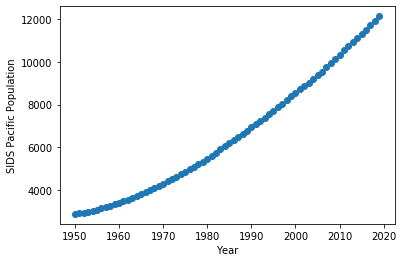

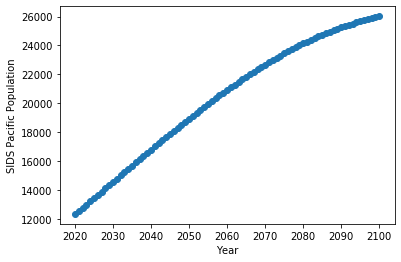

(array([[136.75852594]]), array([[177.39843805]]))


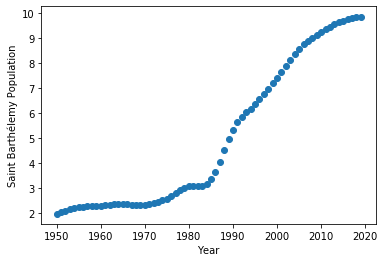

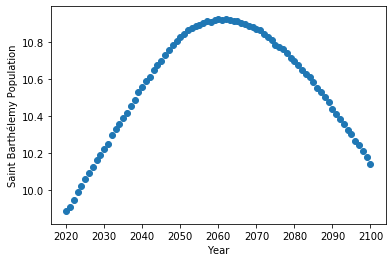

(array([[0.13512926]]), array([[0.00345603]]))


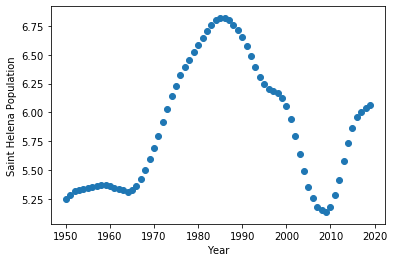

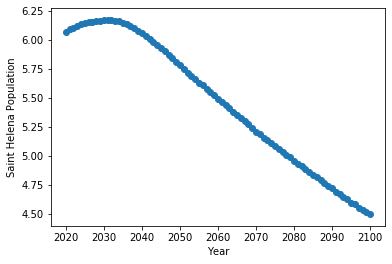

(array([[0.00565553]]), array([[-0.02367096]]))


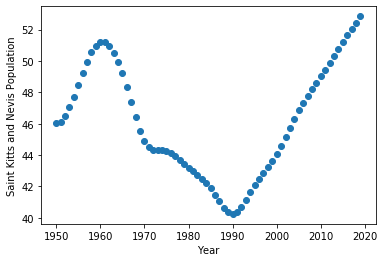

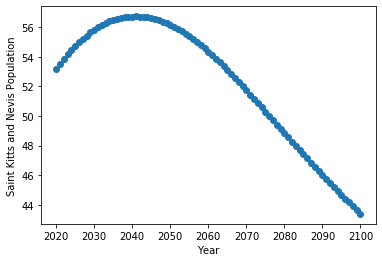

(array([[0.00420003]]), array([[-0.15973304]]))


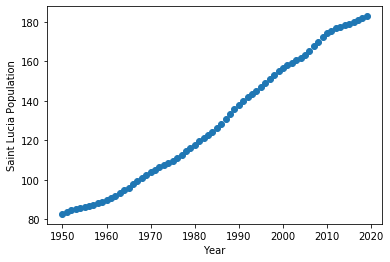

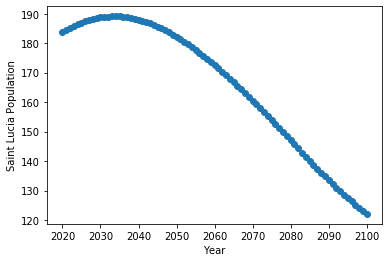

(array([[1.60443632]]), array([[-0.90056084]]))


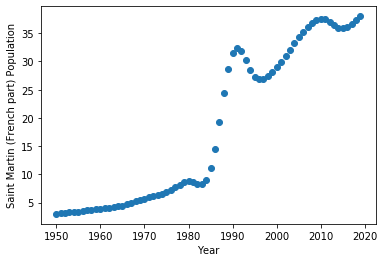

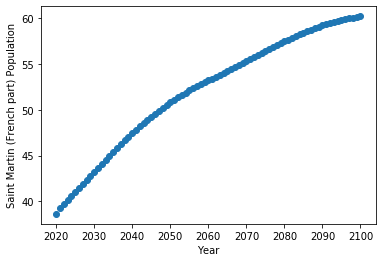

(array([[0.64040056]]), array([[0.26184826]]))


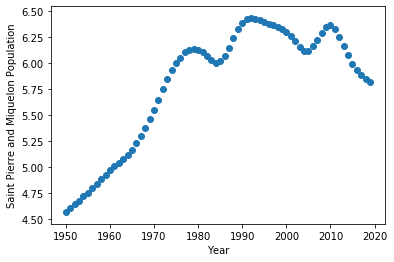

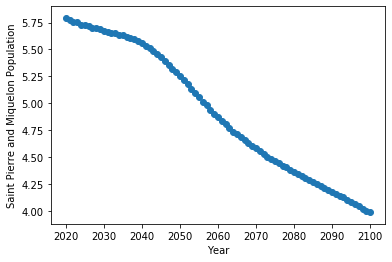

(array([[0.02312407]]), array([[-0.02547019]]))


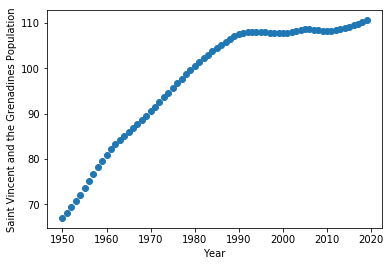

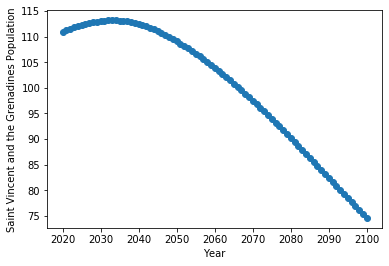

(array([[0.59700534]]), array([[-0.50502087]]))


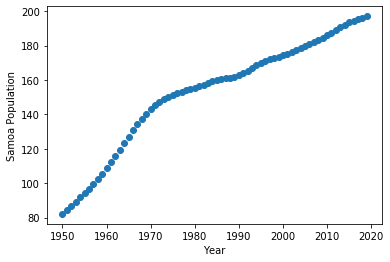

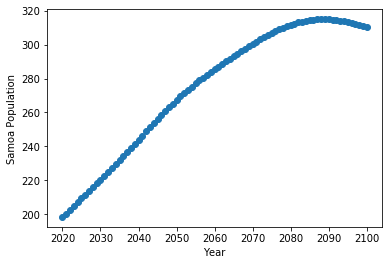

(array([[1.51876502]]), array([[1.54592123]]))


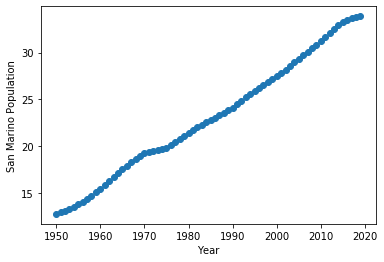

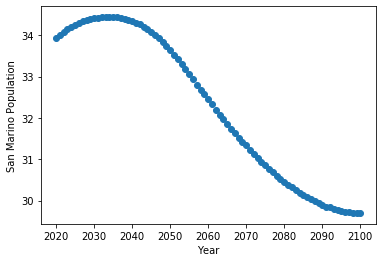

(array([[0.3096921]]), array([[-0.07418636]]))


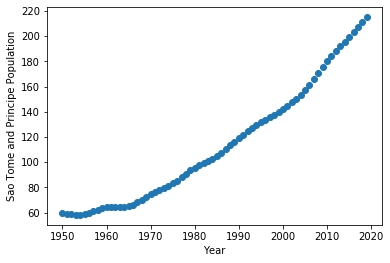

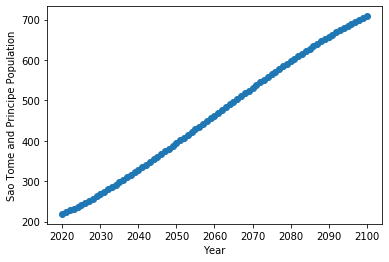

(array([[2.29006003]]), array([[6.43059799]]))


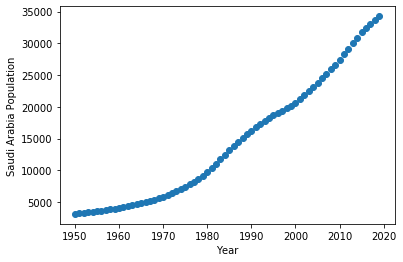

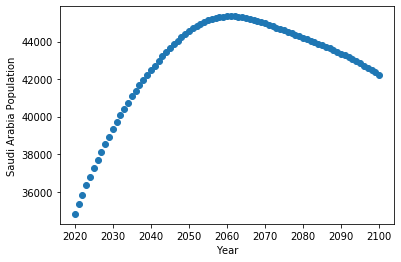

(array([[468.34684413]]), array([[68.59241423]]))


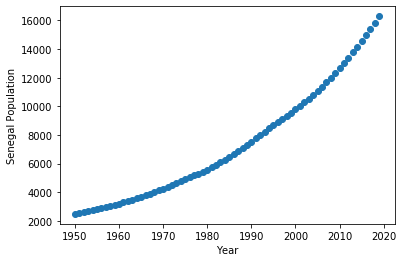

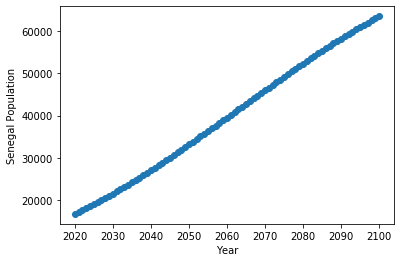

(array([[190.62435439]]), array([[608.11577952]]))


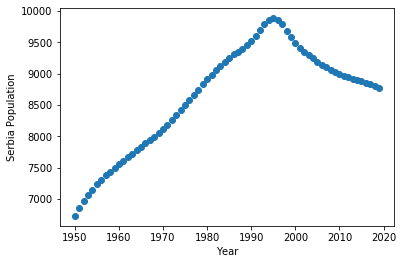

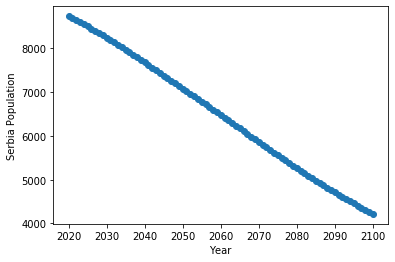

(array([[33.08533003]]), array([[-58.6072984]]))


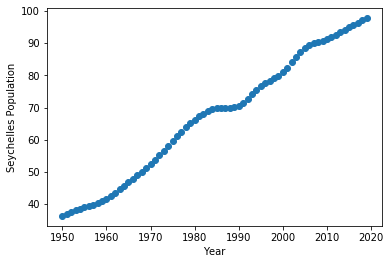

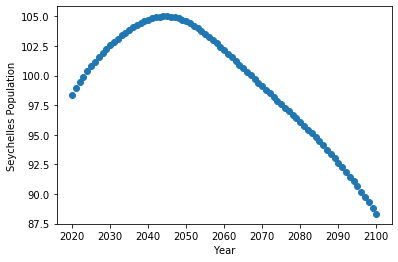

(array([[0.94888799]]), array([[-0.16697943]]))


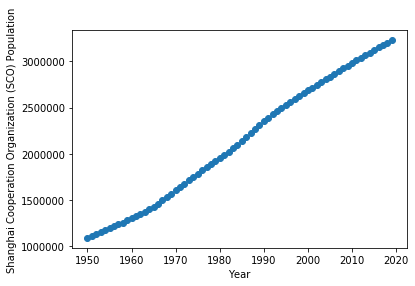

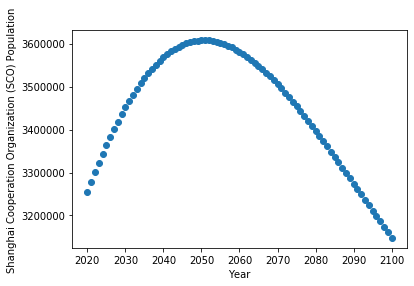

(array([[33246.45827978]]), array([[-2798.46627873]]))


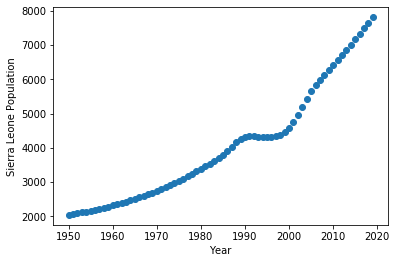

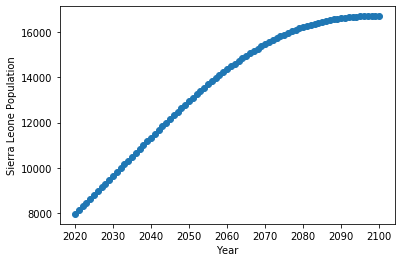

(array([[79.17170613]]), array([[115.14177676]]))


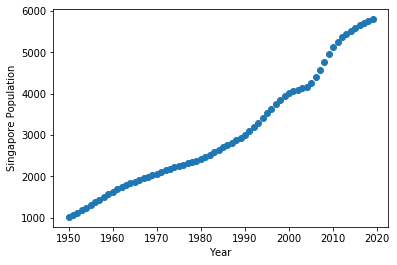

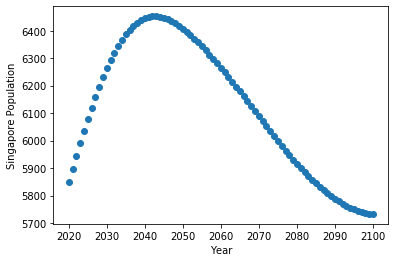

(array([[67.79778702]]), array([[-7.2364916]]))


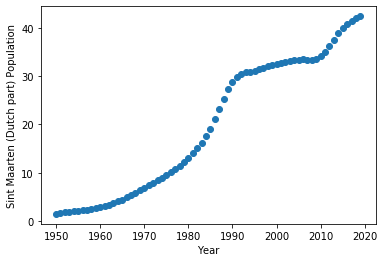

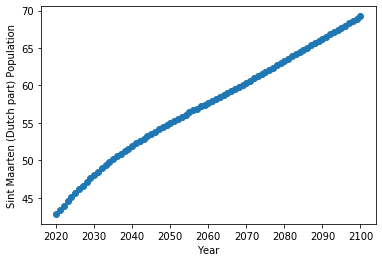

(array([[0.67527537]]), array([[0.30567326]]))


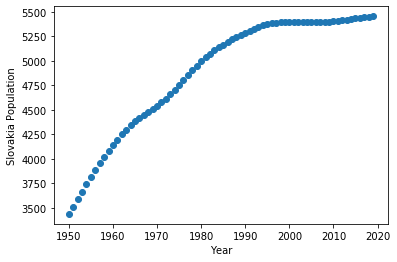

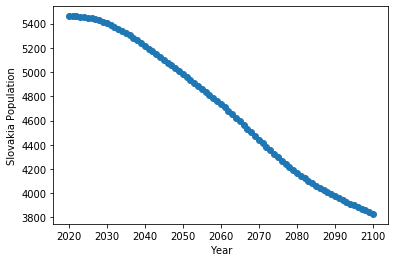

(array([[27.59130951]]), array([[-23.34494189]]))


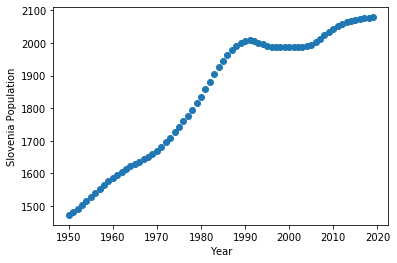

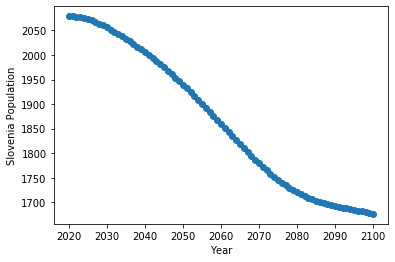

(array([[9.42175252]]), array([[-6.02666136]]))


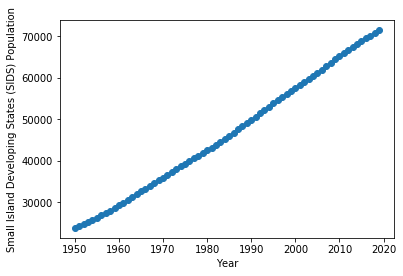

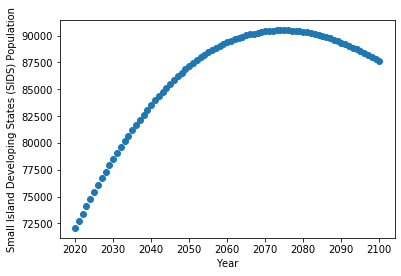

(array([[710.01631703]]), array([[182.36954878]]))


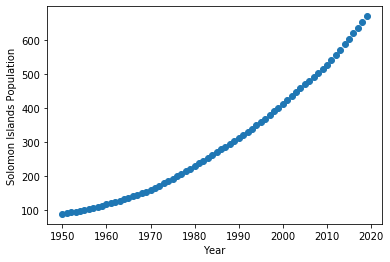

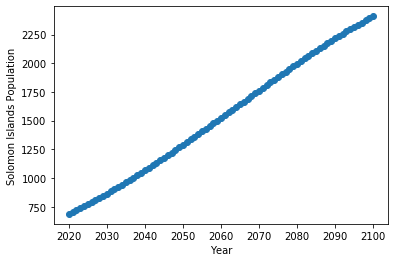

(array([[8.24659193]]), array([[22.40210863]]))


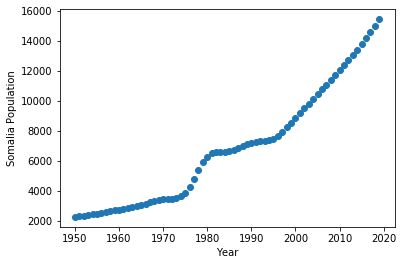

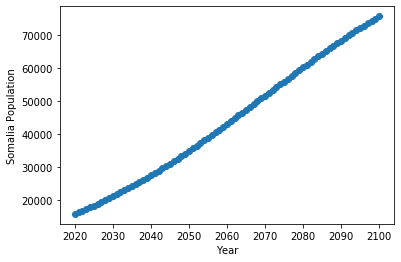

(array([[184.00505364]]), array([[782.37912552]]))


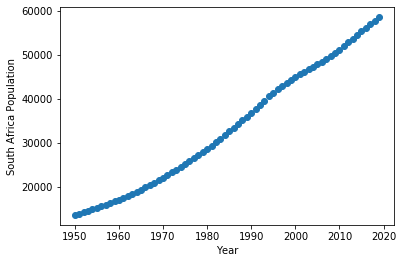

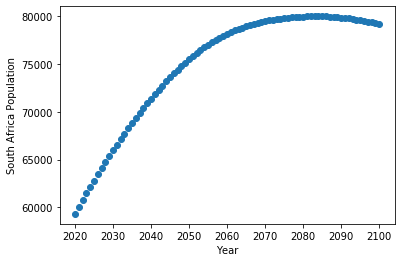

(array([[686.12088692]]), array([[232.54435065]]))


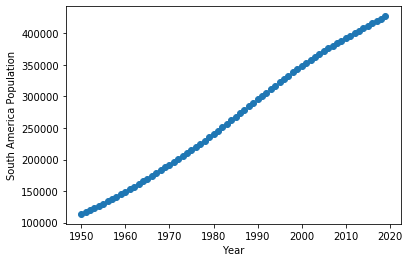

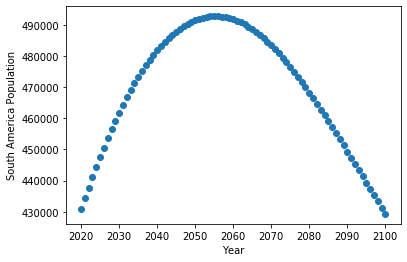

(array([[4827.38049208]]), array([[-182.51086967]]))


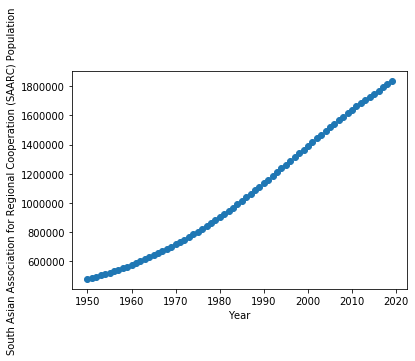

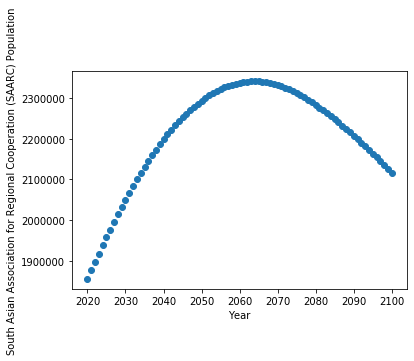

(array([[20923.25427142]]), array([[2686.33569259]]))


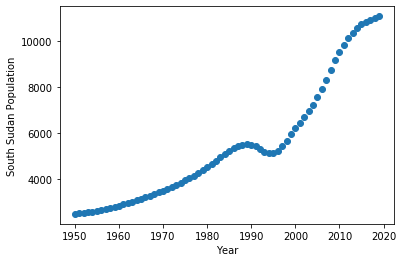

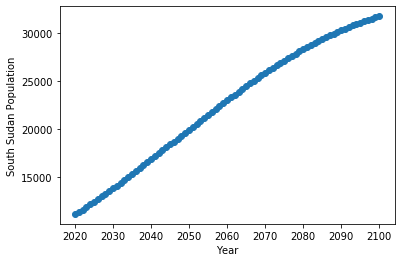

(array([[121.01709422]]), array([[272.1396435]]))


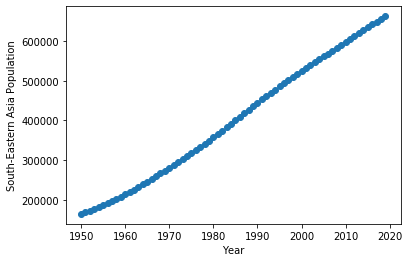

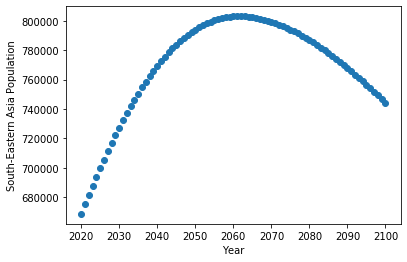

(array([[7596.00021351]]), array([[697.82486667]]))


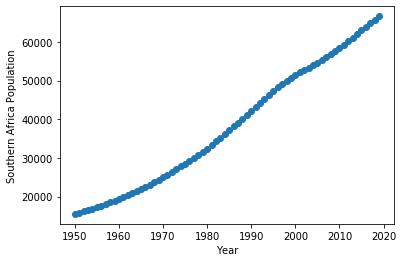

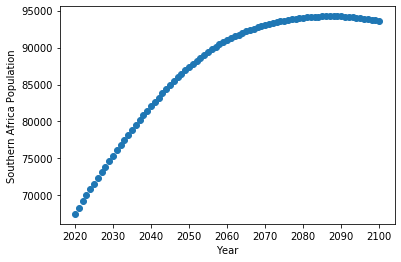

(array([[783.88714889]]), array([[313.35534415]]))


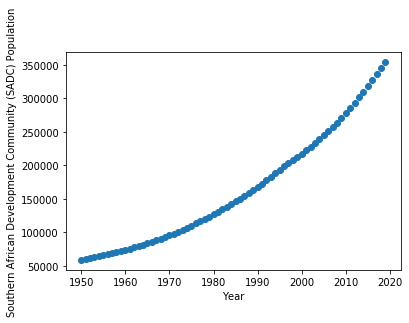

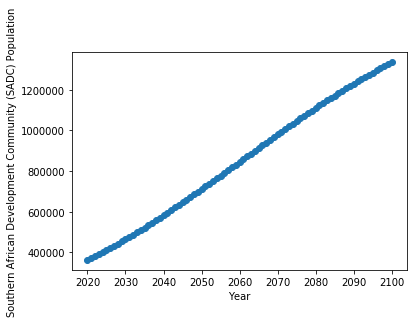

(array([[4114.13287816]]), array([[12670.28393053]]))


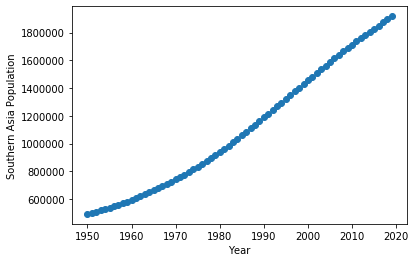

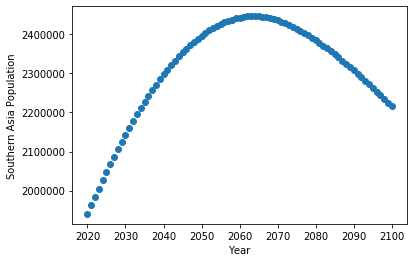

(array([[21973.27726734]]), array([[2819.34506235]]))


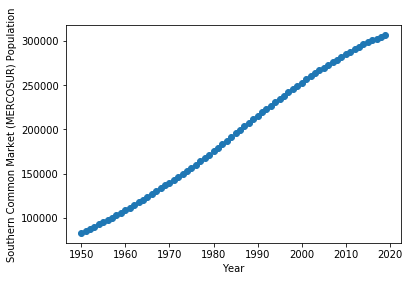

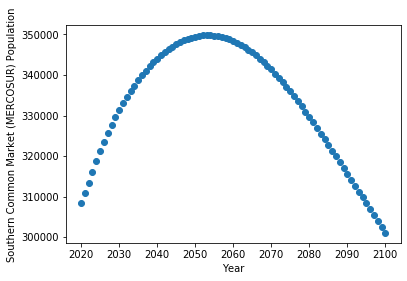

(array([[3472.85151834]]), array([[-234.34605946]]))


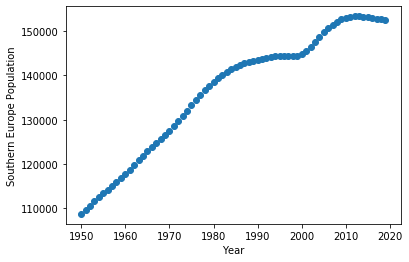

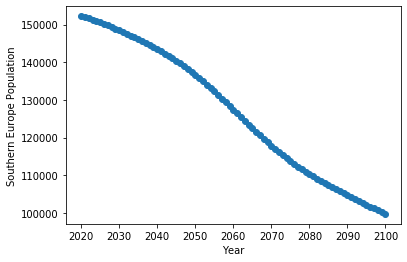

(array([[661.46882824]]), array([[-733.83466344]]))


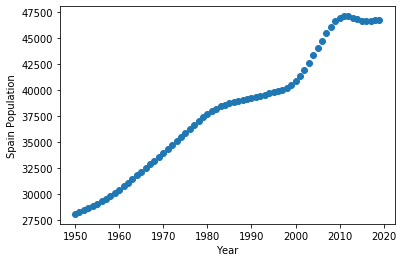

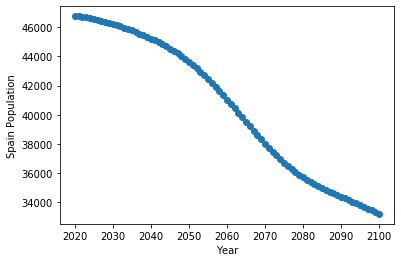

(array([[288.89607221]]), array([[-199.59430709]]))


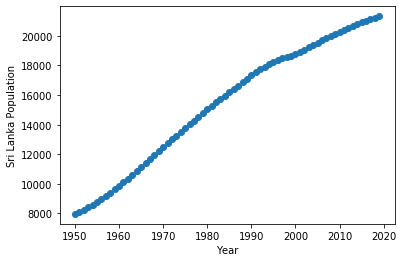

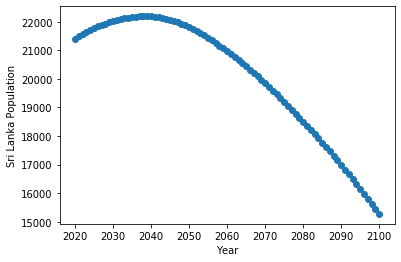

(array([[205.53459151]]), array([[-83.85895542]]))


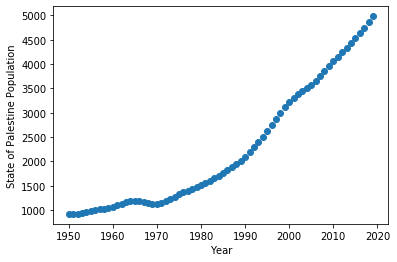

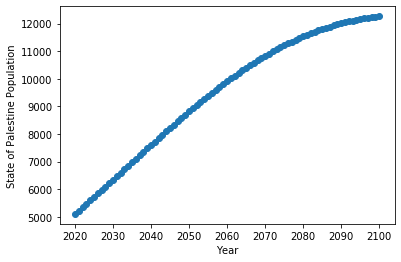

(array([[59.5728053]]), array([[93.99438923]]))


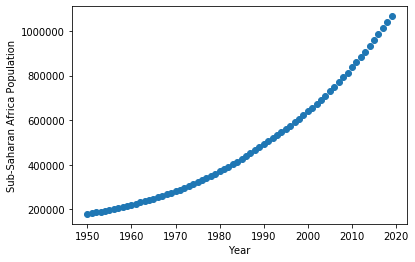

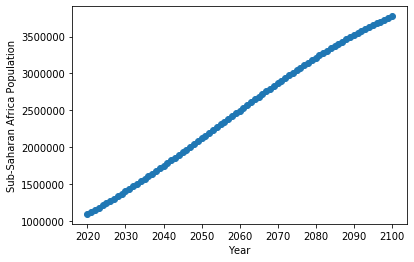

(array([[12320.70522995]]), array([[35114.7610652]]))


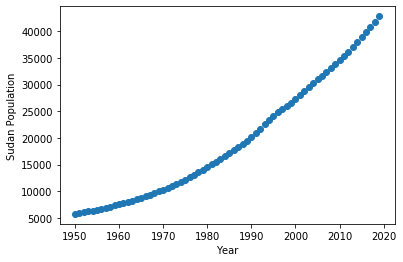

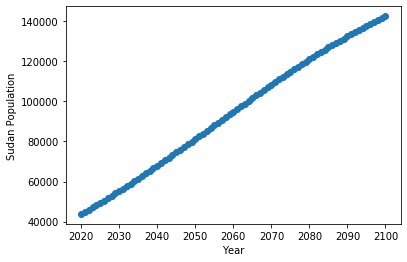

(array([[540.6493558]]), array([[1278.66841949]]))


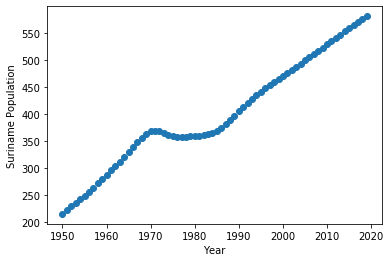

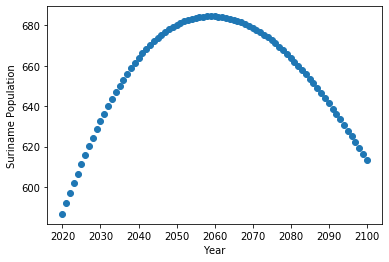

(array([[4.81322866]]), array([[0.16924467]]))


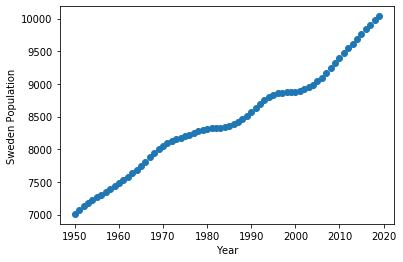

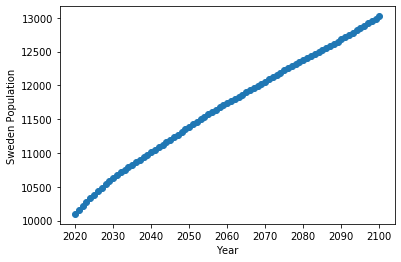

(array([[38.29543057]]), array([[34.8594273]]))


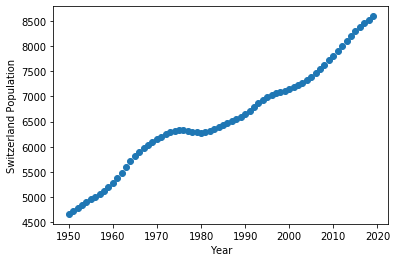

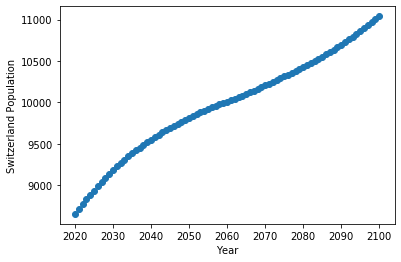

(array([[49.69271768]]), array([[25.79254749]]))


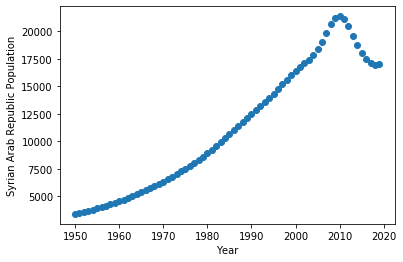

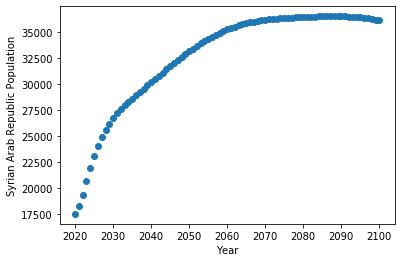

(array([[275.68951744]]), array([[183.05931111]]))


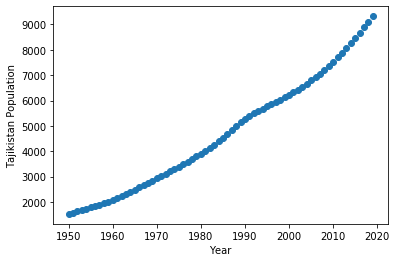

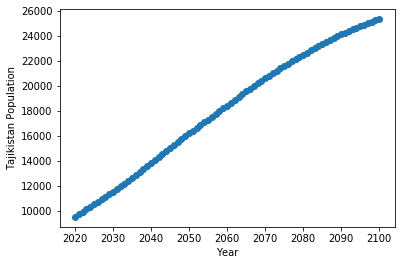

(array([[110.06358131]]), array([[207.29371217]]))


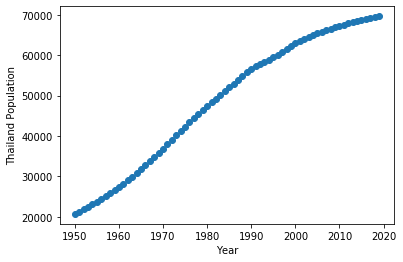

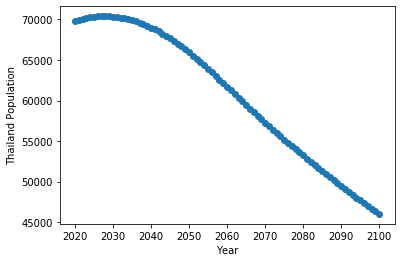

(array([[783.69226239]]), array([[-344.97469108]]))


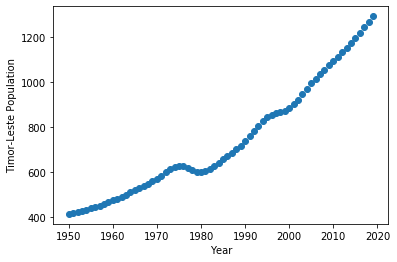

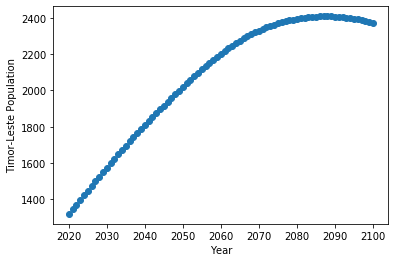

(array([[12.14482194]]), array([[13.89644002]]))


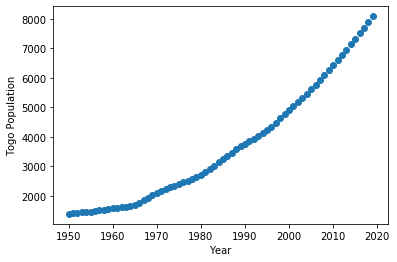

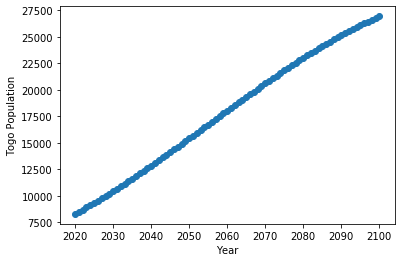

(array([[95.62352496]]), array([[244.05727832]]))


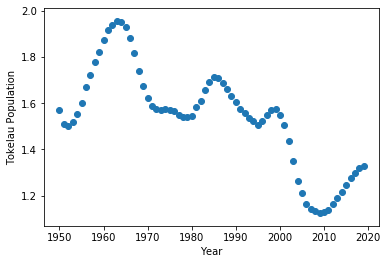

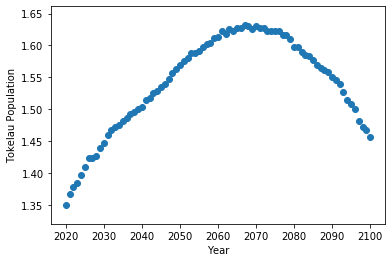

(array([[-0.0082773]]), array([[0.00172191]]))


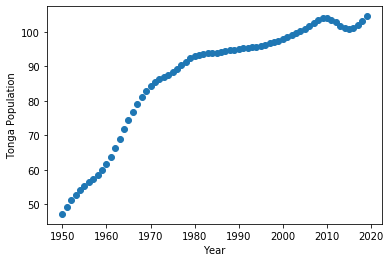

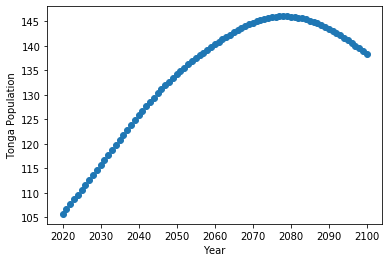

(array([[0.74752986]]), array([[0.45688866]]))


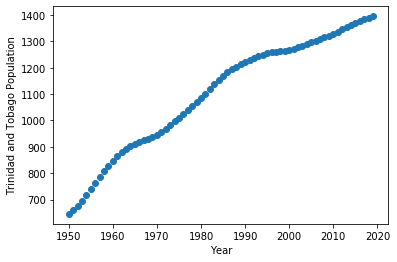

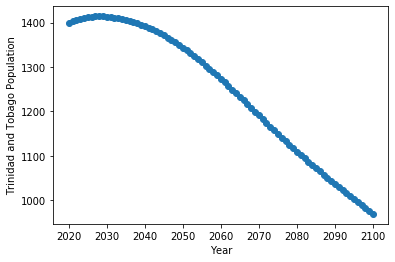

(array([[10.45781031]]), array([[-6.21419578]]))


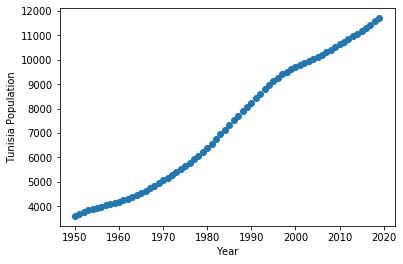

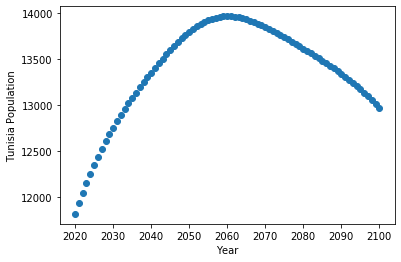

(array([[129.17242518]]), array([[10.1964252]]))


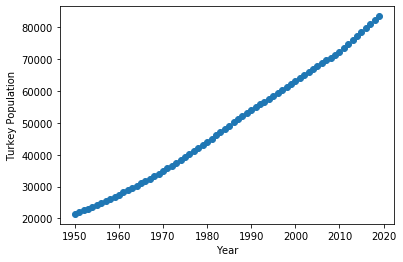

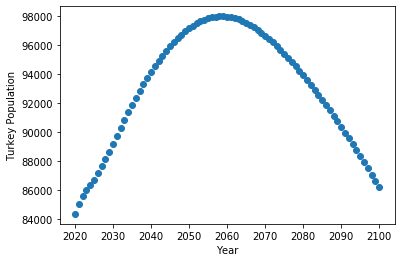

(array([[907.61136165]]), array([[13.39947317]]))


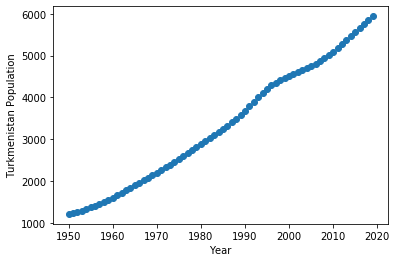

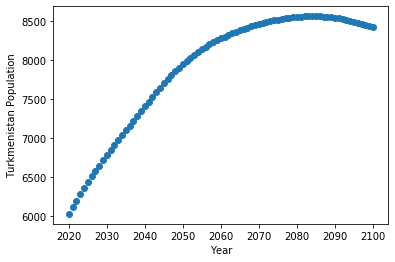

(array([[70.84831308]]), array([[29.11840967]]))


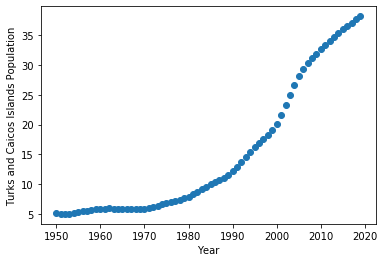

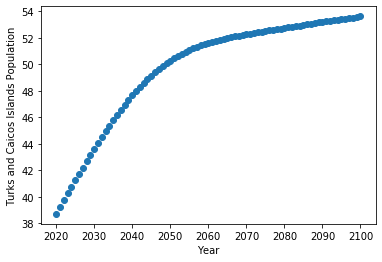

(array([[0.50600541]]), array([[0.15950298]]))


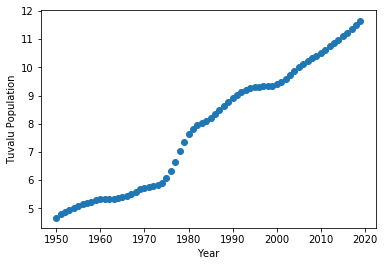

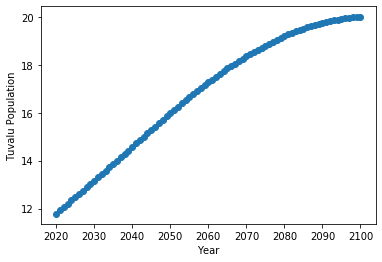

(array([[0.10711796]]), array([[0.10897051]]))


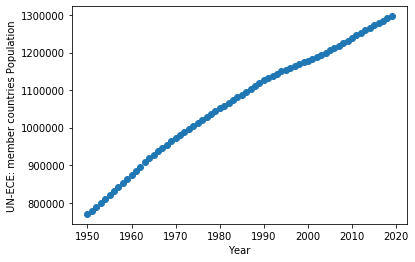

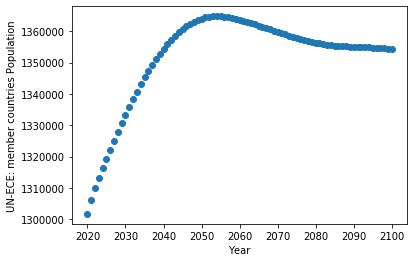

(array([[7398.2176165]]), array([[367.61754731]]))


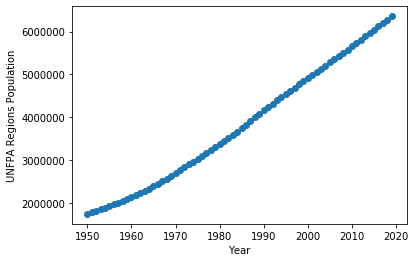

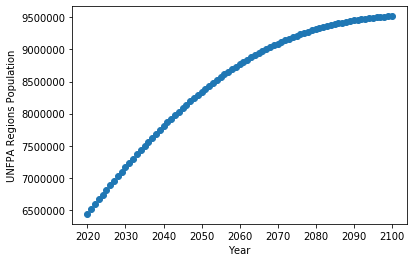

(array([[69739.63560243]]), array([[38180.87502247]]))


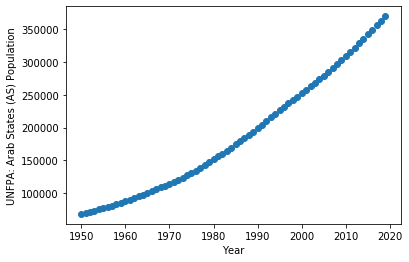

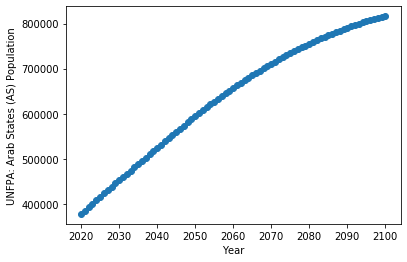

(array([[4423.75176926]]), array([[5630.8142372]]))


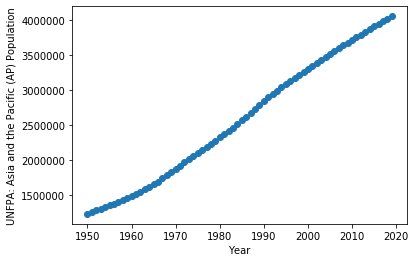

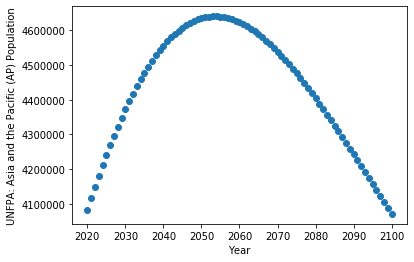

(array([[43873.16057794]]), array([[-1950.89407317]]))


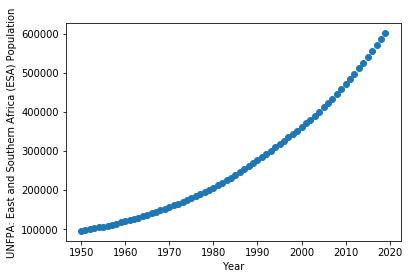

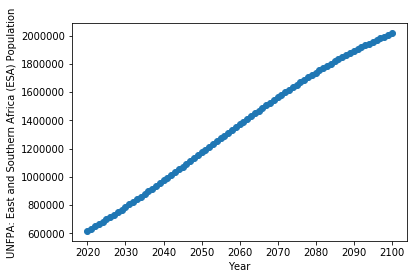

(array([[7031.80997797]]), array([[18296.82693196]]))


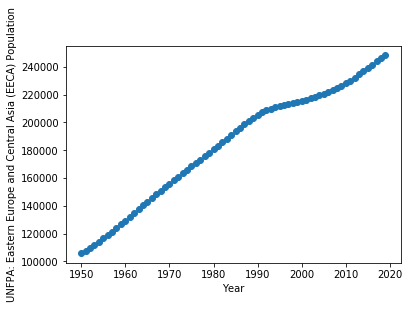

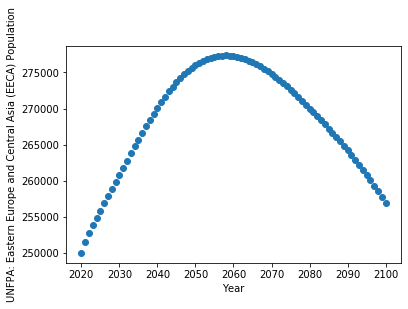

(array([[2032.72569961]]), array([[48.372082]]))


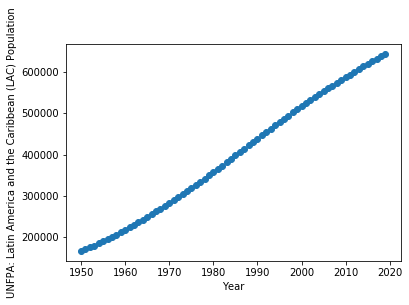

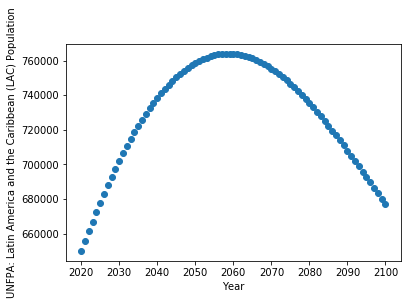

(array([[7302.60743382]]), array([[129.95569808]]))


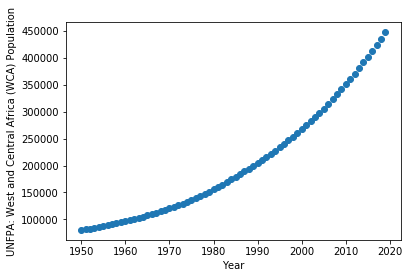

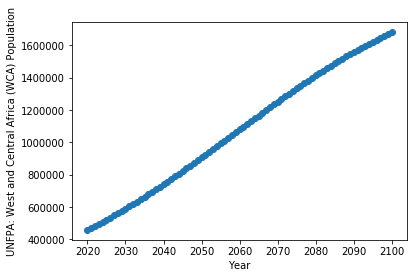

(array([[5075.58014384]]), array([[16025.80014641]]))


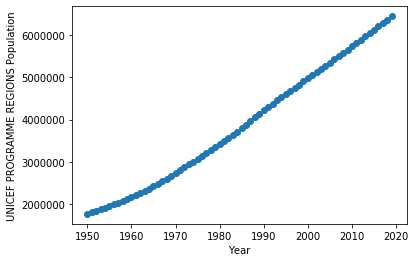

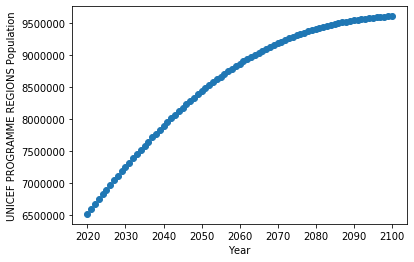

(array([[70480.37139542]]), array([[38159.23195199]]))


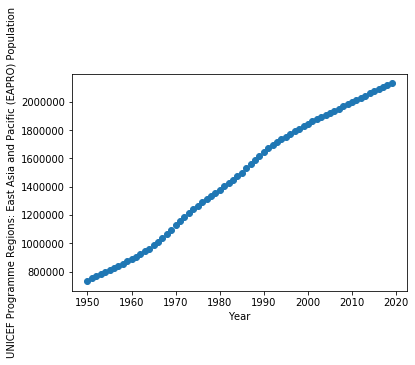

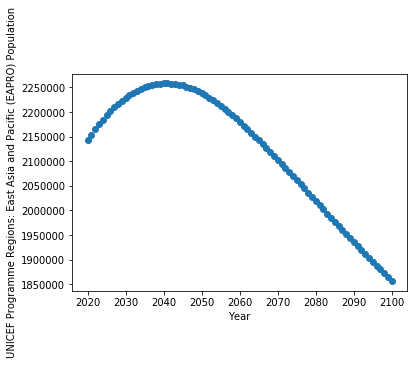

(array([[21899.88331059]]), array([[-4770.23913552]]))


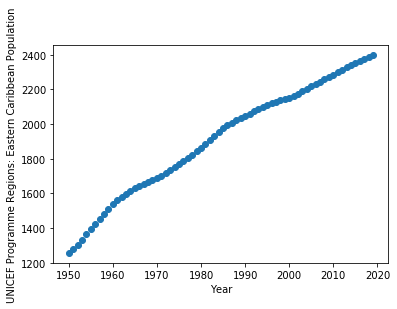

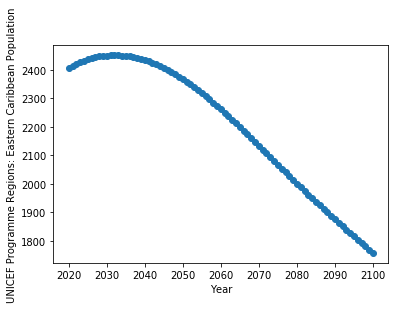

(array([[15.81317914]]), array([[-9.45548921]]))


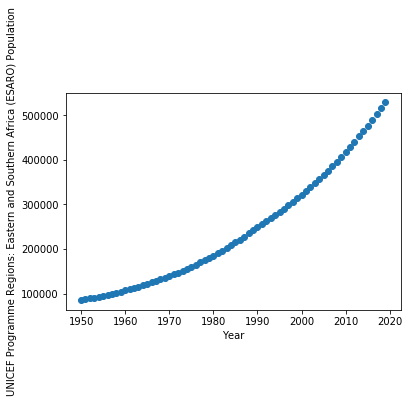

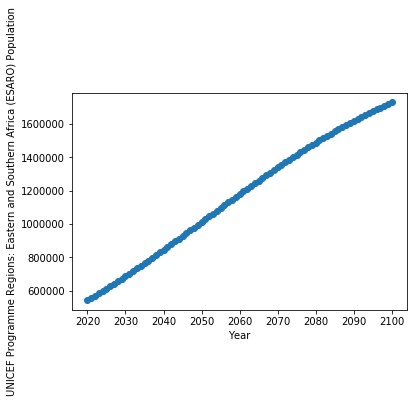

(array([[6211.21020091]]), array([[15470.78474447]]))


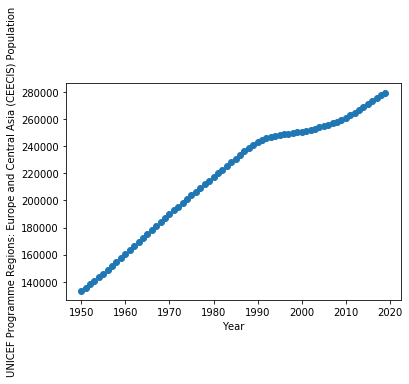

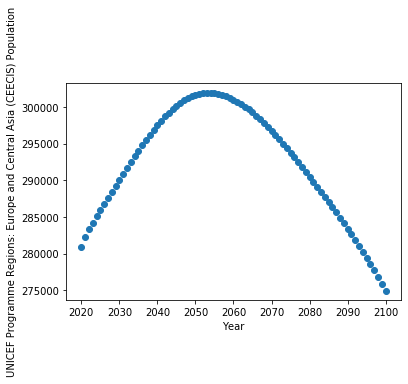

(array([[2079.30955141]]), array([[-118.00200332]]))


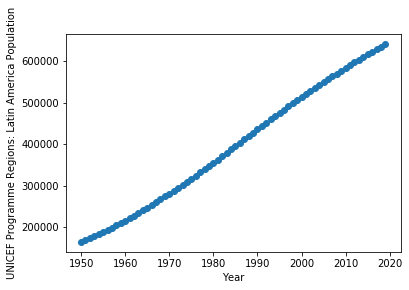

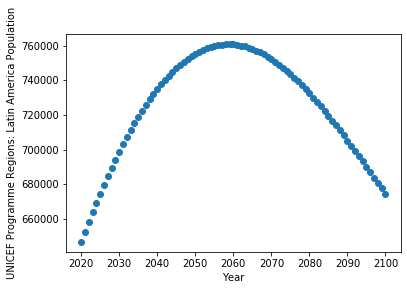

(array([[7278.64462535]]), array([[138.37747428]]))


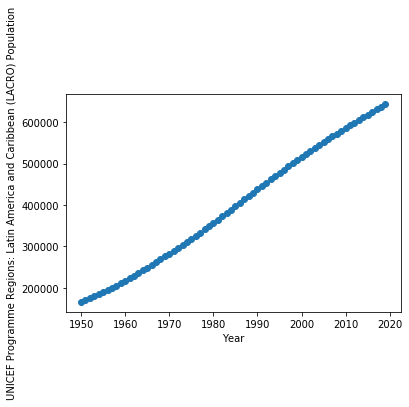

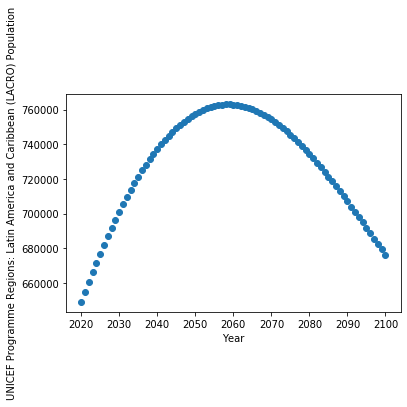

(array([[7294.4578045]]), array([[128.92198507]]))


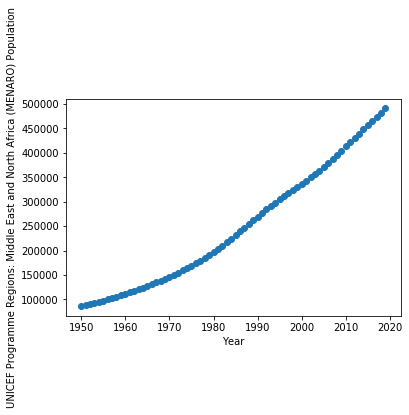

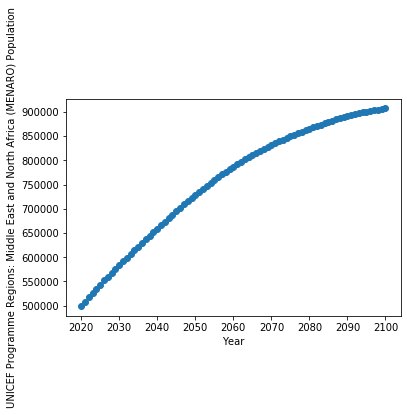

(array([[6003.73431289]]), array([[5120.98144045]]))


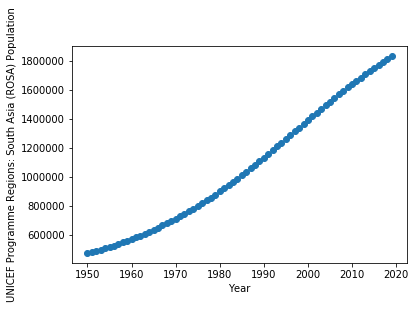

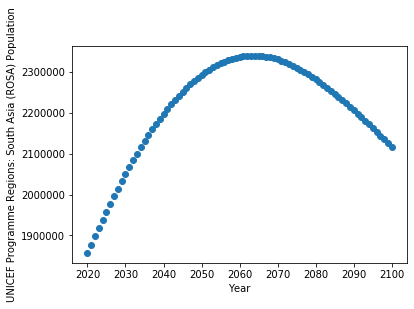

(array([[20923.25427142]]), array([[2686.33569259]]))


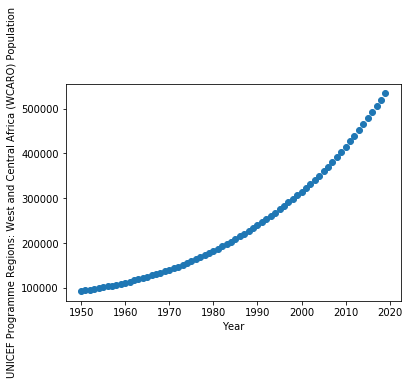

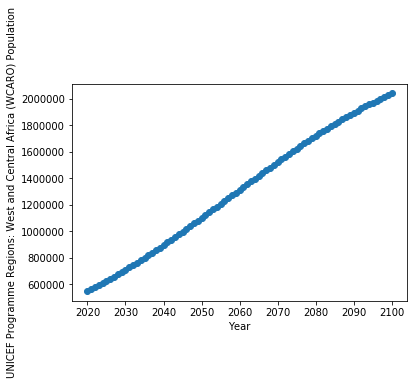

(array([[6068.5219437]]), array([[19640.44922825]]))


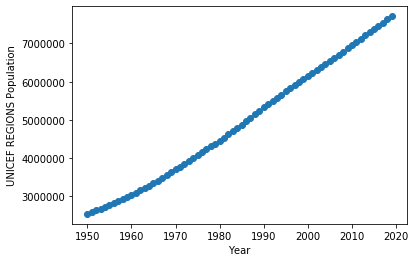

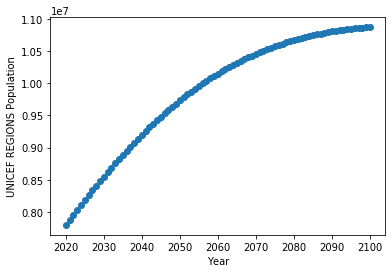

(array([[77750.27021165]]), array([[37728.24546642]]))


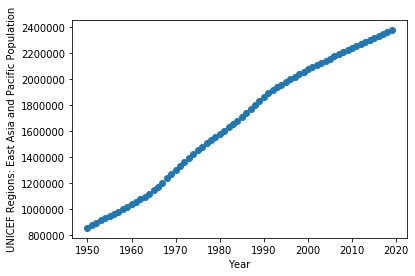

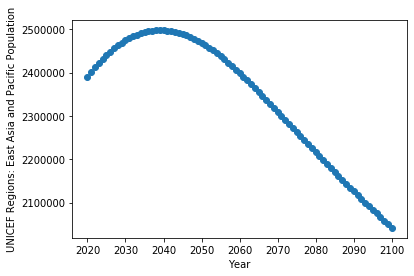

(array([[23771.64618191]]), array([[-5679.10624632]]))


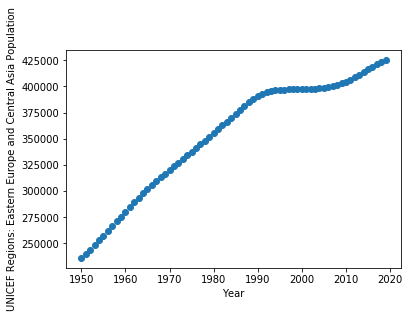

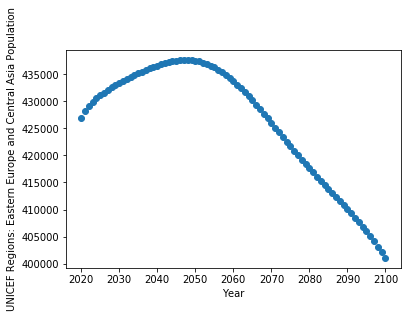

(array([[2634.49514308]]), array([[-393.10941942]]))


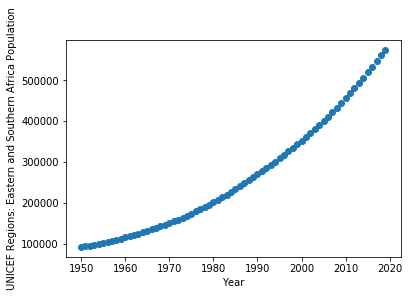

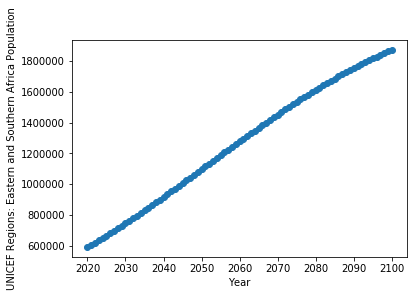

(array([[6792.82698653]]), array([[16753.00392739]]))


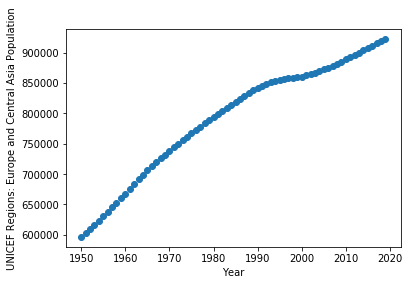

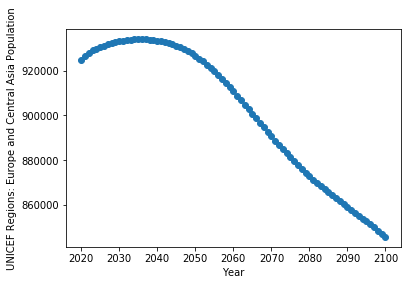

(array([[4521.64037155]]), array([[-1236.6806117]]))


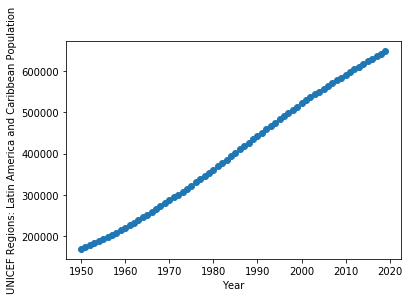

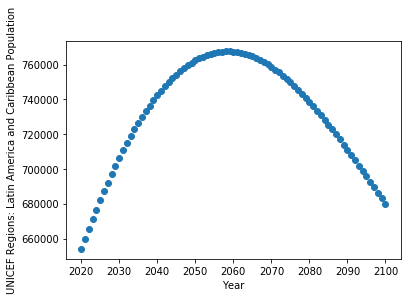

(array([[7336.34347765]]), array([[111.86206152]]))


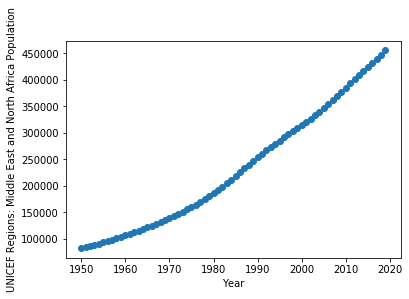

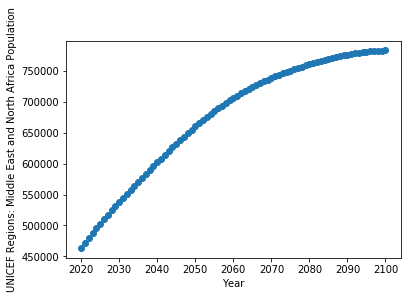

(array([[5560.04501454]]), array([[3969.94940985]]))


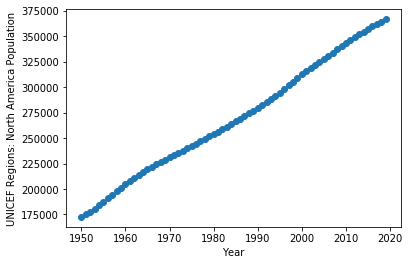

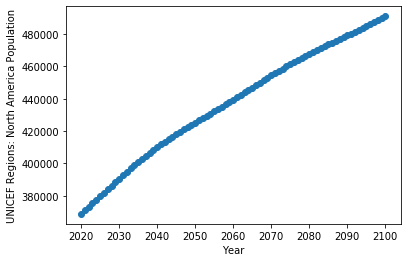

(array([[2775.98630883]]), array([[1482.45567579]]))


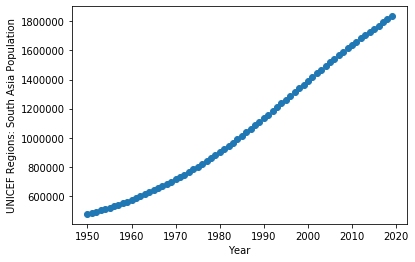

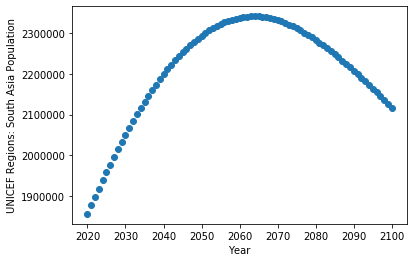

(array([[20923.25427142]]), array([[2686.33569259]]))


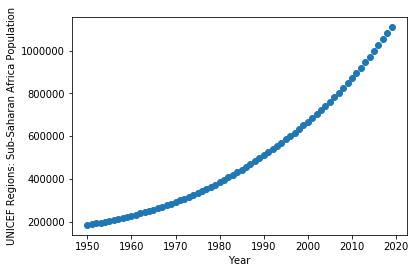

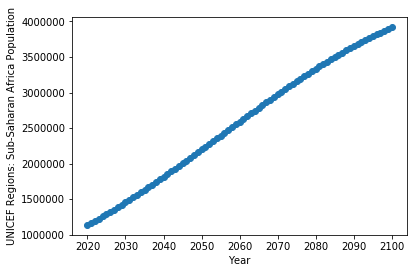

(array([[12861.35458576]]), array([[36393.42948469]]))


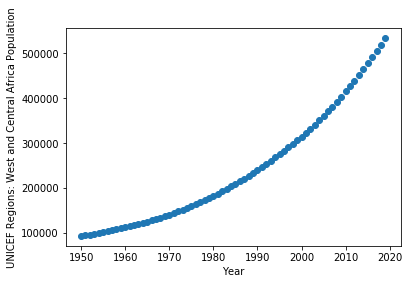

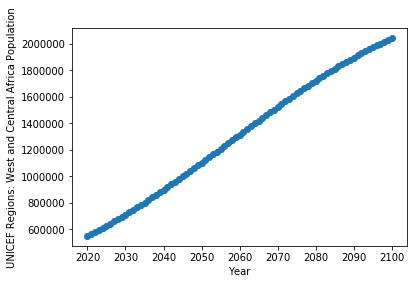

(array([[6068.52759923]]), array([[19640.42555729]]))


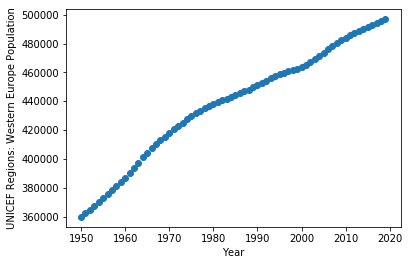

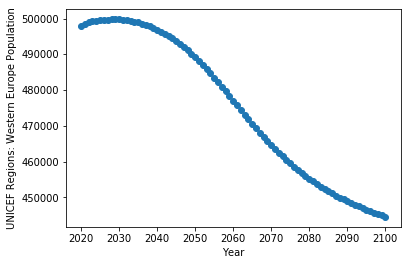

(array([[1887.14522847]]), array([[-843.57119228]]))


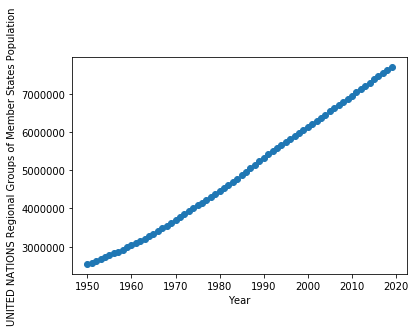

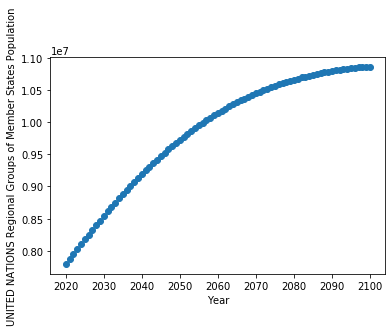

(array([[77682.14413175]]), array([[37619.14855407]]))


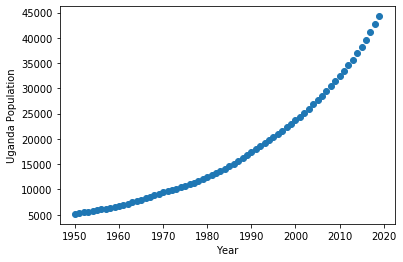

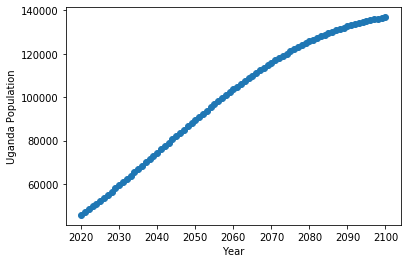

(array([[517.61380849]]), array([[1210.13898123]]))


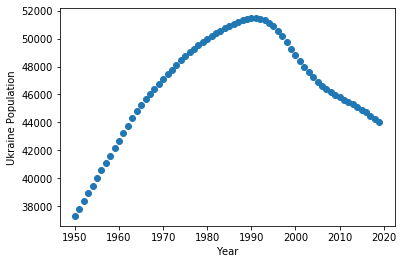

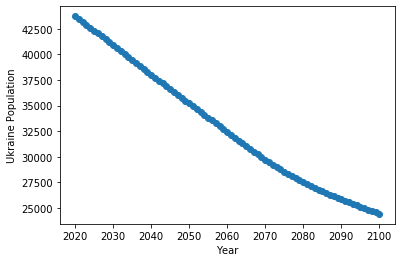

(array([[80.97267924]]), array([[-250.98152301]]))


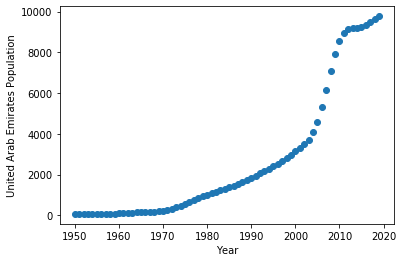

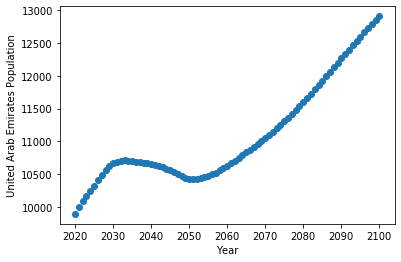

(array([[138.59693126]]), array([[29.97394553]]))


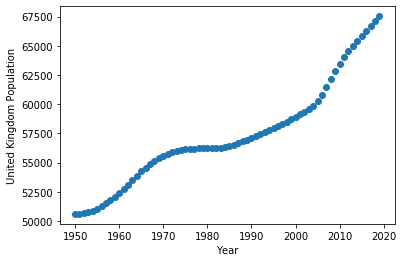

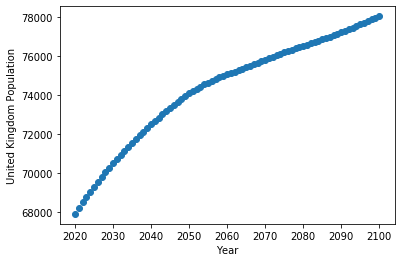

(array([[208.65973364]]), array([[113.53396953]]))


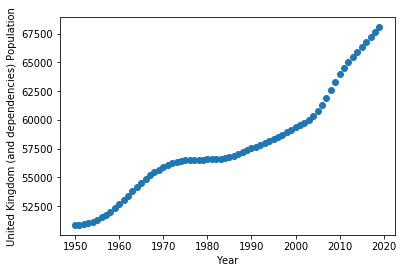

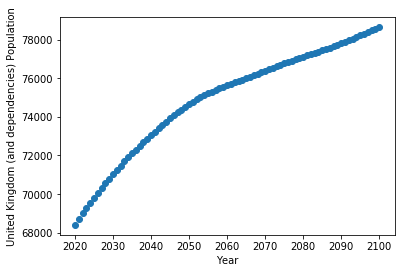

(array([[212.62103046]]), array([[114.14765831]]))


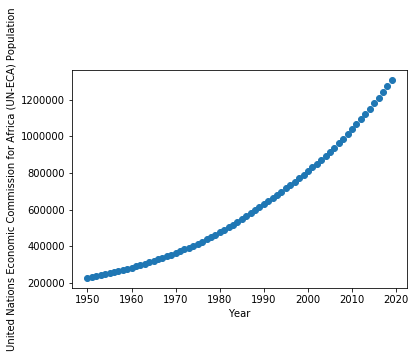

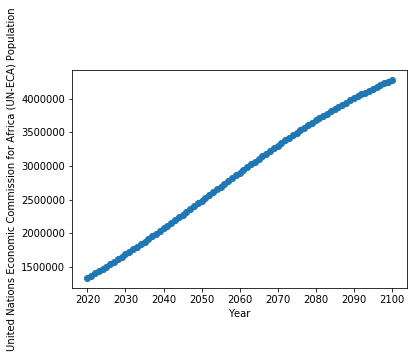

(array([[15120.61682799]]), array([[38425.31205881]]))


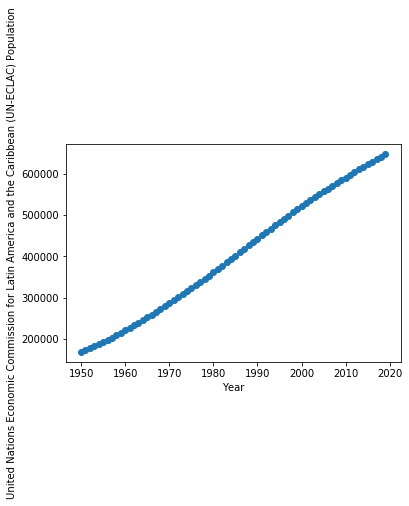

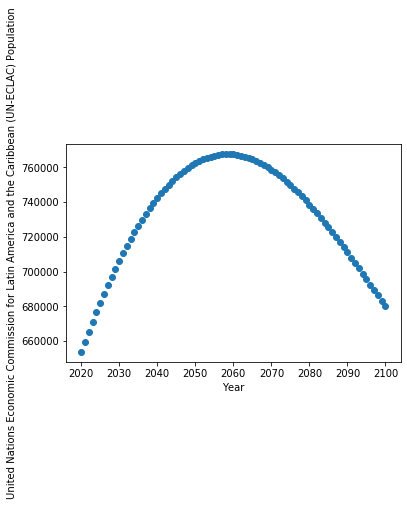

(array([[7336.3274239]]), array([[111.87253168]]))


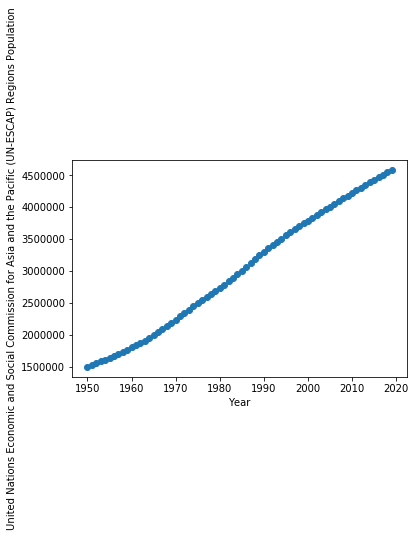

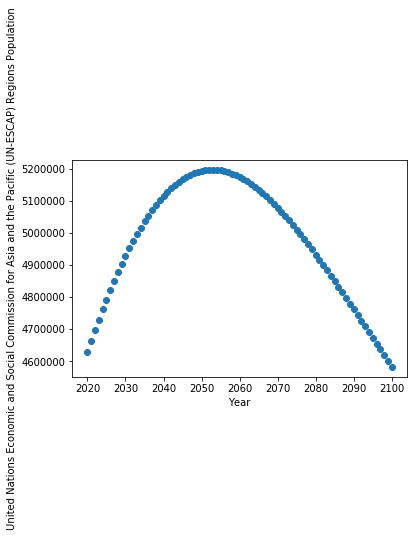

(array([[47876.25167676]]), array([[-2549.0458185]]))


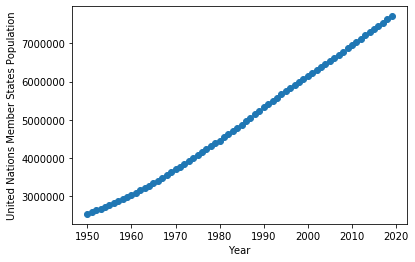

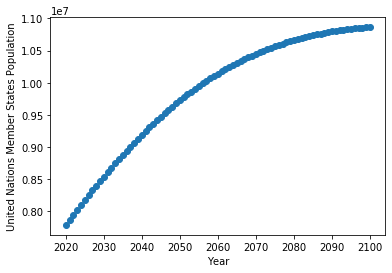

(array([[77682.143199]]), array([[37624.53316294]]))


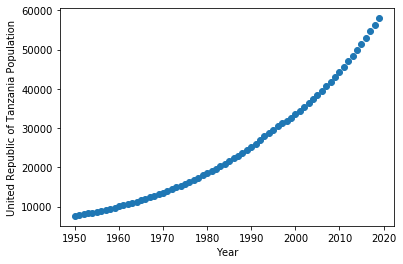

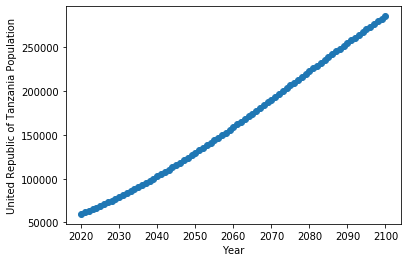

(array([[691.03856744]]), array([[2917.24451771]]))


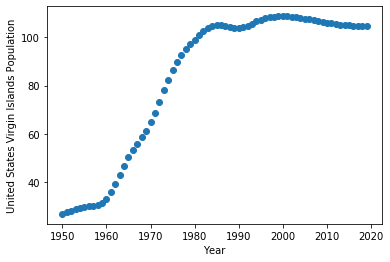

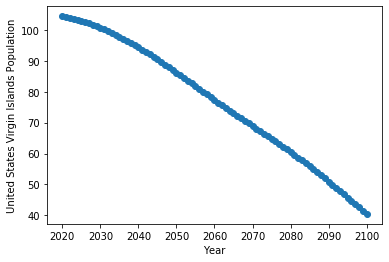

(array([[1.32465233]]), array([[-0.82591994]]))


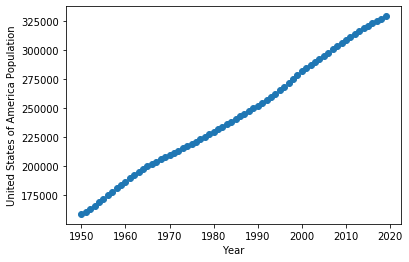

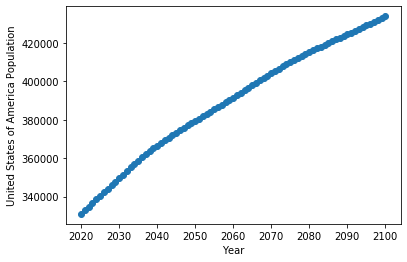

(array([[2445.23619769]]), array([[1252.63224654]]))


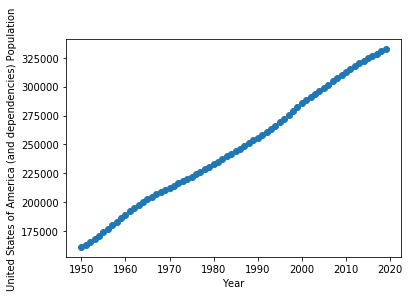

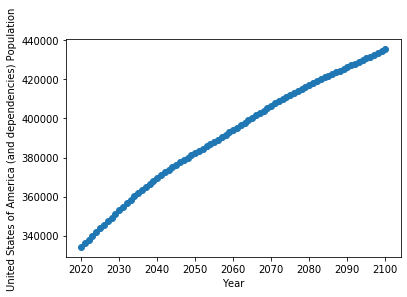

(array([[2472.85124806]]), array([[1228.2499402]]))


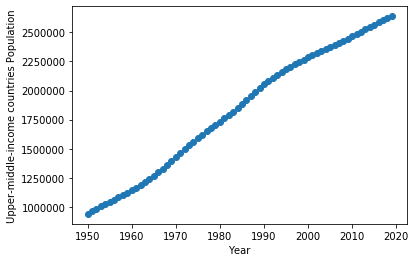

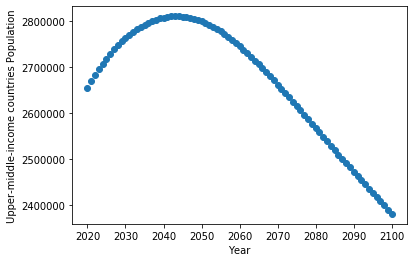

(array([[26314.26325543]]), array([[-4718.36587904]]))


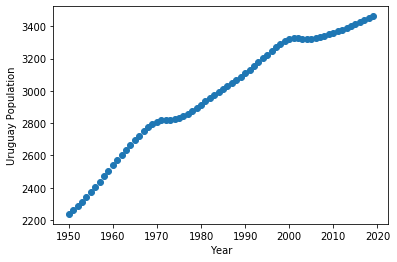

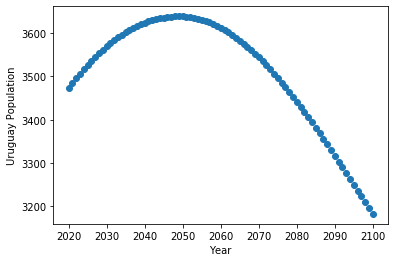

(array([[17.19756189]]), array([[-4.13665876]]))


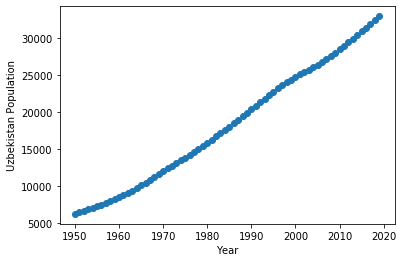

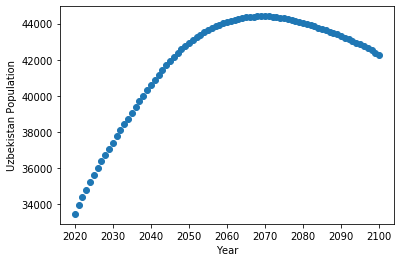

(array([[399.36515657]]), array([[98.24010863]]))


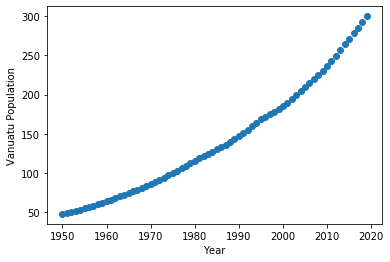

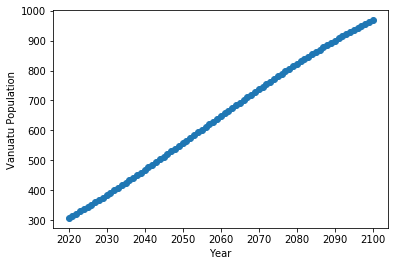

(array([[3.482117]]), array([[8.57155072]]))


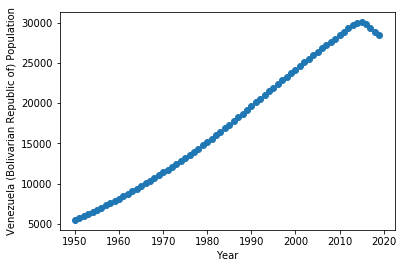

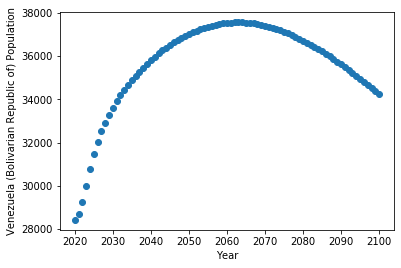

(array([[391.3716289]]), array([[43.43360165]]))


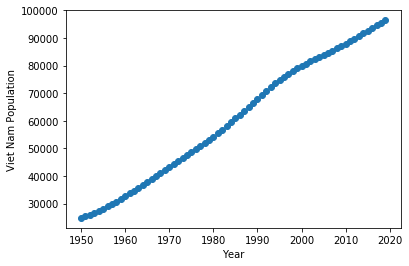

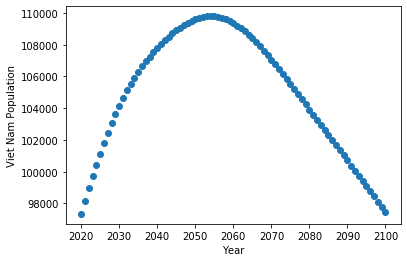

(array([[1107.97871908]]), array([[-49.70093293]]))


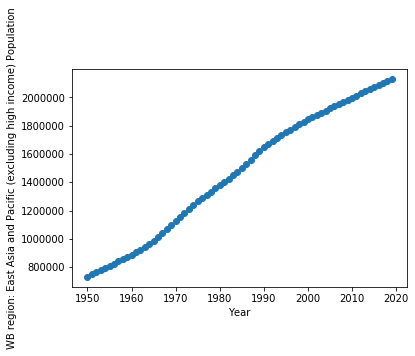

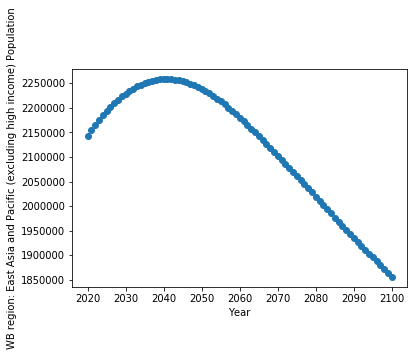

(array([[21900.48711514]]), array([[-4770.35553579]]))


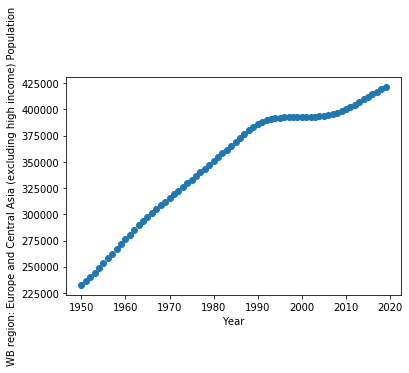

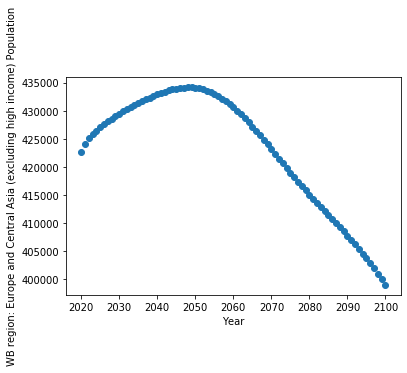

(array([[2631.05009745]]), array([[-368.08757369]]))


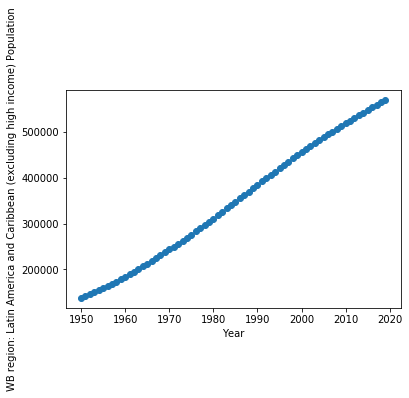

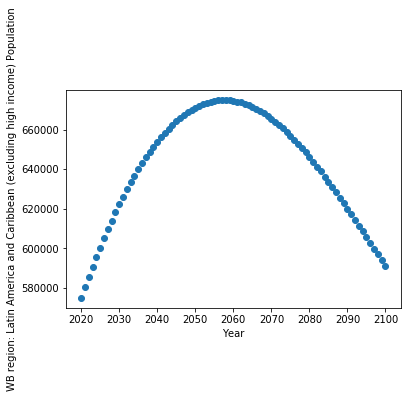

(array([[6624.73761905]]), array([[-2.79880964]]))


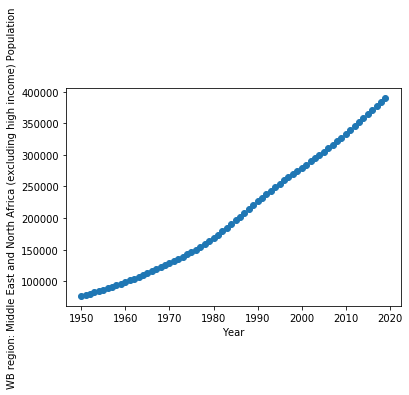

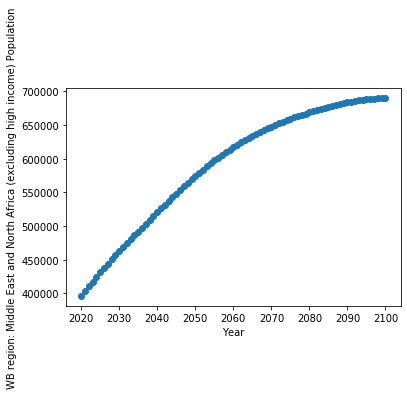

(array([[4692.58195752]]), array([[3677.37219415]]))


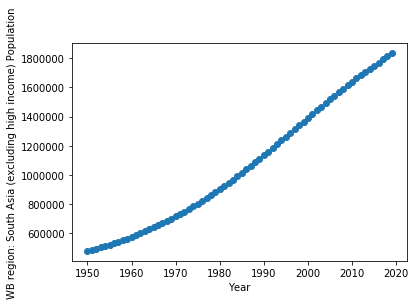

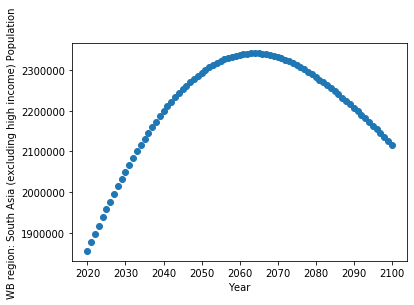

(array([[20923.25427142]]), array([[2686.33569259]]))


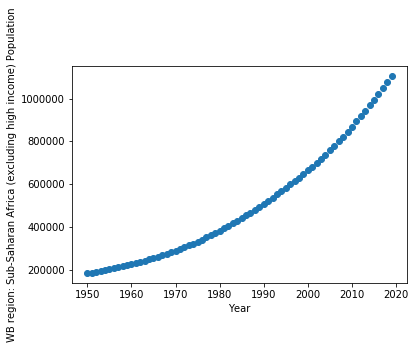

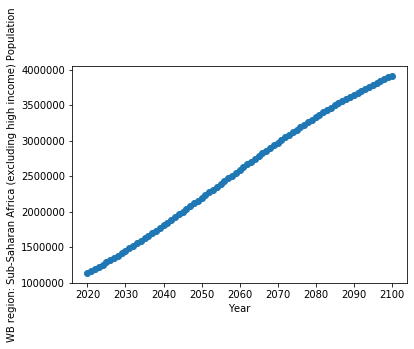

(array([[12832.04453126]]), array([[36383.67462337]]))


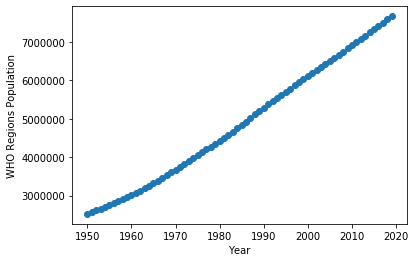

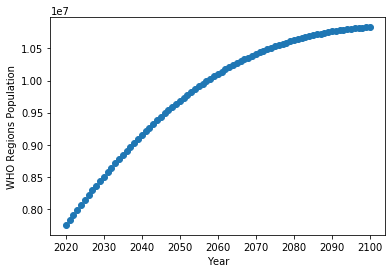

(array([[77285.75110594]]), array([[37753.16877547]]))


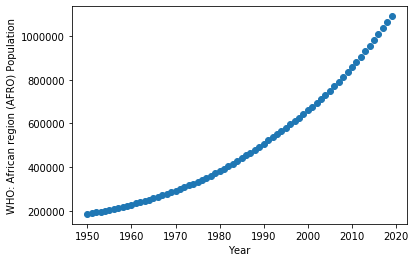

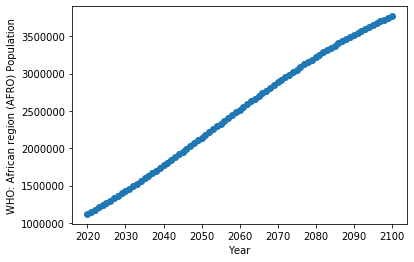

(array([[12615.48380766]]), array([[34655.38136353]]))


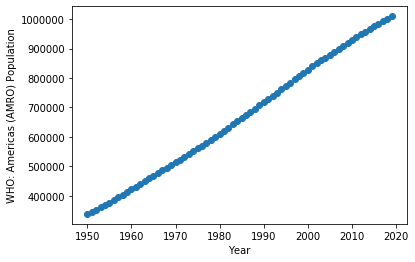

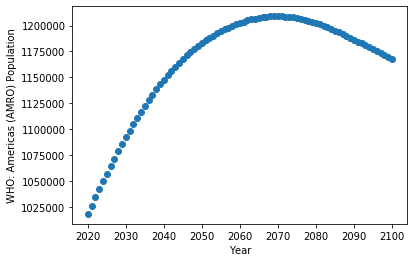

(array([[10073.35023363]]), array([[1612.60699625]]))


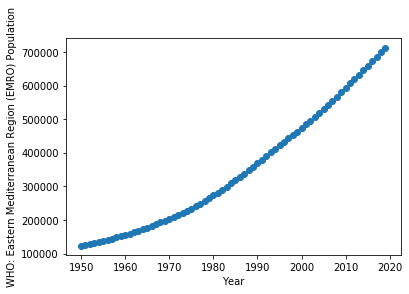

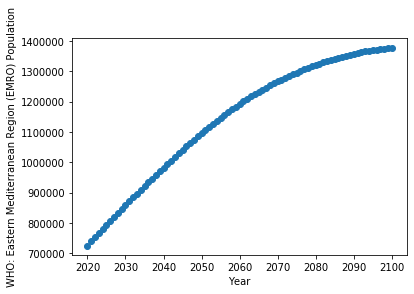

(array([[8675.81369688]]), array([[8302.420303]]))


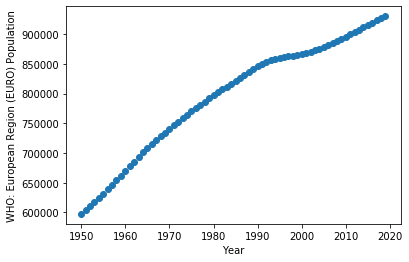

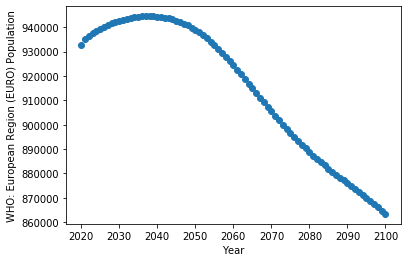

(array([[4622.76530143]]), array([[-1115.50714555]]))


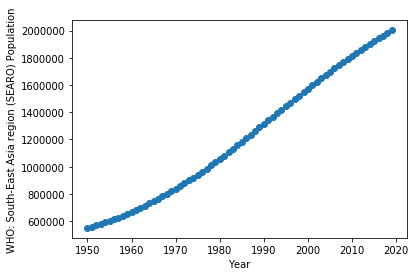

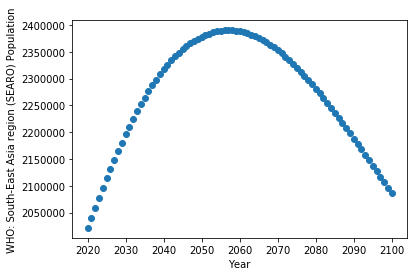

(array([[22552.66678329]]), array([[-30.78231994]]))


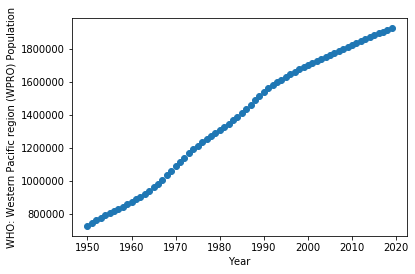

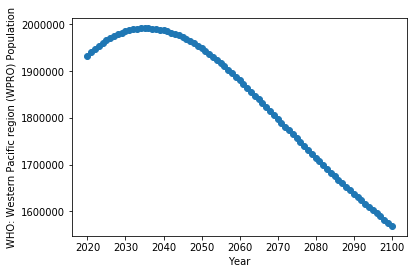

(array([[18745.67128305]]), array([[-5670.95042182]]))


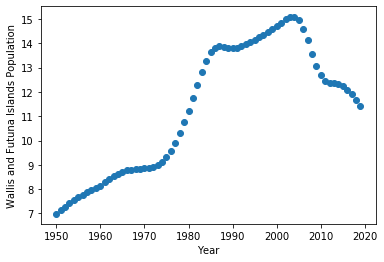

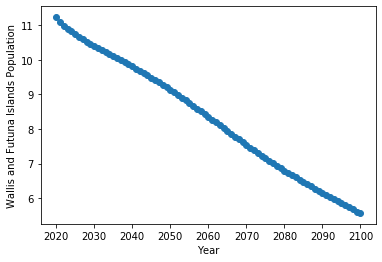

(array([[0.10722903]]), array([[-0.0717086]]))


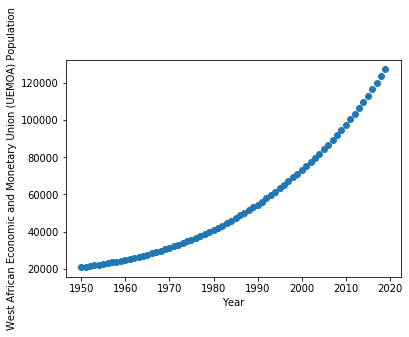

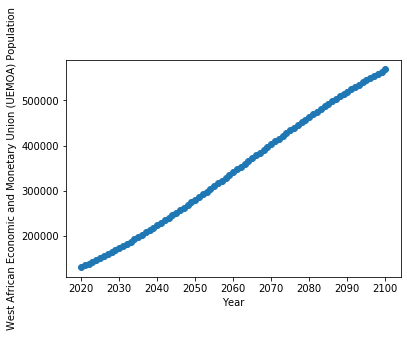

(array([[1455.18246027]]), array([[5739.16724221]]))


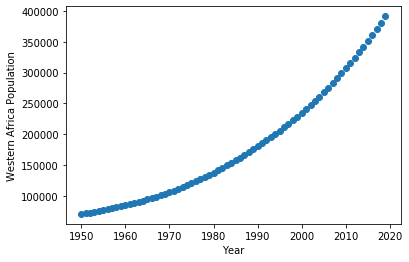

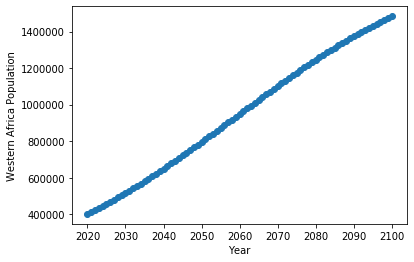

(array([[4437.17774452]]), array([[14212.80306658]]))


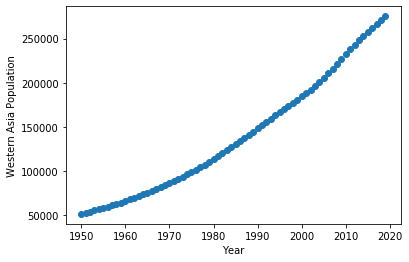

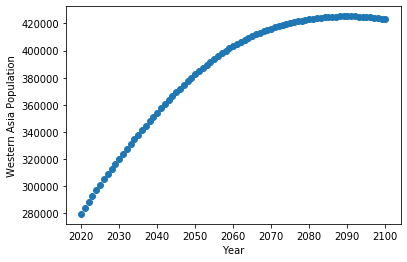

(array([[3275.44455664]]), array([[1753.26474752]]))


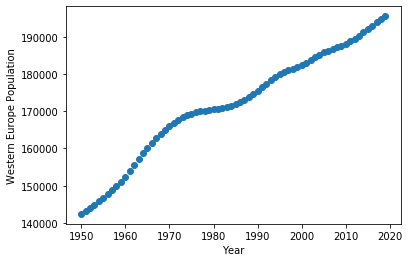

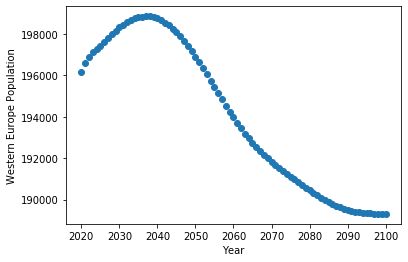

(array([[710.17757085]]), array([[-144.06804309]]))


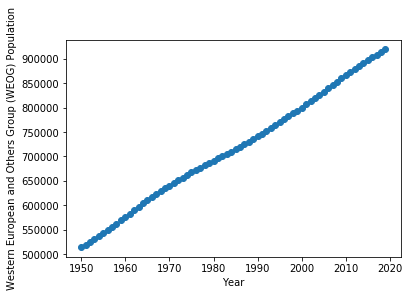

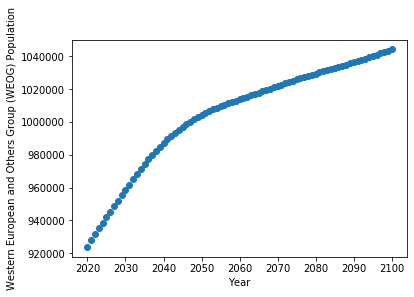

(array([[5747.54525994]]), array([[1298.17461059]]))


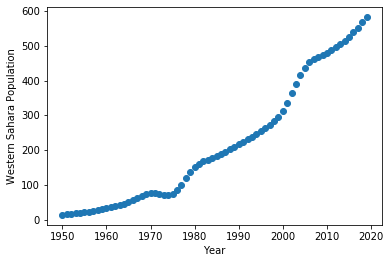

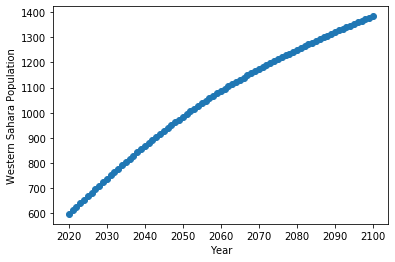

(array([[8.55530961]]), array([[9.71807168]]))


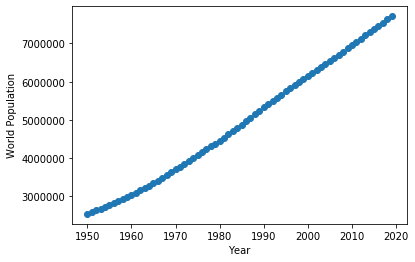

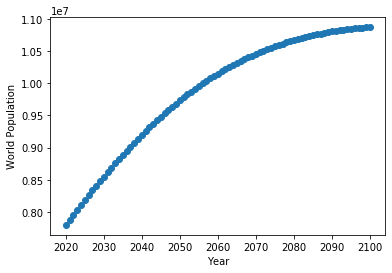

(array([[77750.27021165]]), array([[37728.24546642]]))


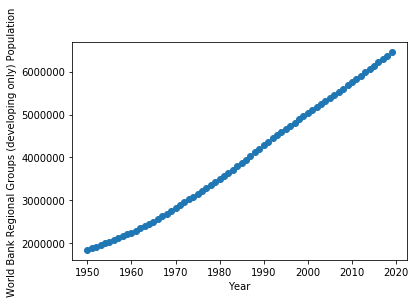

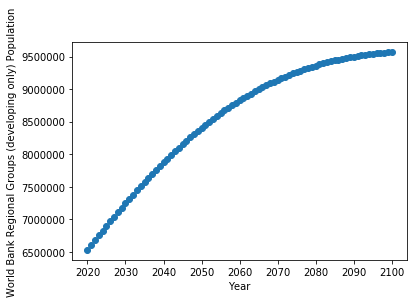

(array([[69604.15559185]]), array([[37606.14059099]]))


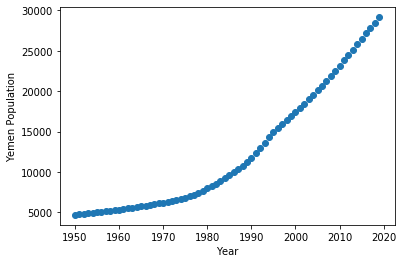

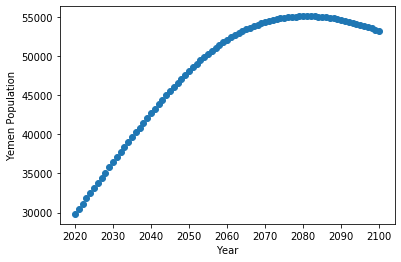

(array([[356.02115047]]), array([[301.55686538]]))


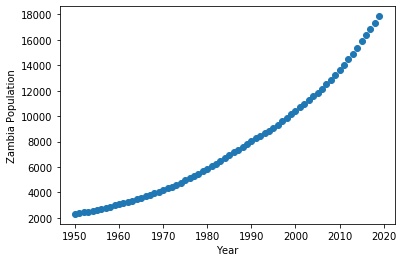

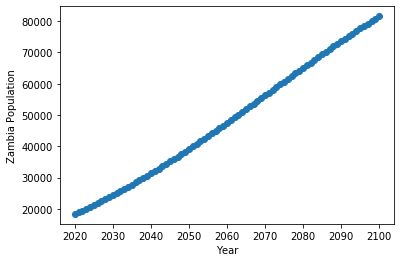

(array([[213.5734579]]), array([[816.65245253]]))


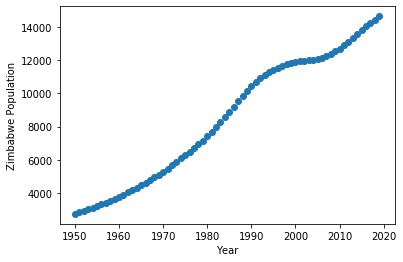

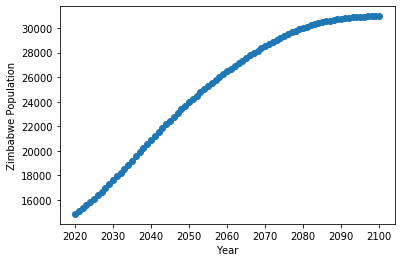

(array([[185.31904976]]), array([[216.31832821]]))
                                         Country             past GR  \
0                                    Afghanistan   397.3285197095617   
0                                         Africa  15142.432228396463   
0                                  African Group   15120.61682799405   
0                                  African Union  15129.172137608255   
0                  African Union: Central Africa  1750.2206176012596   
..                                           ...                 ...   
0                                          World    77750.2702116525   
0   World Bank Regional Groups (developing only)    69604.1555918467   
0                                          Yemen   356.0211504680255   
0                                         Zambia  213.57345789519718   
0                                       Zimbabwe  185.31904975942606   

             future GR  
0    474.2300459349594  
0    38440.98109593496  
0    3842

In [13]:
from sklearn.linear_model import LinearRegression
countryfeatures = pd.DataFrame (columns = ['Country','past GR','future GR'])
#datacountry = {'Country': 'Spain','past GR': [5], 'future GR':[6] }
#datacountry = pd.DataFrame.from_dict(datacountry)

def gr(country):
    scd = rd[rd['Location']==country]
    #cd selected country data
    pscd = np.array(scd['PopTotal'])
    yscd = np.array(scd['Time'])
    #print(pscd)
    lon = 2020 - yscd[0]
    tlon=len(yscd)
    #print(lon)
    #past data
    X = np.array(yscd[0:lon])
    y =np.array(pscd[0:lon])
    X = X.reshape(-1,1)
    y = y.reshape(-1,1)
    plt.scatter(X,y)
    plt.xlabel('Year')
    plt.ylabel(country + ' Population')
    plt.show()

    reg = LinearRegression()
    reg.fit(X,y)

    reg.coef_

    past_gr=reg.coef_

    #future data 
    X = np.array(yscd[lon:tlon])
    y =np.array(pscd[lon:tlon])
    X = X.reshape(-1,1)
    y = y.reshape(-1,1)
    plt.scatter(X,y)
    plt.xlabel('Year')
    plt.ylabel(country + ' Population')
    plt.show()

    reg = LinearRegression()
    reg.fit(X,y)

    reg.coef_
    
    future_gr = reg.coef_
    #print(future_gr.squeeze())
  
        
    return past_gr, future_gr

for n in lc:
    results = gr(n)
    print(results)
    datacountry = {'Country': n,'past GR': [results[0].squeeze()], 'future GR':[results[1].squeeze()] }
    datacountry = pd.DataFrame.from_dict(datacountry)
    #print(datacountry)
    countryfeatures = countryfeatures.append(datacountry)
    #print(countryfeatures)
    #print(datacountry)

print(countryfeatures)




In [14]:
print(countryfeatures)
countryfeatures =countryfeatures.reset_index(drop = True)
print(countryfeatures)

                                         Country             past GR  \
0                                    Afghanistan   397.3285197095617   
0                                         Africa  15142.432228396463   
0                                  African Group   15120.61682799405   
0                                  African Union  15129.172137608255   
0                  African Union: Central Africa  1750.2206176012596   
..                                           ...                 ...   
0                                          World    77750.2702116525   
0   World Bank Regional Groups (developing only)    69604.1555918467   
0                                          Yemen   356.0211504680255   
0                                         Zambia  213.57345789519718   
0                                       Zimbabwe  185.31904975942606   

             future GR  
0    474.2300459349594  
0    38440.98109593496  
0    38425.31205880759  
0   38435.030130487816  
0    5936.

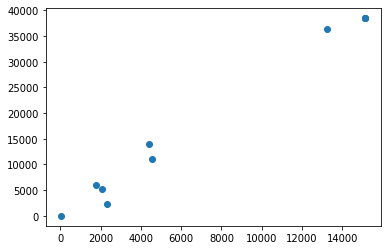

<class 'list'>
[[15142.432228396463, 38440.98109593496], [15120.61682799405, 38425.31205880759], [15129.172137608255, 38435.030130487816], [1750.2206176012596, 5936.251715582656], [4571.402990674481, 11051.984236156279], [2334.0168624267335, 2207.5707422538394], [2089.2987977079865, 5186.415829968384], [4384.232869197795, 14052.80760652665], [13250.057700901058, 36258.69178093948], [27.30426379144432, -23.502513504968388]]
474
474
[0 2 2 2 0 1 0 0 1 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 2 1 0 0 0 0 0 0 0 0 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 2 1 0 0 0 0 0 2 2 2 2 0 0 0 0 0 0
 0 1 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

In [15]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors = 2)
sample = countryfeatures.loc[1:10, ['past GR', 'future GR']]
sample = sample.to_numpy(dtype = np.dtype(np.float))
X = sample[:,0]
y = sample[:,1]
plt.scatter(X,y)
plt.show()
sample = sample.tolist()
print(type(sample))
print(sample)

labels = [2,2,2,0,1,0,0,1,2,0,]

classifier.fit(sample, labels)
ind= len(countryfeatures)
datapredict = countryfeatures.loc[0:ind,['past GR', 'future GR']]
datapredict = datapredict.to_numpy(dtype = np.dtype(np.float))
datapredict = datapredict.tolist()
print(len(classifier.predict(datapredict)))
print(len(lc))
print(classifier.predict(datapredict))

In [16]:
countryfeatures['Classification']=classifier.predict(datapredict)

In [17]:
print(countryfeatures)

                                          Country             past GR  \
0                                     Afghanistan   397.3285197095617   
1                                          Africa  15142.432228396463   
2                                   African Group   15120.61682799405   
3                                   African Union  15129.172137608255   
4                   African Union: Central Africa  1750.2206176012596   
..                                            ...                 ...   
469                                         World    77750.2702116525   
470  World Bank Regional Groups (developing only)    69604.1555918467   
471                                         Yemen   356.0211504680255   
472                                        Zambia  213.57345789519718   
473                                      Zimbabwe  185.31904975942606   

              future GR  Classification  
0     474.2300459349594               0  
1     38440.98109593496               2

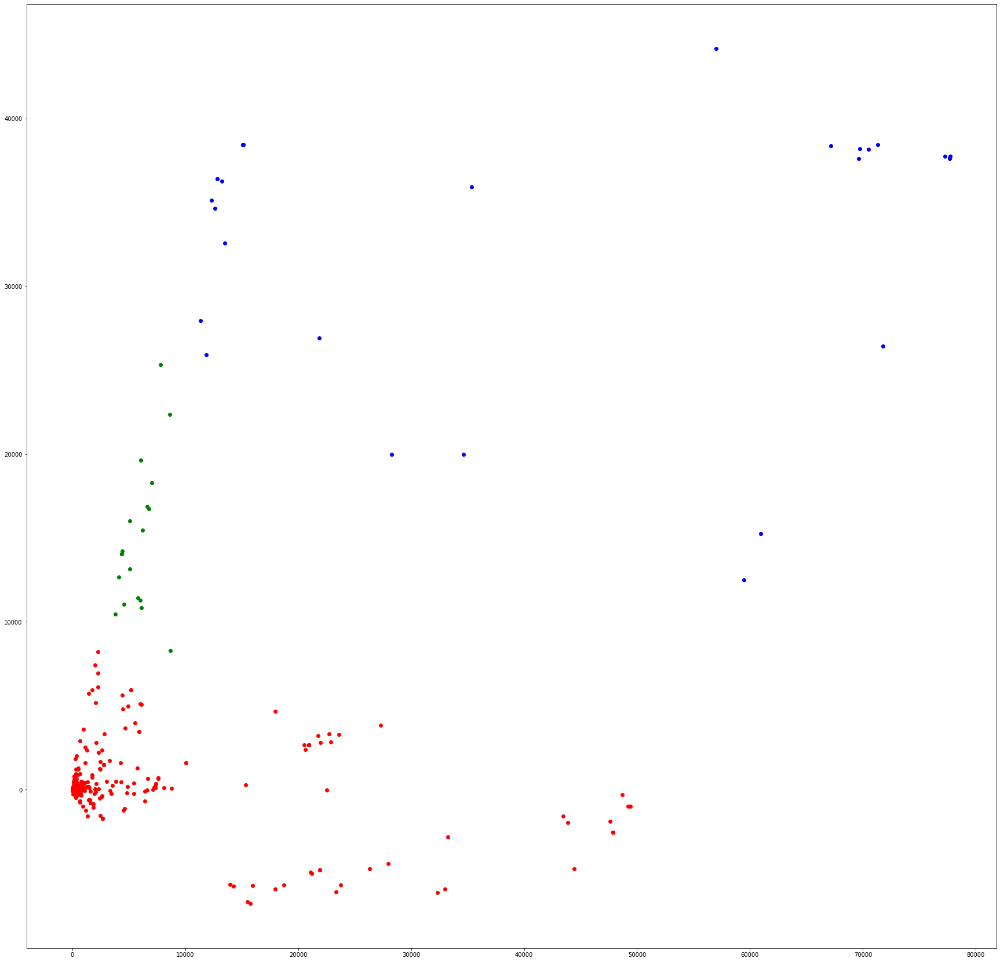

In [43]:
colors={0:'r',1:'g',2:'b'}


for i in range(len(countryfeatures)):
    x1 = countryfeatures.iloc[i,1]
    y1 = countryfeatures.iloc[i,2]
    name = countryfeatures.iloc[i,0]
    color = colors.get(countryfeatures.iloc[i,3])    
    plt.scatter(x1,y1, c = color)
    plt.gcf().set_size_inches((30, 30))
    #activate line bellow to see each country
    #plt.text(x1 * (1 + 0.01), y1 * (1 + 0.01) , name, fontsize=15)
plt.show()
     
    